In [ ]:
#!pip install openpyxl for reading excel

In [151]:
import data_cleaning as dc
import seaborn as sns
import matplotlib.pyplot as plt
import time
from datetime import timedelta
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Activation, InputLayer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import plot_model
dc.main()

The first step in our pipeline involves loading the data into a pandas DataFrame. This is accomplished using the pandas library, which is imported at the beginning of the script.

In [152]:
# Step 1: Load the data
import pandas as pd

df = pd.read_csv('./data/MMNames_clean.csv')

In [153]:
# Step 2: Prepare the data
import data_preprocessing as dp
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

df = dp.preprocess_category(df,'SR_Name')
df = dp.preprocess_onehot(df,'name')

y = df['SR_Name'].values 
X = df.drop(columns=['SR_Name']).values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
print(X_train.shape, X_test.shape)


(13659, 13003) (5854, 13003)


In [154]:
# Step 3: Build a NN model with TensorFlow
import tensorflow as tf

def create_classification_model(input_shape, num_classes, params={}):
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(shape=input_shape),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(16, activation='relu'),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    
    return model,'4layer based model 3 layer'

In [155]:
# Step 4: Create and train the model
model,_ = create_classification_model(input_shape=[X_train.shape[1]],num_classes=len(df['SR_Name'].unique()), )

start_time = time.time()
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=0)
end_time = time.time()
total_seconds = end_time-start_time
training_time = str(timedelta(seconds=total_seconds)).split(".")[0]  # Remove microseconds
print(f"Total training time: {training_time}")


Total training time: 0:01:59


In [158]:
model.summary()

Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_263 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,250,888 (4.77 MB)

 Trainable params: 416,962 (1.59 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 833,926 (3.18 MB)

In [157]:
# Step 5: Evaluate the model

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

y_pred_test = model.predict(X_test, batch_size=32, verbose=0)
y_pred_test = y_pred_test.argmax(axis=1)
report = classification_report(y_test, y_pred_test, output_dict=True)
report_df_test = pd.DataFrame(report).round(2).transpose()
report_df_test.to_csv('./data/cls_report_test.csv', index=False)

y_pred_train = model.predict(X_train, batch_size=32, verbose=0)
y_pred_train = y_pred_train.argmax(axis=1)
report = classification_report(y_train, y_pred_train, output_dict=True)
report_df_train = pd.DataFrame(report).round(2).transpose()
report_df_train.to_csv('./data/cls_report_train.csv', index=False)


In [40]:
from sklearn.metrics import classification_report, accuracy_score
accuracy = accuracy_score(y_train, y_pred_train)
print(accuracy)
accuracytest = accuracy_score(y_test, y_pred_test)
print(accuracytest)

0.8652902847939088
0.2828834984625897


In [38]:
report

{'0': {'precision': 0.8091647331786543,
  'recall': 0.8936579115951313,
  'f1-score': 0.8493150684931506,
  'support': 1561.0},
 '1': {'precision': 0.8481228668941979,
  'recall': 0.7669753086419753,
  'f1-score': 0.8055105348460292,
  'support': 648.0},
 '2': {'precision': 0.706140350877193,
  'recall': 0.8458844133099825,
  'f1-score': 0.7697211155378486,
  'support': 571.0},
 '3': {'precision': 0.9707207207207207,
  'recall': 0.9930875576036866,
  'f1-score': 0.9817767653758542,
  'support': 434.0},
 '4': {'precision': 0.9277504105090312,
  'recall': 0.9112903225806451,
  'f1-score': 0.919446704637917,
  'support': 620.0},
 '5': {'precision': 0.9709302325581395,
  'recall': 0.9597701149425287,
  'f1-score': 0.9653179190751445,
  'support': 174.0},
 '6': {'precision': 0.8260869565217391,
  'recall': 0.94750656167979,
  'f1-score': 0.882640586797066,
  'support': 381.0},
 '7': {'precision': 0.8466579292267365,
  'recall': 0.8177215189873418,
  'f1-score': 0.8319381841596909,
  'suppor

In [37]:
report_df_test

,precision,recall,f1-score,support
0,0.14,0.78,0.23,617.00
1,0.44,0.14,0.21,273.00
2,0.32,0.21,0.25,243.00
3,0.90,0.18,0.30,214.00
4,0.60,0.17,0.27,258.00
5,0.89,0.15,0.25,54.00
6,0.44,0.19,0.26,171.00
7,0.50,0.25,0.34,664.00
8,0.53,0.19,0.28,569.00
9,0.50,0.25,0.33,199.00


In [49]:
def visualization(ytrain,ytest,ypredtrain,ypredtest,historys,reportdftrain,reportdftest,name):
    ##Accuracy and loss curve
    plt.figure(figsize=(12, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(historys.history['accuracy'], label='Train Acc')
    plt.plot(historys.history['val_accuracy'], label='Val Acc')
    plt.title(f"{name}\nAccuracy Over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(historys.history['loss'], label='Train Loss')
    plt.plot(historys.history['val_loss'], label='Val Loss')
    plt.title(f"{name}\nLoss Over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    plt.tight_layout()
    plt.show()

    ### confusion matrix
    
    cm_test = confusion_matrix(ytest, ypredtest)
    cm_train = confusion_matrix(ytrain, ypredtrain)
    # Create subplot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))  # 1 row, 2 columns

    # Plot train confusion matrix
    sns.heatmap(cm_train, annot=True, fmt='d', cmap='YlGnBu', ax=axes[0])
    axes[0].set_title(f"{name}\nConfusion Matrix - Train")
    axes[0].set_xlabel("Predicted")
    axes[0].set_ylabel("True")

    # Plot test confusion matrix
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='YlGnBu', ax=axes[1])
    axes[1].set_title(f"{name}\nConfusion Matrix - Test")
    axes[1].set_xlabel("Predicted")
    axes[1].set_ylabel("True")

    plt.tight_layout()
    plt.show()
    ####
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))  # 1 row, 2 columns

    # Train classification report
    sns.heatmap(
        reportdftrain.iloc[:-1, :-1],
        annot=True,
        cmap='Blues',
        ax=axes[0],
        annot_kws={"size": 14}
    )
    axes[0].set_title(f"{name}\nClassification Report - Train Set", fontsize=14)
    axes[0].set_xlabel("Metrics", fontsize=13)
    axes[0].set_ylabel("Classes", fontsize=13)
    axes[0].tick_params(axis='x', rotation=45, labelsize=13)
    axes[0].tick_params(axis='y', labelsize=13)

    # Test classification report
    sns.heatmap(
        reportdftest.iloc[:-1, :-1],
        annot=True,
        cmap='Blues',
        ax=axes[1],
        annot_kws={"size": 14}
    )
    axes[1].set_title(f"{name}\nClassification Report - Test Set", fontsize=14)
    axes[1].set_xlabel("Metrics", fontsize=13)
    axes[1].set_ylabel("Classes", fontsize=13)
    axes[1].tick_params(axis='x', rotation=45, labelsize=13)
    axes[1].tick_params(axis='y', labelsize=13)

    plt.tight_layout()
    plt.show()

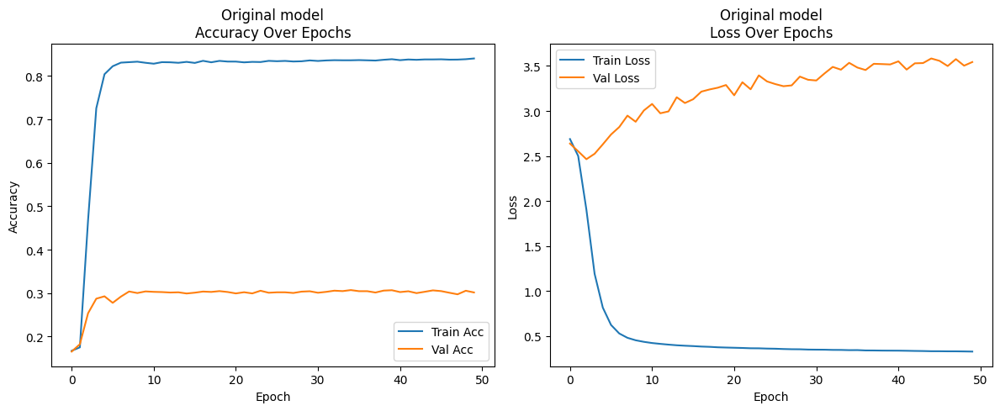

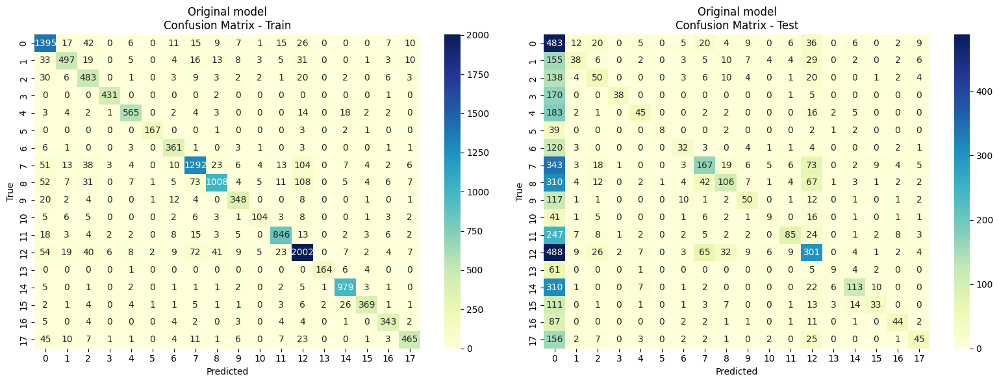

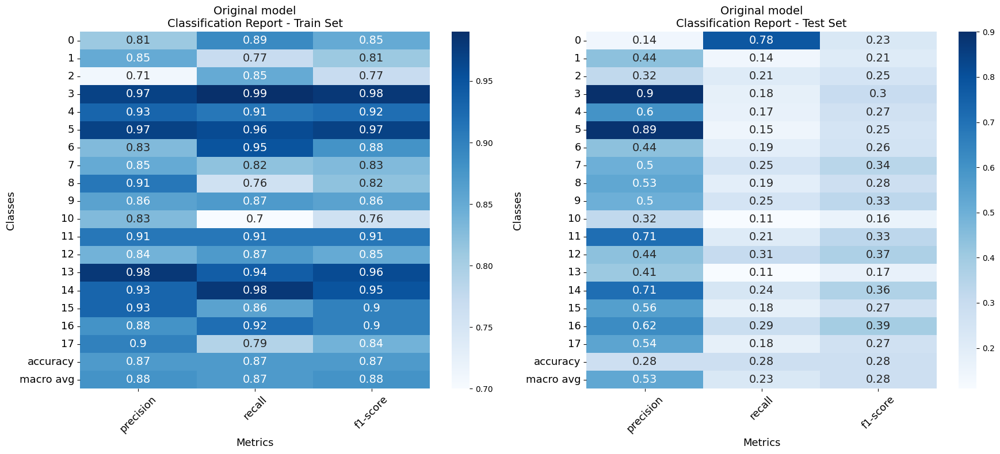

In [50]:
visualization(y_train,y_test,y_pred_train,y_pred_test,history,report_df_train,report_df_test,"Original model")

Total training time: 0:01:19


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,250,888 (4.77 MB)

 Trainable params: 416,962 (1.59 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 833,926 (3.18 MB)

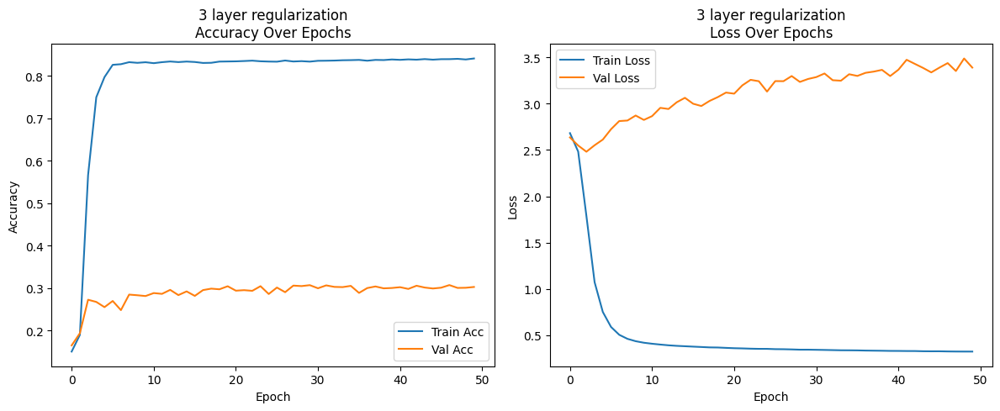

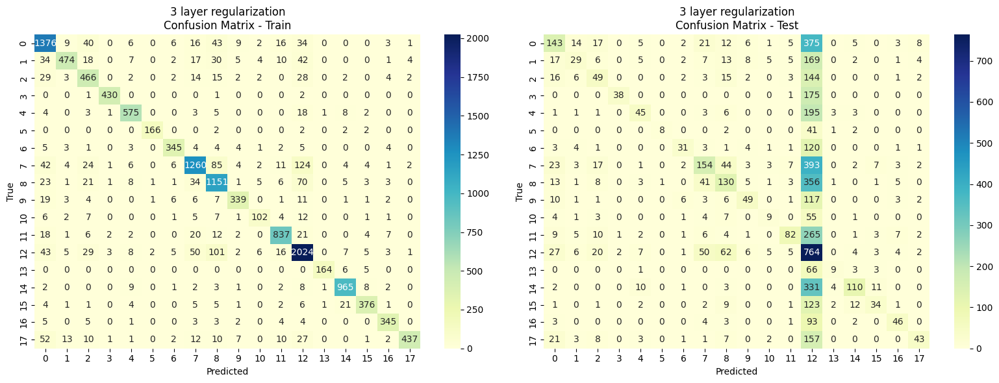

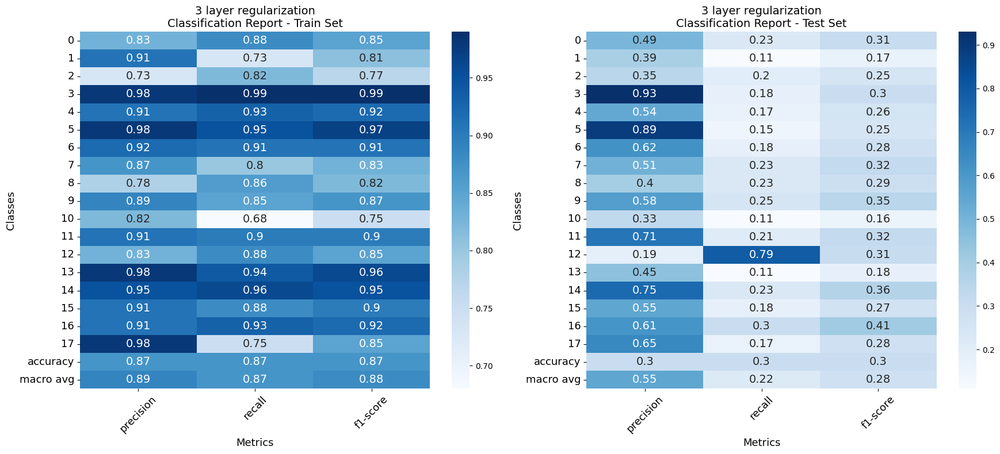

In [71]:

def create_classification_model_test(input_shape, num_classes, params={}):
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(shape=input_shape),
        tf.keras.layers.Dense(32, activation='relu',kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        tf.keras.layers.Dense(16, activation='relu'),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    
    return model,'3 layer regularization'
# Step 4: Create and train the model
modelt,_ = create_classification_model(input_shape=[X_train.shape[1]],num_classes=len(df['SR_Name'].unique()), )

start_time = time.time()
historyt = modelt.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=0)
end_time = time.time()
total_seconds = end_time-start_time
training_timet = str(timedelta(seconds=total_seconds)).split(".")[0]  # Remove microseconds
print(f"Total training time: {training_timet}")
modelt.summary()

y_pred_test = modelt.predict(X_test, batch_size=32, verbose=0)
y_pred_test = y_pred_test.argmax(axis=1)
report = classification_report(y_test, y_pred_test, output_dict=True)
report_df_test = pd.DataFrame(report).round(2).transpose()
# report_df_test.to_csv('./data/cls_report_test.csv', index=False)

y_pred_train = modelt.predict(X_train, batch_size=32, verbose=0)
y_pred_train = y_pred_train.argmax(axis=1)
report = classification_report(y_train, y_pred_train, output_dict=True)
report_df_train = pd.DataFrame(report).round(2).transpose()
# report_df_train.to_csv('./data/cls_report_train.csv', index=False)
visualization(y_train,y_test,y_pred_train,y_pred_test,historyt,report_df_train,report_df_test,'3 layer regularization')
    

Total training time: 0:01:17


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_94 (Dense)                │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,250,888 (4.77 MB)

 Trainable params: 416,962 (1.59 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 833,926 (3.18 MB)

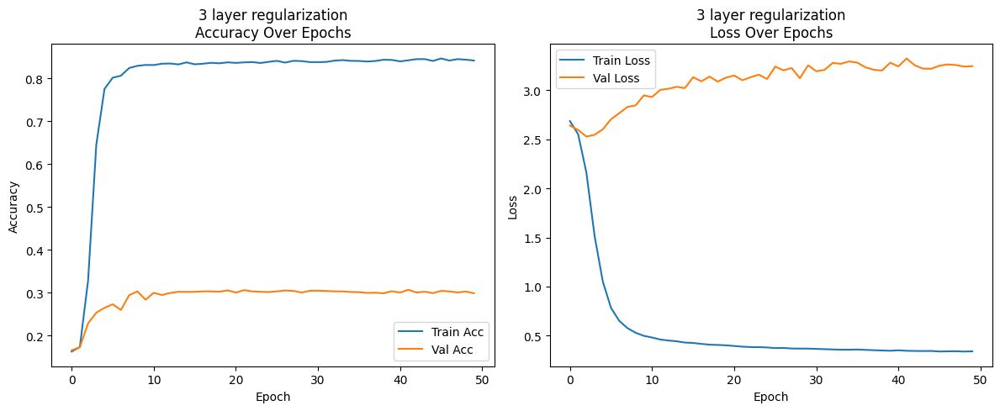

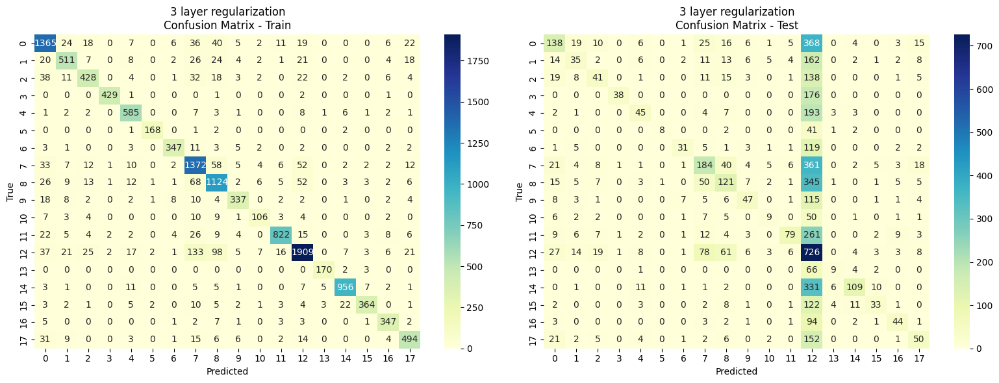

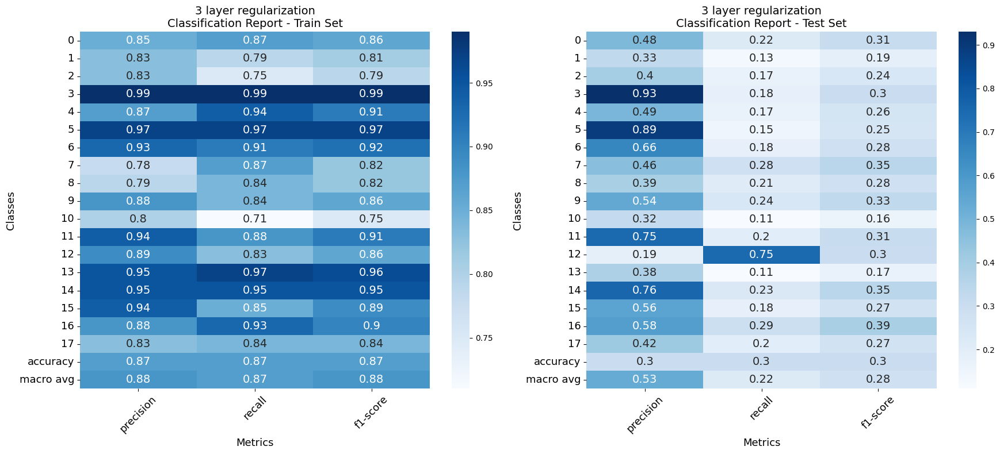

In [72]:

def create_classification_model3(input_shape, num_classes, params={}):
    name='3 layers dropout'
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(shape=input_shape),   
        tf.keras.layers.Dense(32, activation='relu'),  
        tf.keras.layers.Dropout(0.1),
        tf.keras.layers.Dense(16, activation='relu'),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model,name

# Step 4: Create and train the model
modelt,_ = create_classification_model3(input_shape=[X_train.shape[1]],num_classes=len(df['SR_Name'].unique()), )

start_time = time.time()
historyt = modelt.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=0)
end_time = time.time()
total_seconds = end_time-start_time
training_timet = str(timedelta(seconds=total_seconds)).split(".")[0]  # Remove microseconds
print(f"Total training time: {training_timet}")
modelt.summary()

y_pred_test = modelt.predict(X_test, batch_size=32, verbose=0)
y_pred_test = y_pred_test.argmax(axis=1)
report = classification_report(y_test, y_pred_test, output_dict=True)
report_df_test = pd.DataFrame(report).round(2).transpose()
# report_df_test.to_csv('./data/cls_report_test.csv', index=False)

y_pred_train = modelt.predict(X_train, batch_size=32, verbose=0)
y_pred_train = y_pred_train.argmax(axis=1)
report = classification_report(y_train, y_pred_train, output_dict=True)
report_df_train = pd.DataFrame(report).round(2).transpose()
# report_df_train.to_csv('./data/cls_report_train.csv', index=False)
visualization(y_train,y_test,y_pred_train,y_pred_test,historyt,report_df_train,report_df_test,'3 layer regularization')
    

In [48]:
import math
print(X_train.shape)
result2 = math.log2(X_train.shape[1])
print(result2)
for i in range(0,int(result2+5)):
    print(f'{i}: {2**i}')

(13659, 13003)
13.666556894018951
0: 1
1: 2
2: 4
3: 8
4: 16
5: 32
6: 64
7: 128
8: 256
9: 512
10: 1024
11: 2048
12: 4096
13: 8192
14: 16384
15: 32768
16: 65536
17: 131072


In [43]:
print(X_train.shape)

(13659, 13003)


In [145]:
def create_configurable_model(input_shape, num_classes, hidden_units, configs, dropout_rate=0.3, l2_lambda=0.001):
    """
    Generic MLP builder with flexible dropout, L2 regularization, and batch normalization.

    Parameters:
    - input_shape: tuple, input shape (e.g. (20,))
    - num_classes: int, number of output classes
    - hidden_units: list of ints, number of neurons per hidden layer
    - configs: list of dicts, each dict contains:
        {'dropout': bool, 'l2': bool, 'batchnorm': bool}
    - dropout_rate: float, default dropout rate
    - l2_lambda: float, L2 regularization coefficient

    Returns:
    - model: compiled Keras model
    - name: string describing architecture
    """
    assert len(hidden_units) == len(configs), "hidden_units and configs must match in length"

    model = Sequential()
    model.add(InputLayer(input_shape=input_shape))
    name_parts = []

    for i, (units, cfg) in enumerate(zip(hidden_units, configs), start=1):
        reg = l2(l2_lambda) if cfg.get('l2', False) else None
        print(f'i: {i} neurons: {units}\tdropout: {cfg.get("dropout")}\tbatchnorm:{cfg.get("batchnorm")}\tl2:{cfg.get('l2')} reg:{reg}')
        
        model.add(Dense(units, kernel_regularizer=reg, activation=None))

        part = f"L{i}_{units}"
        if cfg.get('l2', False): part += "_reg2"
        if cfg.get('batchnorm', False): part += "_BN"
        if cfg.get('dropout', False): part += "_DO"
        print(f'part: {part}')

        name_parts.append(part)

        if cfg.get('batchnorm', False):
            print("Adding batch normalization")
            model.add(BatchNormalization())
        
        model.add(Activation('relu'))

        if cfg.get('dropout', False):
            print(f"Adding Dropout:{dropout_rate}")
            model.add(Dropout(dropout_rate))
        if reg!=None: print("Adding regularization")
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    model_name = "__".join(name_parts)
    return model, model_name
def trainmultiplemodels(model_functions):
    # Dictionary to store all model info
    info_4 = {}
    yclass = len(df['SR_Name'].unique())
    for idx, (hidden_units, configs) in enumerate(model_functions):
        # Create model and get its name
        models, name = create_configurable_model(
            input_shape=(X_train.shape[1],),
            num_classes=yclass,
            hidden_units=hidden_units,
            configs=configs
        )
        print(name)
        ## Train the model and record time
        start_time = time.time()
        history = models.fit(X_train, y_train, epochs=20, batch_size=32,validation_data=(X_test, y_test), verbose=0)
        end_time = time.time()
        training_time = str(timedelta(seconds=end_time-start_time)).split(".")[0]

        
        models.summary()
        # Predict on Train
        y_pred_train = models.predict(X_train, batch_size=32, verbose=0).argmax(axis=1)
        report_train = classification_report(y_train, y_pred_train, output_dict=True)
        report_train_df = pd.DataFrame(report_train).round(2).transpose()
        report_train_df.to_csv(f'./data/cls_report_train_{name}.csv', index=False)
        cm_train = confusion_matrix(y_train, y_pred_train)
        acc_train = accuracy_score(y_train, y_pred_train)

        avg_type = 'weighted avg'
        
        # Predict on Test
        y_pred_test = models.predict(X_test, batch_size=32, verbose=0).argmax(axis=1)
        report_test = classification_report(y_test, y_pred_test, output_dict=True)
        report_test_df = pd.DataFrame(report_test).round(2).transpose()
        report_test_df.to_csv(f'./data/cls_report_test_{name}.csv', index=False)
        cm_test = confusion_matrix(y_test, y_pred_test)
        acc_test = accuracy_score(y_test, y_pred_test)

        # Store results
        # info[name] = {
        #     "model": model,
        #     "history": history.history,
        #     "train_report": report_train_df,
        #     "test_report": report_test_df,
        #     "train_accuracy": round(acc_train, 4),
        #     "test_accuracy": round(acc_test, 4),
        #     "train_precision": round(report_train[avg_type]['precision'], 4),
        #     "test_precision": round(report_test[avg_type]['precision'], 4),
        #     "train_recall": round(report_train[avg_type]['recall'], 4),
        #     "test_recall": round(report_test[avg_type]['recall'], 4),
        #     "train_f1_score": round(report_train[avg_type]['f1-score'], 4),
        #     "test_f1_score": round(report_test[avg_type]['f1-score'], 4),
        #     "confusion_matrix_train": cm_train,
        #     "confusion_matrix_test": cm_test,
        #     "training_time": training_time
        # }
        info_4[name] = {
            "model": models,
            "history": history.history,
            "train_report": report_train_df,
            "test_report": report_test_df,
            "train_accuracy": round(acc_train, 4),
            "test_accuracy": round(acc_test, 4),
            # weighted avg metrics
            "train_precision_weighted": round(report_train['weighted avg']['precision'], 4),
            "test_precision_weighted": round(report_test['weighted avg']['precision'], 4),
            "train_recall_weighted": round(report_train['weighted avg']['recall'], 4),
            "test_recall_weighted": round(report_test['weighted avg']['recall'], 4),
            "train_f1_score_weighted": round(report_train['weighted avg']['f1-score'], 4),
            "test_f1_score_weighted": round(report_test['weighted avg']['f1-score'], 4),
            # macro avg metrics
            "train_precision_macro": round(report_train['macro avg']['precision'], 4),
            "test_precision_macro": round(report_test['macro avg']['precision'], 4),
            "train_recall_macro": round(report_train['macro avg']['recall'], 4),
            "test_recall_macro": round(report_test['macro avg']['recall'], 4),
            "train_f1_score_macro": round(report_train['macro avg']['f1-score'], 4),
            "test_f1_score_macro": round(report_test['macro avg']['f1-score'], 4),
            "confusion_matrix_train": cm_train,
            "confusion_matrix_test": cm_test,
            "training_time": training_time
        }
        
        # Print results
        print(f"\nModel: {name}")
        print(f"Training time: {training_time}")
        visualization(y_train,y_test,y_pred_train,y_pred_test,history,report_train_df,report_test_df,name)
    return info_4

In [ ]:
hidden_units_list = [
    ##1 original
    [32, 16],
    ##2 original add dropout1
    [32, 16],
    ##3 original add dropout2
    [32, 16],
    ##4 
    [32, 16],
    ##5 
    [32, 16],
    ##6 
    [32, 16],    
    ##7
    [32, 16],
    ##8 
    [32, 16],
    ##9
    [32, 16],
    ##10 
    [32, 16],
    ##11 
    [32, 16],
    ##12 
    [32, 16],
    ##13 
    [32, 16]
]

configs_list = [
    [   ##1 original
        {'dropout': False,  'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False}
    ],
    [   ##2 original add dropoout1
        {'dropout': True,  'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False}
    ],
    [   ##3 original add dropoout2
        {'dropout': True,  'l2': False, 'batchnorm': False},
        {'dropout': True, 'l2': False, 'batchnorm': False}
    ],
    [   ##4 original add batchnorm1
        {'dropout': False,  'l2': False, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': False}
    ],
    [   ##5 original add batchnorm2
        {'dropout': False,  'l2': False, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': True}
    ],
    [   ##6 original add l21
        {'dropout': False,  'l2': True, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False}
    ],
    [   ##7 original add l22
        {'dropout': False,  'l2': True, 'batchnorm': False},
        {'dropout': False, 'l2': True, 'batchnorm': False}
    ],
    [   ##8 original add l21 dropout1
        {'dropout': True,  'l2': True, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False}
    ],
    [   ##9 original add l21,2 dropout1,2
        {'dropout': True,  'l2': True, 'batchnorm': False},
        {'dropout': True, 'l2': True, 'batchnorm': False}
    ],
    [   ##10 original add batchnorm1, dropout1
        {'dropout': True,  'l2': False, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': False}
    ],
    [   ##11 original add batchnorm12, dropout12
        {'dropout': True,  'l2': False, 'batchnorm': True},
        {'dropout': True, 'l2': False, 'batchnorm': True}
    ],
    [   ##12 original add batchnorm dropout l2 1
        {'dropout': True,  'l2': True, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': False}
    ],
    [   ##13 original add batchnorm dropout 12 12
        {'dropout': True,  'l2': True, 'batchnorm': True},
        {'dropout': True, 'l2': True, 'batchnorm': True}
    ]
    # ],
    # [
    #     {'dropout': True,  'l2': True, 'batchnorm': True},
    #     {'dropout': True,  'l2': False, 'batchnorm': True},
    #     {'dropout': False, 'l2': False, 'batchnorm': False}
    # ]
]

model_functions_3 = list(zip(hidden_units_list, configs_list))
info_3=trainmultiplemodels(model_functions_3)

i: 1 neurons: 32	dropout: False	batchnorm:False	l2:False reg:None
part: L1_32
i: 2 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L2_16
L1_32__L2_16


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_148 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_22 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_23 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,250,888 (4.77 MB)

 Trainable params: 416,962 (1.59 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 833,926 (3.18 MB)


Model: L1_32__L2_16
Training time: 0:00:31


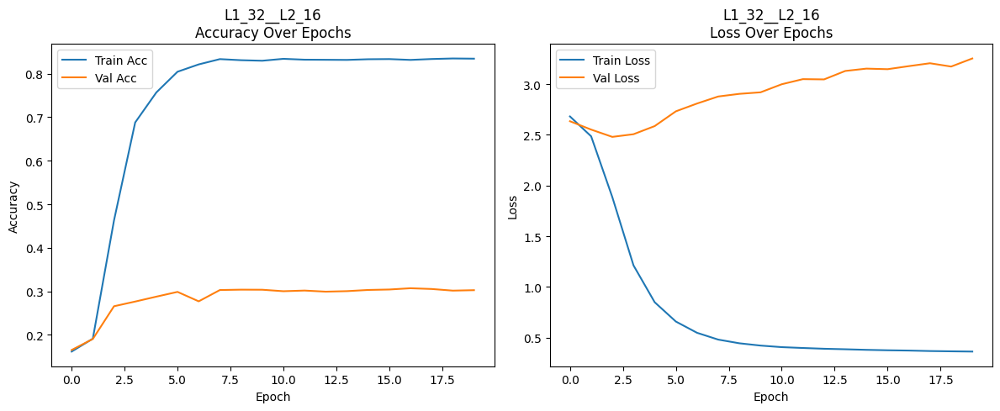

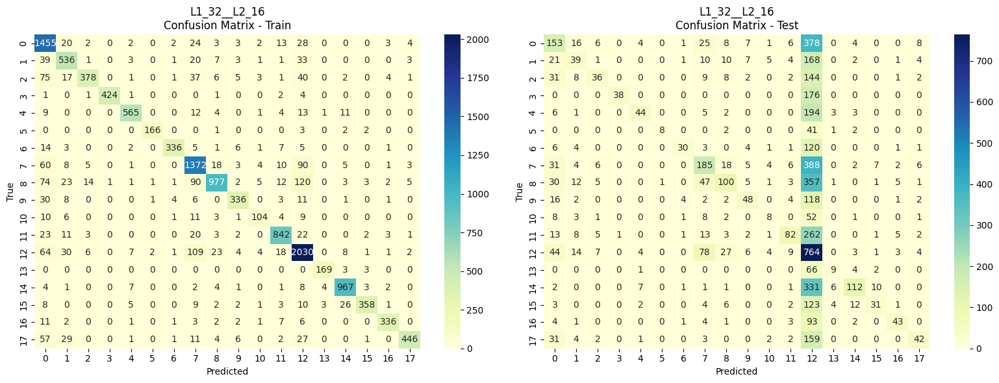

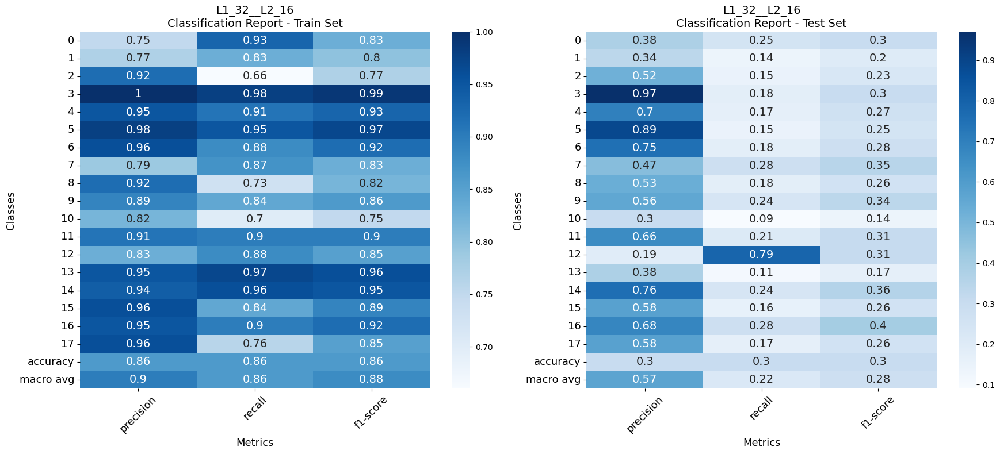

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 32	dropout: True	batchnorm:False	l2:False reg:None
part: L1_32_DO
Adding Dropout:0.3
i: 2 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L2_16
L1_32_DO__L2_16


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_151 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_24 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_25 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,250,888 (4.77 MB)

 Trainable params: 416,962 (1.59 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 833,926 (3.18 MB)


Model: L1_32_DO__L2_16
Training time: 0:00:34


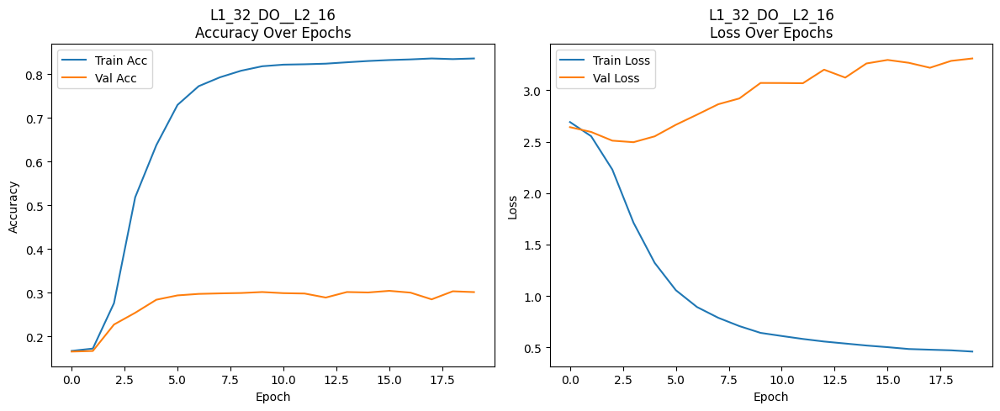

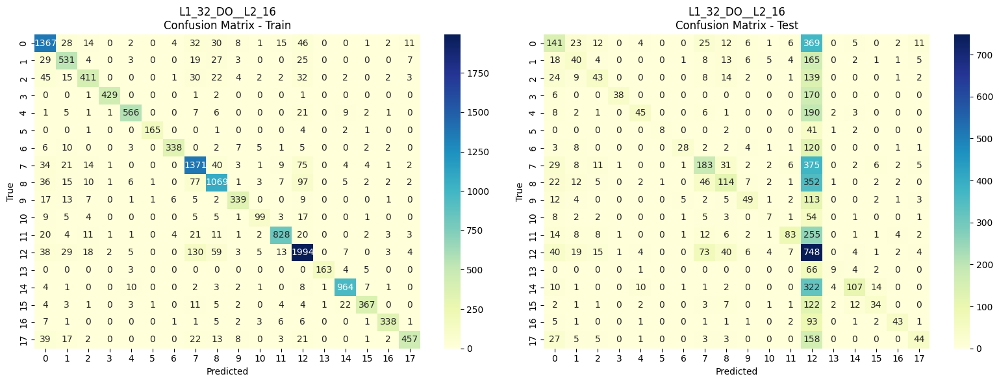

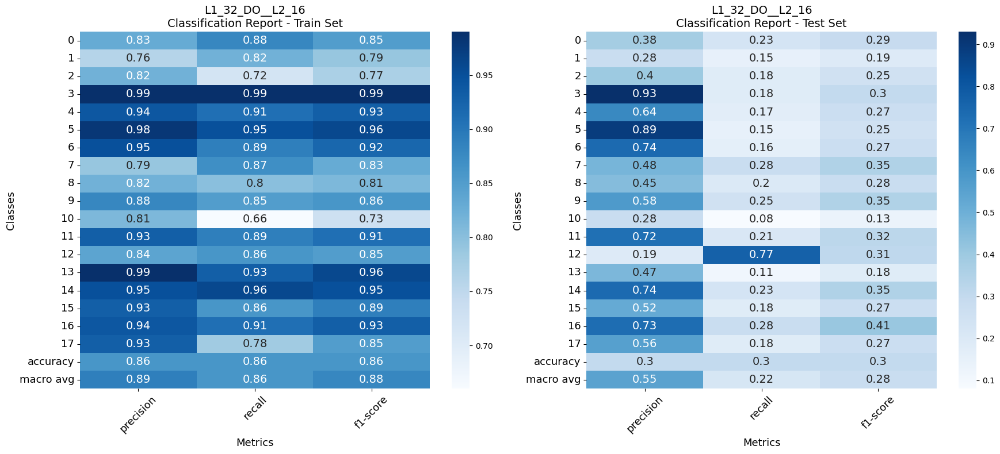

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 32	dropout: True	batchnorm:False	l2:False reg:None
part: L1_32_DO
Adding Dropout:0.3
i: 2 neurons: 16	dropout: True	batchnorm:False	l2:False reg:None
part: L2_16_DO
Adding Dropout:0.3
L1_32_DO__L2_16_DO


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_26 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_27 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,250,888 (4.77 MB)

 Trainable params: 416,962 (1.59 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 833,926 (3.18 MB)


Model: L1_32_DO__L2_16_DO
Training time: 0:00:31


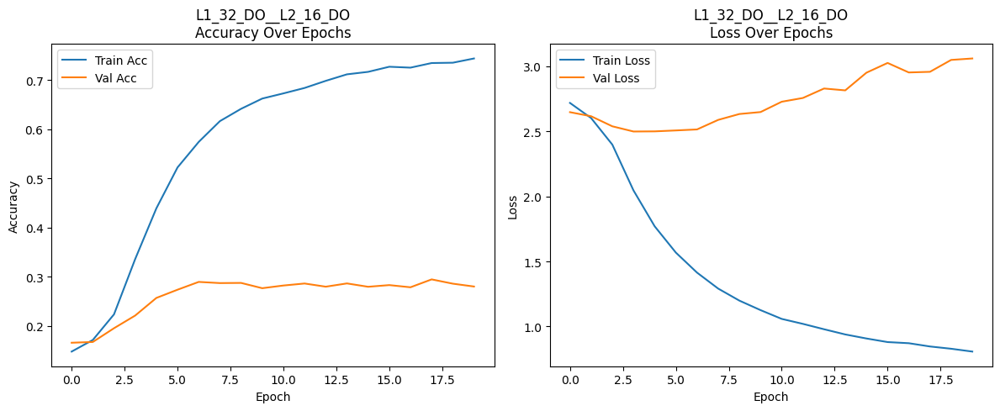

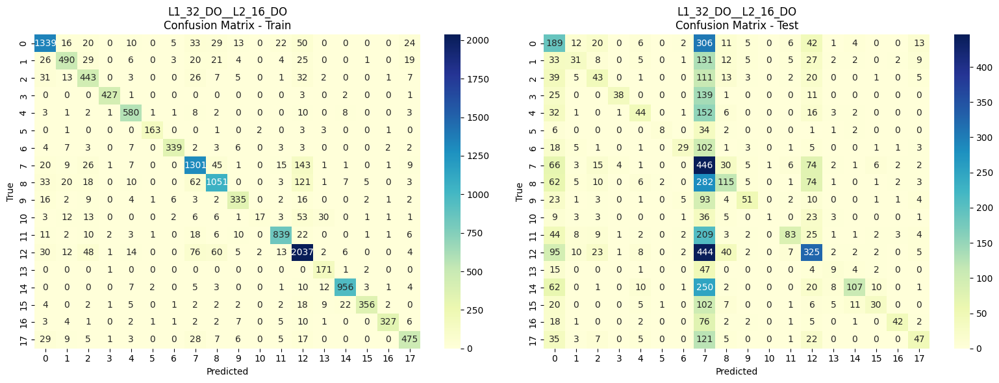

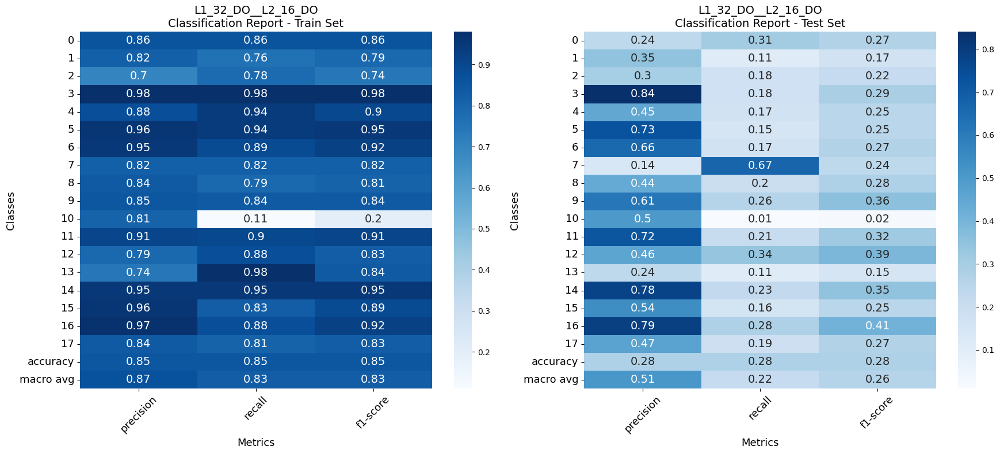

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 32	dropout: False	batchnorm:True	l2:False reg:None
part: L1_32_BN
Adding batch normalization
i: 2 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L2_16
L1_32_BN__L2_16


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_157 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_28 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_29 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,251,144 (4.77 MB)

 Trainable params: 417,026 (1.59 MB)

 Non-trainable params: 64 (256.00 B)

 Optimizer params: 834,054 (3.18 MB)


Model: L1_32_BN__L2_16
Training time: 0:00:32


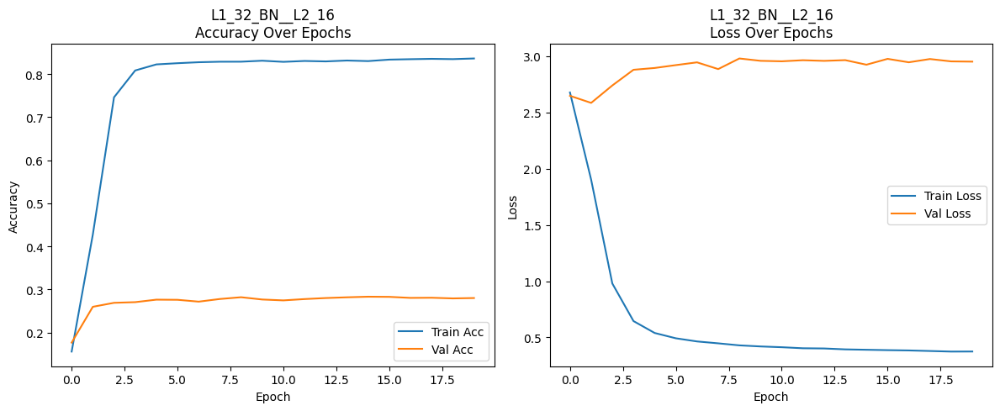

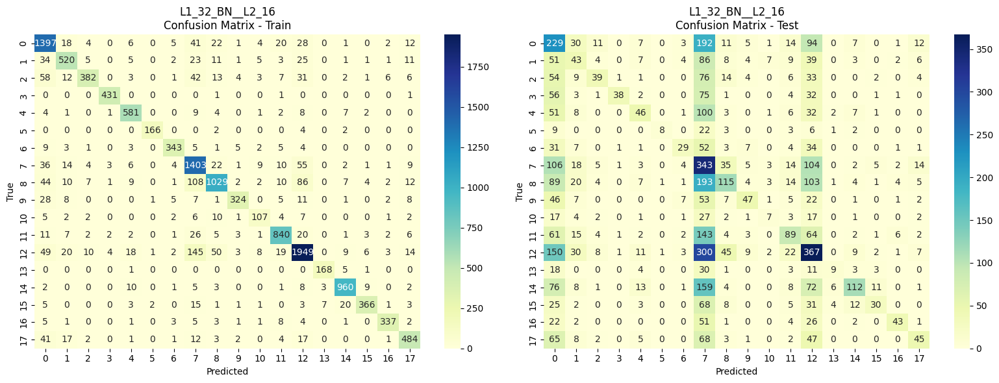

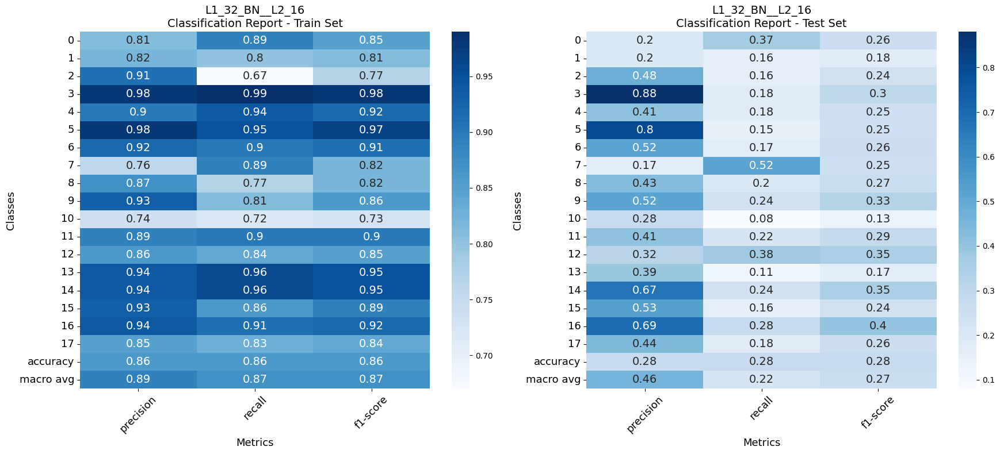

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 32	dropout: False	batchnorm:True	l2:False reg:None
part: L1_32_BN
Adding batch normalization
i: 2 neurons: 16	dropout: False	batchnorm:True	l2:False reg:None
part: L2_16_BN
Adding batch normalization
L1_32_BN__L2_16_BN


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_160 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_30 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_161 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_31 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,251,272 (4.77 MB)

 Trainable params: 417,058 (1.59 MB)

 Non-trainable params: 96 (384.00 B)

 Optimizer params: 834,118 (3.18 MB)


Model: L1_32_BN__L2_16_BN
Training time: 0:00:34


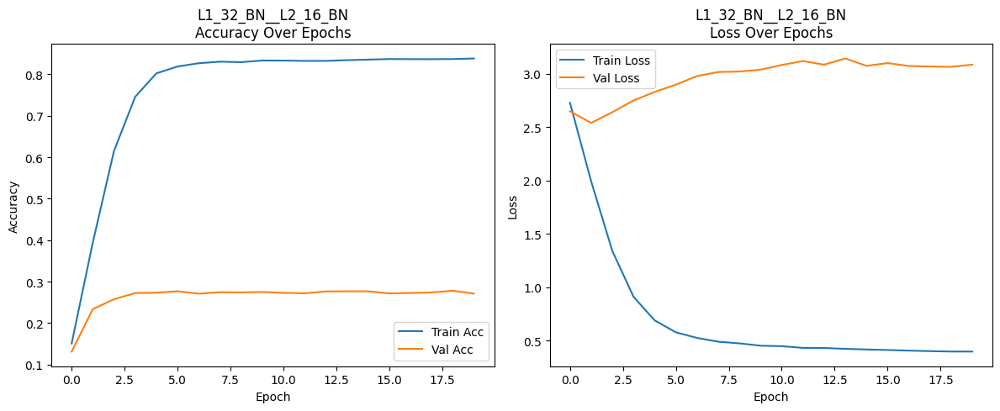

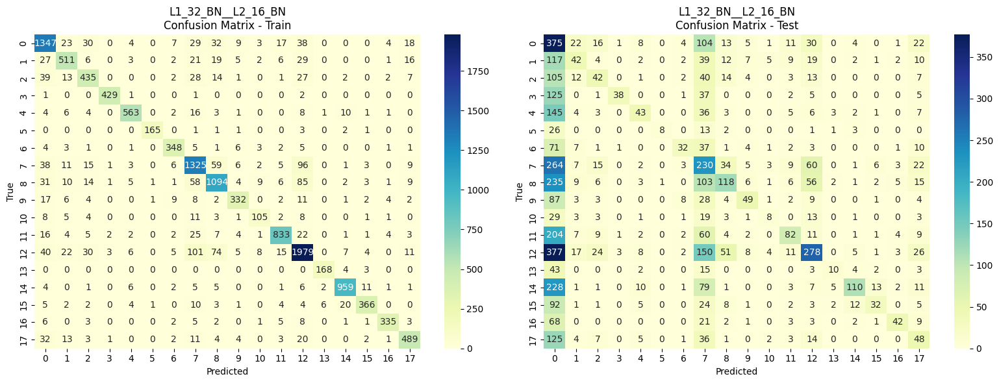

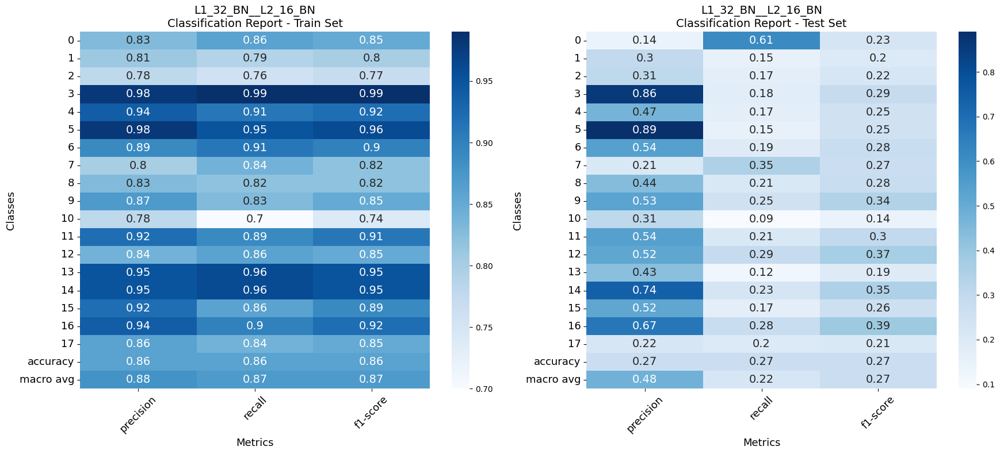

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 32	dropout: False	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235B1BE1DC0>
part: L1_32_L2
Adding regularization
i: 2 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L2_16
L1_32_L2__L2_16


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_163 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_32 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_33 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,250,888 (4.77 MB)

 Trainable params: 416,962 (1.59 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 833,926 (3.18 MB)

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Model: L1_32_L2__L2_16
Training time: 0:00:33


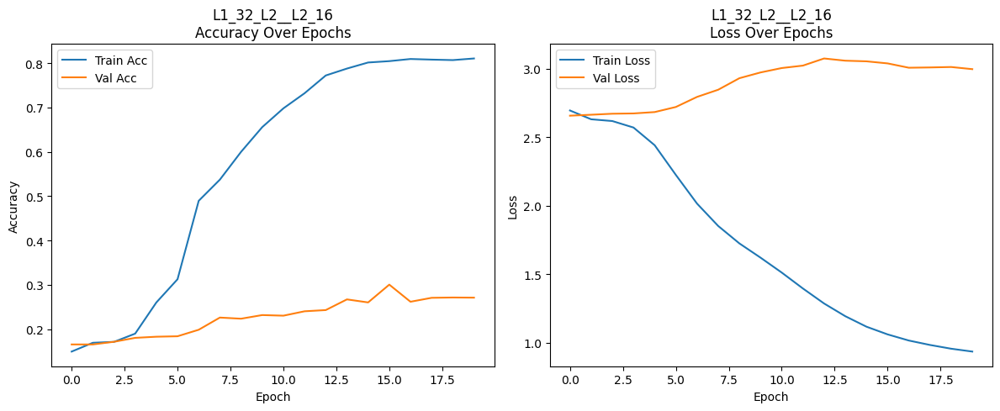

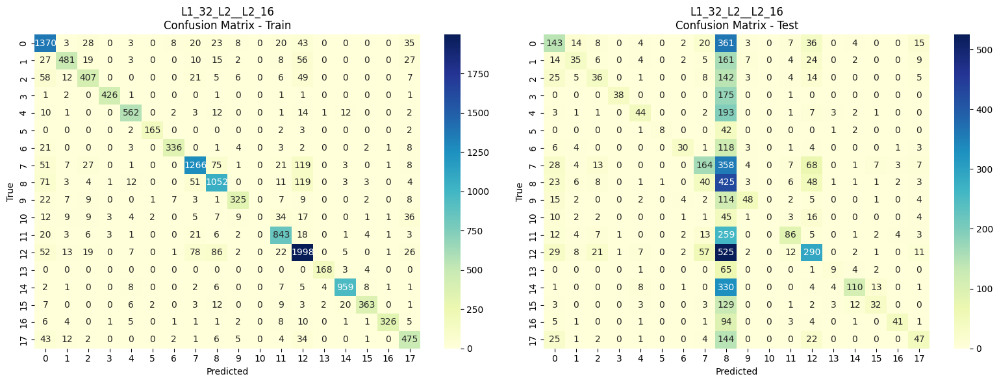

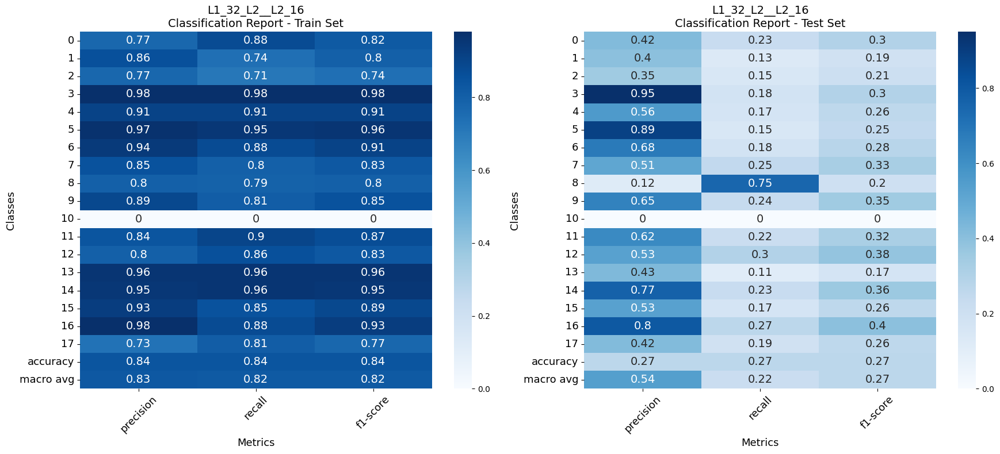

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 32	dropout: False	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x0000023594290650>
part: L1_32_L2
Adding regularization
i: 2 neurons: 16	dropout: False	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235A1AE9850>
part: L2_16_L2
Adding regularization
L1_32_L2__L2_16_L2


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_166 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_34 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_35 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,250,888 (4.77 MB)

 Trainable params: 416,962 (1.59 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 833,926 (3.18 MB)

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Model: L1_32_L2__L2_16_L2
Training time: 0:00:32


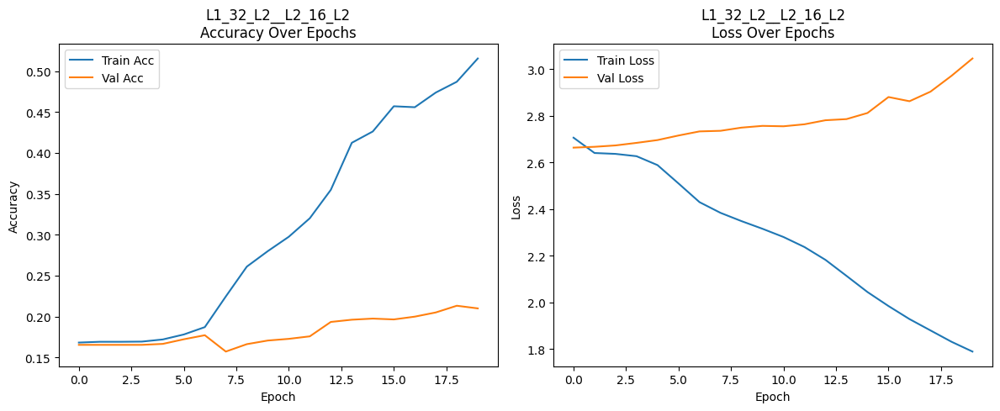

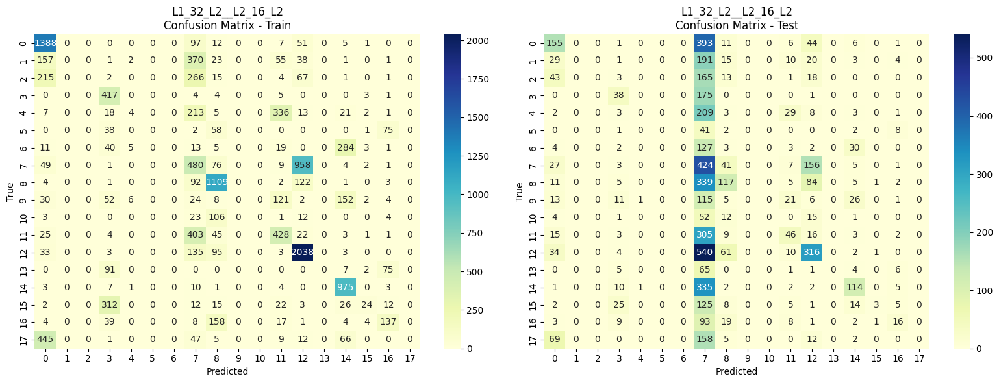

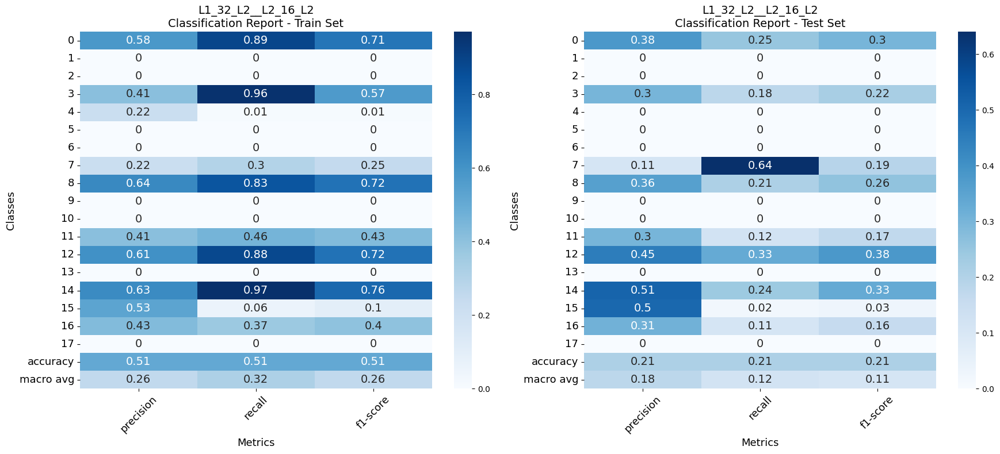

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 32	dropout: True	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235856920F0>
part: L1_32_L2_DO
Adding Dropout:0.3
Adding regularization
i: 2 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L2_16
L1_32_L2_DO__L2_16


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_169 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_36 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_37 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,250,888 (4.77 MB)

 Trainable params: 416,962 (1.59 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 833,926 (3.18 MB)

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Model: L1_32_L2_DO__L2_16
Training time: 0:00:32


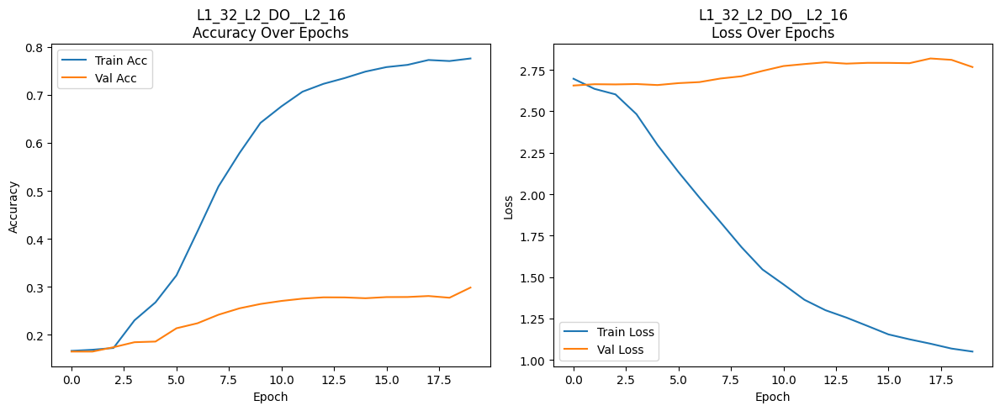

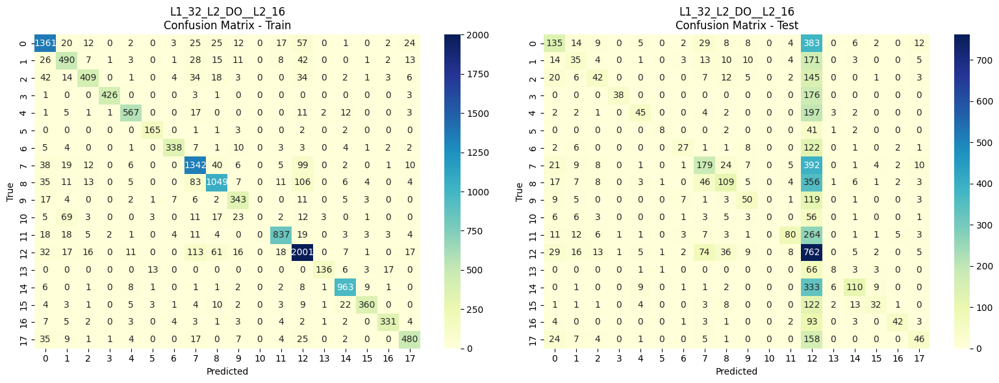

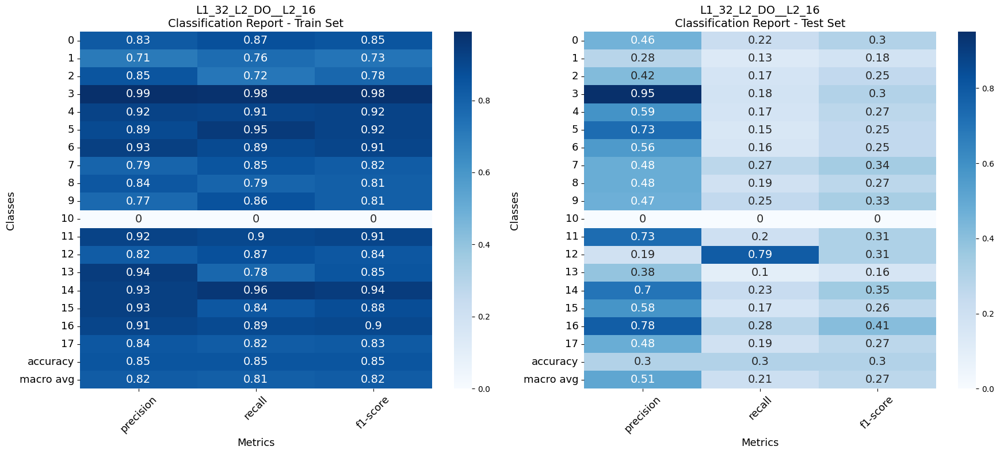

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 32	dropout: True	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235B7F786E0>
part: L1_32_L2_DO
Adding Dropout:0.3
Adding regularization
i: 2 neurons: 16	dropout: True	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x0000023588414FB0>
part: L2_16_L2_DO
Adding Dropout:0.3
Adding regularization
L1_32_L2_DO__L2_16_L2_DO


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_172 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_38 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_39 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,250,888 (4.77 MB)

 Trainable params: 416,962 (1.59 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 833,926 (3.18 MB)

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Model: L1_32_L2_DO__L2_16_L2_DO
Training time: 0:00:35


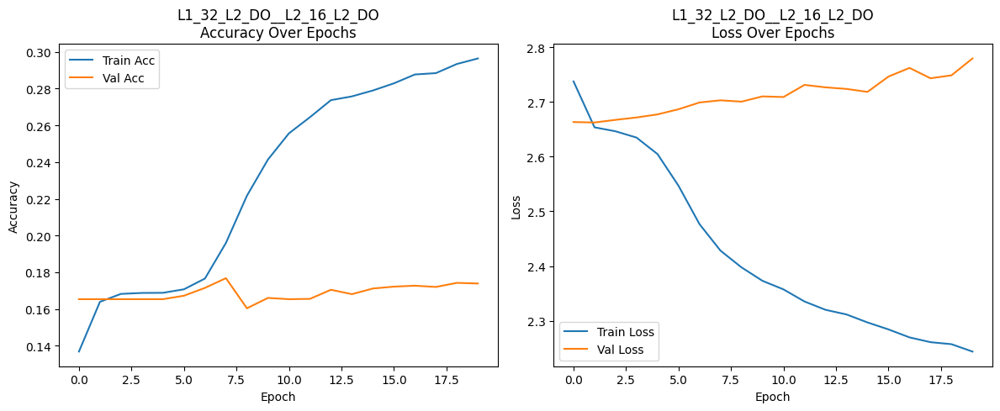

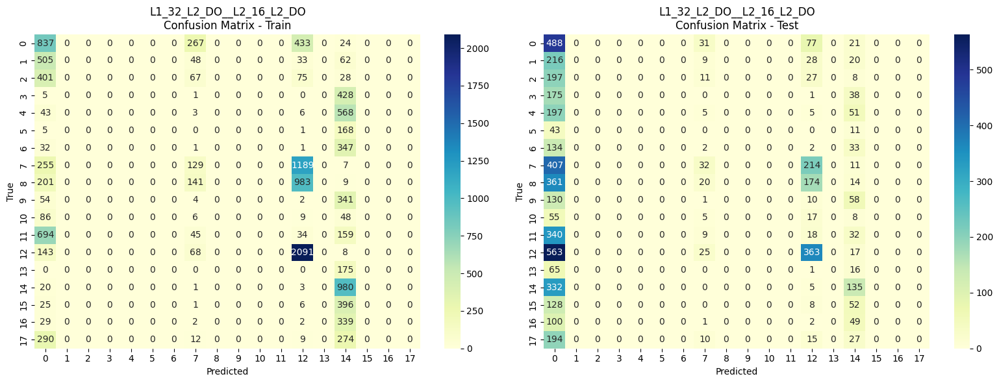

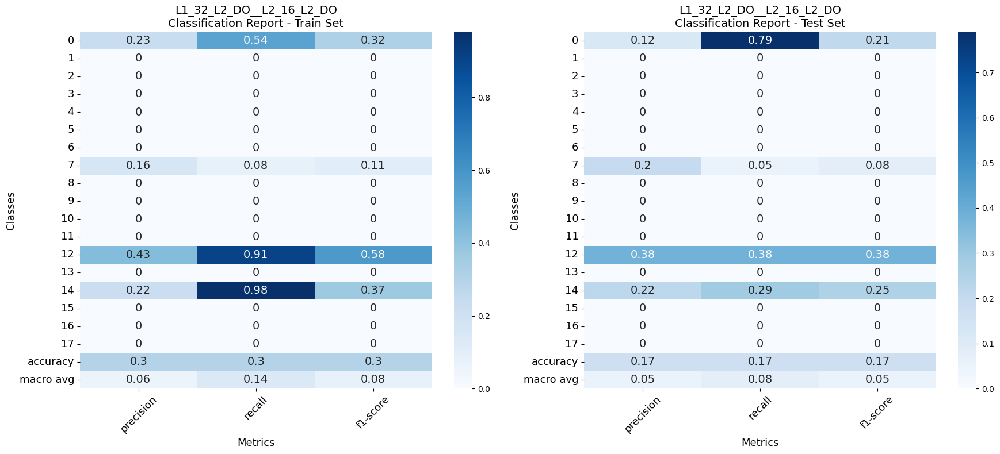

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 32	dropout: True	batchnorm:True	l2:False reg:None
part: L1_32_BN_DO
Adding batch normalization
Adding Dropout:0.3
i: 2 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L2_16
L1_32_BN_DO__L2_16


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_40 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_41 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,251,144 (4.77 MB)

 Trainable params: 417,026 (1.59 MB)

 Non-trainable params: 64 (256.00 B)

 Optimizer params: 834,054 (3.18 MB)


Model: L1_32_BN_DO__L2_16
Training time: 0:00:35


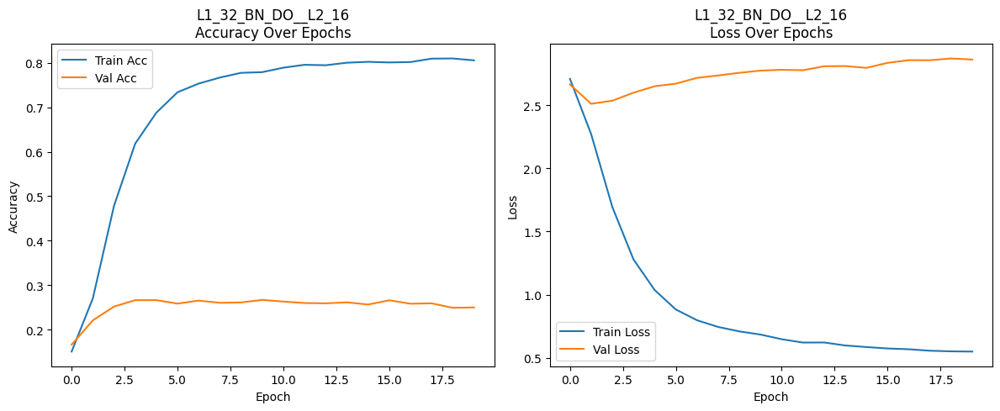

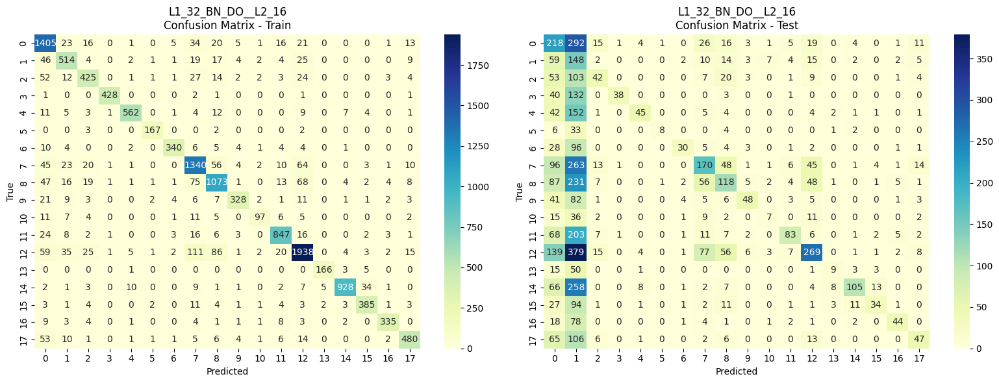

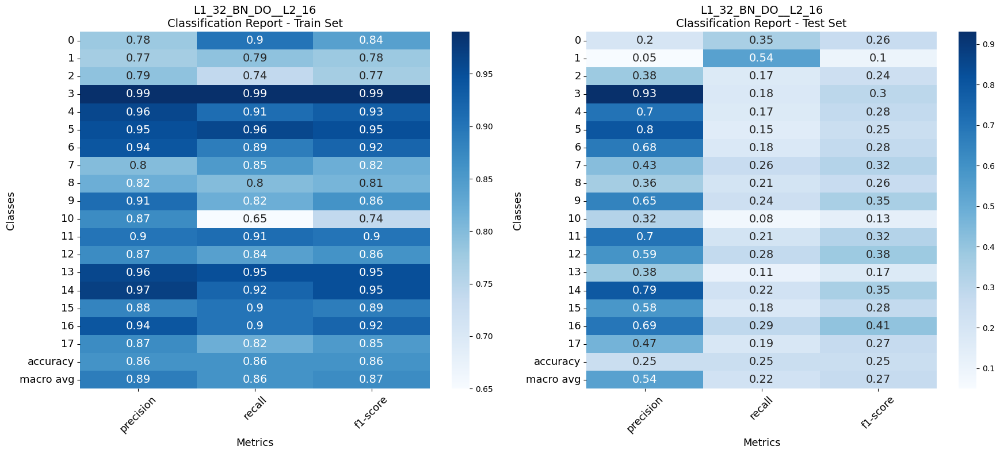

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 32	dropout: True	batchnorm:True	l2:False reg:None
part: L1_32_BN_DO
Adding batch normalization
Adding Dropout:0.3
i: 2 neurons: 16	dropout: True	batchnorm:True	l2:False reg:None
part: L2_16_BN_DO
Adding batch normalization
Adding Dropout:0.3
L1_32_BN_DO__L2_16_BN_DO


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_178 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_42 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_43 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,251,272 (4.77 MB)

 Trainable params: 417,058 (1.59 MB)

 Non-trainable params: 96 (384.00 B)

 Optimizer params: 834,118 (3.18 MB)


Model: L1_32_BN_DO__L2_16_BN_DO
Training time: 0:00:37


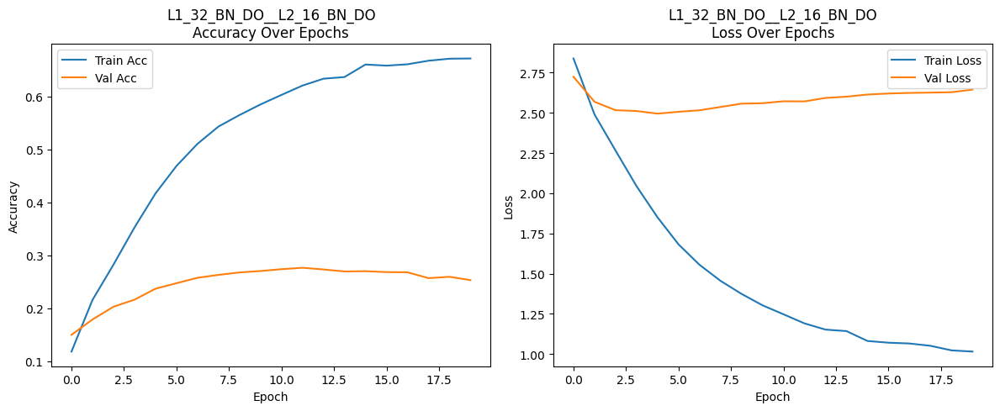

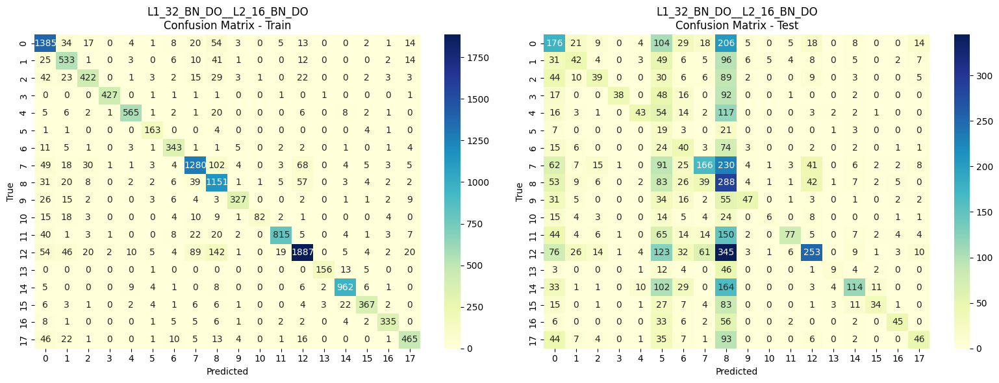

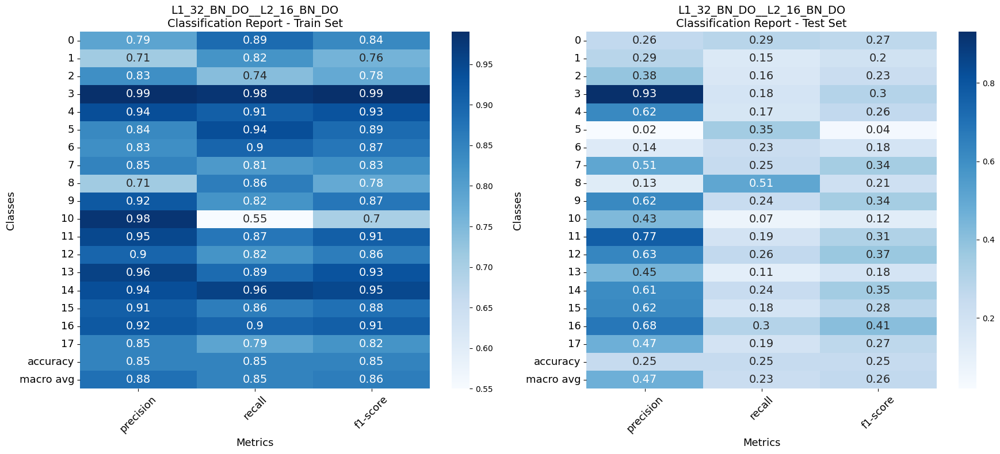

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 32	dropout: True	batchnorm:True	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235A0A89E80>
part: L1_32_L2_BN_DO
Adding batch normalization
Adding Dropout:0.3
Adding regularization
i: 2 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L2_16
L1_32_L2_BN_DO__L2_16


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_181 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_44 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_182 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_45 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,251,144 (4.77 MB)

 Trainable params: 417,026 (1.59 MB)

 Non-trainable params: 64 (256.00 B)

 Optimizer params: 834,054 (3.18 MB)


Model: L1_32_L2_BN_DO__L2_16
Training time: 0:00:38


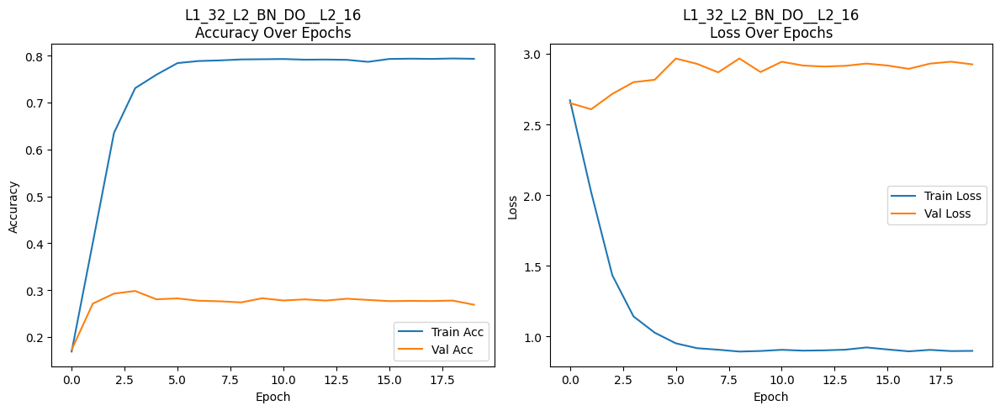

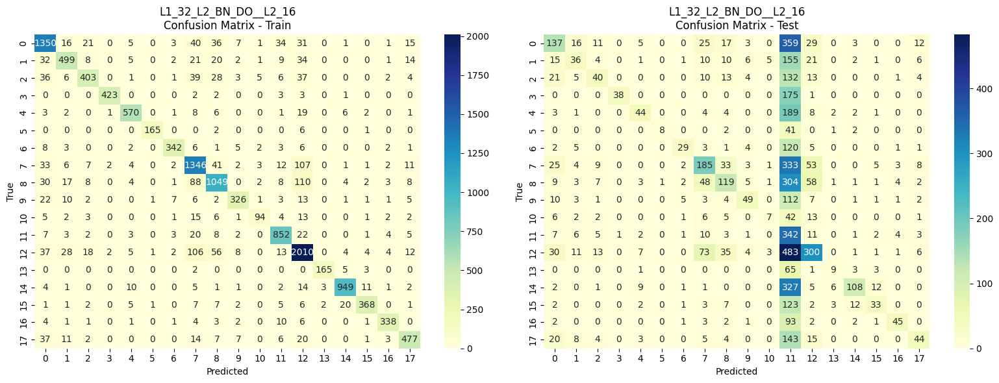

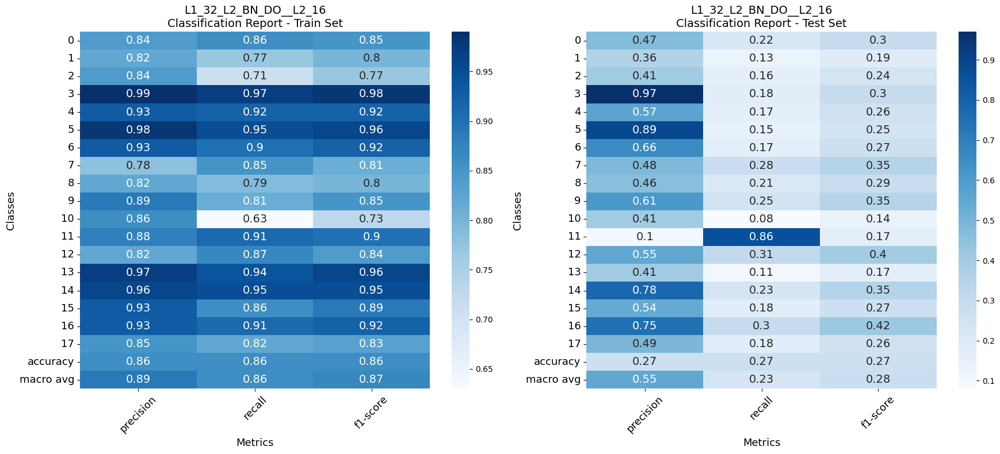

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 32	dropout: True	batchnorm:True	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235B1BE1610>
part: L1_32_L2_BN_DO
Adding batch normalization
Adding Dropout:0.3
Adding regularization
i: 2 neurons: 16	dropout: True	batchnorm:True	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235B2217740>
part: L2_16_L2_BN_DO
Adding batch normalization
Adding Dropout:0.3
Adding regularization
L1_32_L2_BN_DO__L2_16_L2_BN_DO


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_184 (Dense)               │ (None, 32)             │       416,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_46 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_47 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,251,272 (4.77 MB)

 Trainable params: 417,058 (1.59 MB)

 Non-trainable params: 96 (384.00 B)

 Optimizer params: 834,118 (3.18 MB)


Model: L1_32_L2_BN_DO__L2_16_L2_BN_DO
Training time: 0:00:38


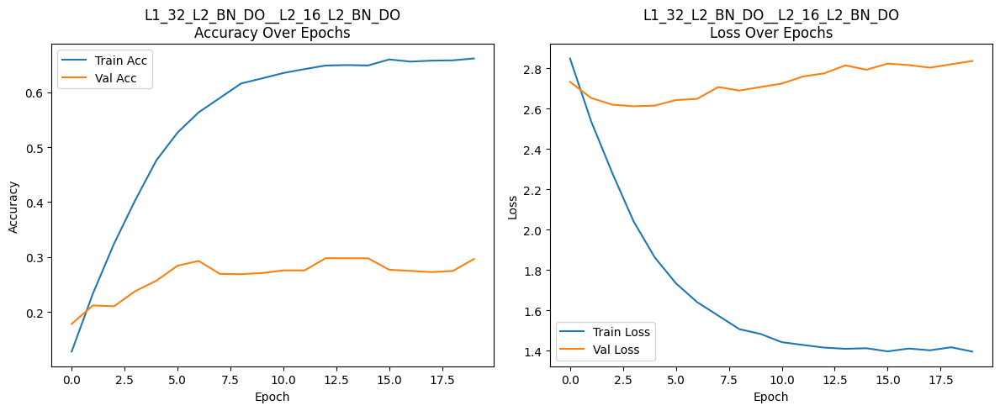

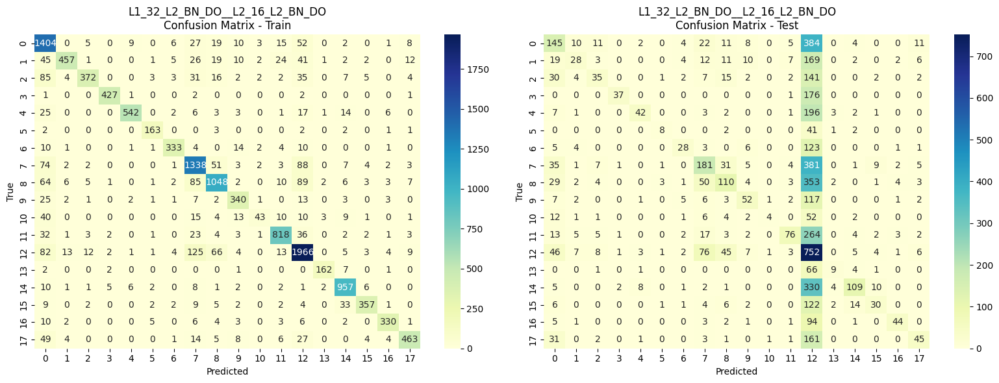

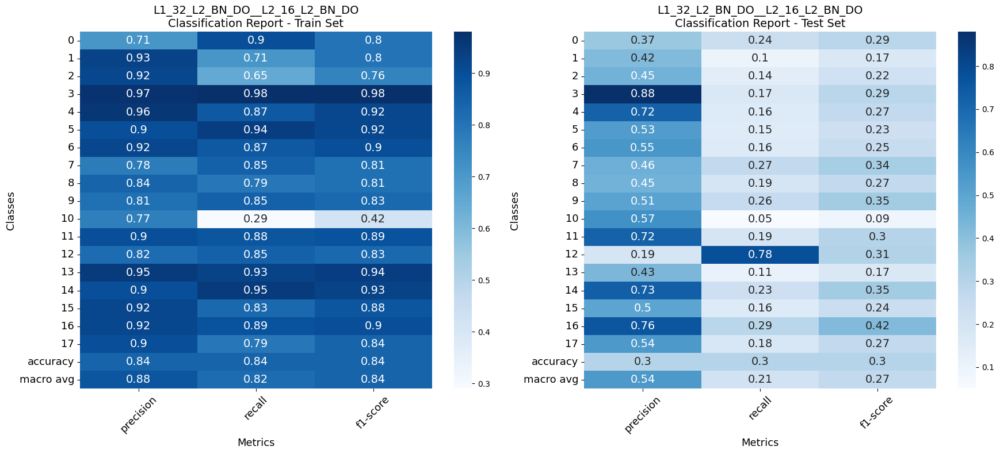

In [ ]:
# # Dictionary to store all model info
# info_3 = {}
# yclass = len(df['SR_Name'].unique())
# for idx, (hidden_units, configs) in enumerate(model_functions_3):
#     # Create model and get its name
#     models, name = create_configurable_model(
#         input_shape=(X_train.shape[1],),
#         num_classes=yclass,
#         hidden_units=hidden_units,
#         configs=configs
#     )
#     print(name)
#     ## Train the model and record time
#     start_time = time.time()
#     history = models.fit(X_train, y_train, epochs=20, batch_size=32,validation_data=(X_test, y_test), verbose=0)
#     end_time = time.time()
#     training_time = str(timedelta(seconds=end_time-start_time)).split(".")[0]

    
#     models.summary()
#     # Predict on Train
#     y_pred_train = models.predict(X_train, batch_size=32, verbose=0).argmax(axis=1)
#     report_train = classification_report(y_train, y_pred_train, output_dict=True)
#     report_train_df = pd.DataFrame(report_train).round(2).transpose()
#     report_train_df.to_csv(f'./data/cls_report_train_{name}.csv', index=False)
#     cm_train = confusion_matrix(y_train, y_pred_train)
#     acc_train = accuracy_score(y_train, y_pred_train)

#     avg_type = 'weighted avg'
    
#     # Predict on Test
#     y_pred_test = models.predict(X_test, batch_size=32, verbose=0).argmax(axis=1)
#     report_test = classification_report(y_test, y_pred_test, output_dict=True)
#     report_test_df = pd.DataFrame(report_test).round(2).transpose()
#     report_test_df.to_csv(f'./data/cls_report_test_{name}.csv', index=False)
#     cm_test = confusion_matrix(y_test, y_pred_test)
#     acc_test = accuracy_score(y_test, y_pred_test)

#     # Store results
#     # info[name] = {
#     #     "model": model,
#     #     "history": history.history,
#     #     "train_report": report_train_df,
#     #     "test_report": report_test_df,
#     #     "train_accuracy": round(acc_train, 4),
#     #     "test_accuracy": round(acc_test, 4),
#     #     "train_precision": round(report_train[avg_type]['precision'], 4),
#     #     "test_precision": round(report_test[avg_type]['precision'], 4),
#     #     "train_recall": round(report_train[avg_type]['recall'], 4),
#     #     "test_recall": round(report_test[avg_type]['recall'], 4),
#     #     "train_f1_score": round(report_train[avg_type]['f1-score'], 4),
#     #     "test_f1_score": round(report_test[avg_type]['f1-score'], 4),
#     #     "confusion_matrix_train": cm_train,
#     #     "confusion_matrix_test": cm_test,
#     #     "training_time": training_time
#     # }
#     info_3[name] = {
#         "model": models,
#         "history": history.history,
#         "train_report": report_train_df,
#         "test_report": report_test_df,
#         "train_accuracy": round(acc_train, 4),
#         "test_accuracy": round(acc_test, 4),
#         # weighted avg metrics
#         "train_precision_weighted": round(report_train['weighted avg']['precision'], 4),
#         "test_precision_weighted": round(report_test['weighted avg']['precision'], 4),
#         "train_recall_weighted": round(report_train['weighted avg']['recall'], 4),
#         "test_recall_weighted": round(report_test['weighted avg']['recall'], 4),
#         "train_f1_score_weighted": round(report_train['weighted avg']['f1-score'], 4),
#         "test_f1_score_weighted": round(report_test['weighted avg']['f1-score'], 4),
#         # macro avg metrics
#         "train_precision_macro": round(report_train['macro avg']['precision'], 4),
#         "test_precision_macro": round(report_test['macro avg']['precision'], 4),
#         "train_recall_macro": round(report_train['macro avg']['recall'], 4),
#         "test_recall_macro": round(report_test['macro avg']['recall'], 4),
#         "train_f1_score_macro": round(report_train['macro avg']['f1-score'], 4),
#         "test_f1_score_macro": round(report_test['macro avg']['f1-score'], 4),
#         "confusion_matrix_train": cm_train,
#         "confusion_matrix_test": cm_test,
#         "training_time": training_time
#     }
    
#     # Print results
#     print(f"\nModel: {name}")
#     print(f"Training time: {training_time}")
#     visualization(y_train,y_test,y_pred_train,y_pred_test,history,report_train_df,report_test_df,name)
    

                             Model  Train Accuracy  Test Accuracy  \
11           L1_32_L2_BN_DO__L2_16          0.8585         0.2687   
5                  L1_32_L2__L2_16          0.8435         0.2709   
0                     L1_32__L2_16          0.8637         0.3027   
1                  L1_32_DO__L2_16          0.8636         0.3013   
9               L1_32_BN_DO__L2_16          0.8608         0.2499   
7               L1_32_L2_DO__L2_16          0.8491         0.2986   
2               L1_32_DO__L2_16_DO          0.8526         0.2798   
10        L1_32_BN_DO__L2_16_BN_DO          0.8540         0.2532   
12  L1_32_L2_BN_DO__L2_16_L2_BN_DO          0.8434         0.2964   
4               L1_32_BN__L2_16_BN          0.8627         0.2711   
3                  L1_32_BN__L2_16          0.8629         0.2800   
6               L1_32_L2__L2_16_L2          0.5125         0.2099   
8         L1_32_L2_DO__L2_16_L2_DO          0.2956         0.1739   

    Train Precision Macro  Test P

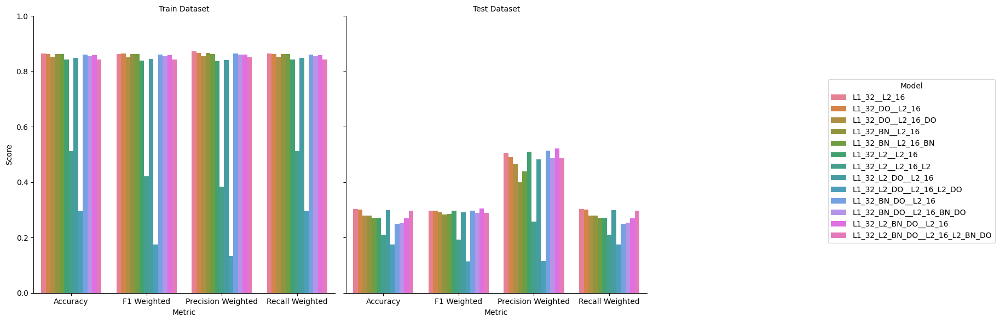

In [114]:
summary_3 = []

# for name, res in info.items():
#     summary.append({
#         'Model': name,
#         'Train Accuracy': res['train_accuracy'],
#         'Test Accuracy': res['test_accuracy'],
#         'Train Precision': res['train_precision'],
#         'Test Precision': res['test_precision'],
#         'Train Recall': res['train_recall'],
#         'Test Recall': res['test_recall'],
#         'Train F1-score': res['train_f1_score'],
#         'Test F1-score': res['test_f1_score'],
#         'Training Time': res['training_time']
#     })
for name, res in info_3.items():
    summary_3.append({
        'Model': name,
        'Train Accuracy': res['train_accuracy'],
        'Test Accuracy': res['test_accuracy'],
        'Train Precision Macro': res['train_precision_macro'],
        'Test Precision Macro': res['test_precision_macro'],
        'Train Recall Macro': res['train_recall_macro'],
        'Test Recall Macro': res['test_recall_macro'],
        'Train F1 Macro': res['train_f1_score_macro'],
        'Test F1 Macro': res['test_f1_score_macro'],
        'Train Precision Weighted': res['train_precision_weighted'],
        'Test Precision Weighted': res['test_precision_weighted'],
        'Train Recall Weighted': res['train_recall_weighted'],
        'Test Recall Weighted': res['test_recall_weighted'],
        'Train F1 Weighted': res['train_f1_score_weighted'],
        'Test F1 Weighted': res['test_f1_score_weighted'],
        'Training Time': res['training_time']
    })
summary_df_3 = pd.DataFrame(summary_3)
print(summary_df_3.sort_values(by='Test F1 Weighted', ascending=False))
# Choose metrics you want to visualize
metrics = ['Accuracy', 'F1 Weighted', 'Precision Weighted', 'Recall Weighted']

# Prepare data in long format for seaborn
plot_data = []

for metric in metrics:
    for split in ['Train', 'Test']:
        col = f"{split} {metric}"
        df_tmp = summary_df_3[['Model', col]].copy()
        df_tmp.columns = ['Model', 'Score']
        df_tmp['Metric'] = metric
        df_tmp['Dataset'] = split
        plot_data.append(df_tmp)

plot_df = pd.concat(plot_data)
# Create the catplot
g = sns.catplot(
    data=plot_df,
    x='Metric',
    y='Score',
    hue='Model',
    col='Dataset',
    kind='bar',
    height=6,
    aspect=1
)

# Titles and axis labels
g.set_titles("{col_name} Dataset")
g.set_axis_labels("Metric", "Score")
g.set(ylim=(0, 1))

# Remove default legend
g._legend.remove()

# Add new legend outside the plot (right side)
g.fig.legend(
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    borderaxespad=0,
    title='Model'
)

# Adjust layout to make room for legend
g.fig.subplots_adjust(right=0.8)  # shrink plot area to make room on the right

plt.show()

In [130]:
print(summary_df.columns)

Index(['Model', 'Train Accuracy', 'Test Accuracy', 'Train Precision Macro',
       'Test Precision Macro', 'Train Recall Macro', 'Test Recall Macro',
       'Train F1 Macro', 'Test F1 Macro', 'Train Precision Weighted',
       'Test Precision Weighted', 'Train Recall Weighted',
       'Test Recall Weighted', 'Train F1 Weighted', 'Test F1 Weighted',
       'Training Time'],
      dtype='object')


In [ ]:
print("bad model")
print(summary_df_3.loc[summary_df_3['Train Accuracy']<0.6,'Model'].values)
baselinetestf1 = summary_df_3.loc[0,'Test F1 Weighted']
print(f"baseline's testf1: {baselinetestf1}")
print(summary_df_3.loc[summary_df_3['Test F1 Weighted']>=baselinetestf1,'Model'].values)
summary_df_3.loc[summary_df_3['Test F1 Weighted']>=baselinetestf1]

bad model
['L1_32_L2__L2_16_L2' 'L1_32_L2_DO__L2_16_L2_DO']
baseline's testf1: 0.2972
['L1_32__L2_16' 'L1_32_DO__L2_16' 'L1_32_L2__L2_16'
 'L1_32_L2_BN_DO__L2_16']


,Model,Train Accuracy,Test Accuracy,Train Precision Macro,Test Precision Macro,Train Recall Macro,Test Recall Macro,Train F1 Macro,Test F1 Macro,Train Precision Weighted,Test Precision Weighted,Train Recall Weighted,Test Recall Weighted,Train F1 Weighted,Test F1 Weighted,Training Time
0,L1_32__L2_16,0.8637,0.3027,0.9027,0.5683,0.8608,0.2200,0.8779,0.2786,0.8718,0.5057,0.8637,0.3027,0.8635,0.2972,0:00:31
1,L1_32_DO__L2_16,0.8636,0.3013,0.8934,0.5548,0.8623,0.2211,0.8763,0.2791,0.8661,0.4908,0.8636,0.3013,0.8638,0.2972,0:00:34
5,L1_32_L2__L2_16,0.8435,0.2709,0.8303,0.5352,0.8151,0.2169,0.8215,0.2688,0.8375,0.5097,0.8435,0.2709,0.8392,0.2974,0:00:33
11,L1_32_L2_BN_DO__L2_16,0.8585,0.2687,0.8901,0.5512,0.8566,0.2309,0.8715,0.2775,0.8601,0.5214,0.8585,0.2687,0.8582,0.3041,0:00:38


In [140]:
selected_3 = summary_df_3.loc[summary_df_3['Test F1 Weighted']>=baselinetestf1]
summary_df_3.loc[:,["Model",'Test F1 Weighted']]

,Model,Test F1 Weighted
0,L1_32__L2_16,0.2972
1,L1_32_DO__L2_16,0.2972
2,L1_32_DO__L2_16_DO,0.2904
3,L1_32_BN__L2_16,0.2827
4,L1_32_BN__L2_16_BN,0.2852
5,L1_32_L2__L2_16,0.2974
6,L1_32_L2__L2_16_L2,0.1921
7,L1_32_L2_DO__L2_16,0.2920
8,L1_32_L2_DO__L2_16_L2_DO,0.1128
9,L1_32_BN_DO__L2_16,0.2968


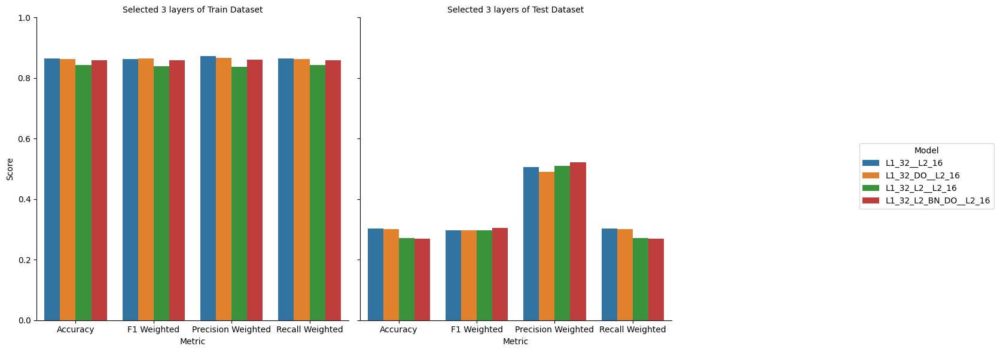

In [181]:
### selected 4 layers

# Prepare data in long format for seaborn
plot_data = []

for metric in metrics:
    for split in ['Train', 'Test']:
        col = f"{split} {metric}"
        df_tmp = selected_3[['Model', col]].copy()
        df_tmp.columns = ['Model', 'Score']
        df_tmp['Metric'] = metric
        df_tmp['Dataset'] = split
        plot_data.append(df_tmp)

plot_df = pd.concat(plot_data)
# Create the catplot
g = sns.catplot(
    data=plot_df,
    x='Metric',
    y='Score',
    hue='Model',
    col='Dataset',
    kind='bar',
    height=6,
    aspect=1
)

# Titles and axis labels
g.set_titles("Selected 3 layers of {col_name} Dataset")
g.set_axis_labels("Metric", "Score")
g.set(ylim=(0, 1))

# Remove default legend
g._legend.remove()

# Add new legend outside the plot (right side)
g.fig.legend(
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    borderaxespad=0,
    title='Model'
)

# Adjust layout to make room for legend
g.fig.subplots_adjust(right=0.8)  # shrink plot area to make room on the right


In [136]:
hidden_units_list_4 = [
    ##1 4layer
    [64,32, 16],
    ##2 4layer add dropout1
    [64,32, 16],
    ##3 4layer add dropout2
    [64,32, 16],
    ##4 
    [64,32, 16],
    ##5 
    [64,32, 16],
    ##6 
    [64,32, 16],  
    ##7
    [64,32, 16],
    ##8 
    [64,32, 16],
    ##9
    [64,32, 16],
    ##10 
    [64,32, 16],
    ##11 
    [64,32, 16],
    ##12 
    [64,32, 16],
    ##13 
    [64,32, 16],
    ##14
    [64,32, 16],
    ##15
    [64,32, 16],
    ##16 
    [64,32, 16],
    ##17 
    [64,32, 16],
    ##18 
    [64,32, 16],
    ##19 
    [64,32, 16]
]

configs_list_4 = [
    [   ##1 4layer
        {'dropout': False,  'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##2 4layer add dropoout1
        {'dropout': True,  'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##3 4layer add dropoout1 L21
        {'dropout': True,  'l2': True, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##4 4layer add dropout1 Batchnorm1
        {'dropout': True,  'l2': False, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##5 4layer 
        {'dropout': True,  'l2': True, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],#############################
    [   ##6 4layer dropout
        {'dropout': True,  'l2': False, 'batchnorm': False},
        {'dropout': True, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##7 4layer 
        {'dropout': True,  'l2': False, 'batchnorm': False},
        {'dropout': True, 'l2': False, 'batchnorm': False},
        {'dropout': True, 'l2': False, 'batchnorm': False},
    ],
    [   ##8 4layer batchnorm
        {'dropout': False,  'l2': False, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##9 4layer
        {'dropout': False,  'l2': False, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##10 4layer 
        {'dropout': False,  'l2': False, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': True},
    ],
    [   ##11 4layer l2
        {'dropout': False,  'l2': True, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##12 4layer 
        {'dropout': False,  'l2': True, 'batchnorm': False},
        {'dropout': False, 'l2': True, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##13 4layer 
        {'dropout': False,  'l2': True, 'batchnorm': False},
        {'dropout': False, 'l2': True, 'batchnorm': False},
        {'dropout': False, 'l2': True, 'batchnorm': False},
    ],
    [   ##14 4layer dropout_l2 12
        {'dropout': True,  'l2': True, 'batchnorm': False},
        {'dropout': True, 'l2': True, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##15 4layer 
        {'dropout': True,  'l2': True, 'batchnorm': False},
        {'dropout': True, 'l2': True, 'batchnorm': False},
        {'dropout': True, 'l2': True, 'batchnorm': False},
    ],
    [   ##16 4layer dropout_bn 12
        {'dropout': True,  'l2': False, 'batchnorm': True},
        {'dropout': True, 'l2': False, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##17 4layer #################
        {'dropout': True,  'l2': False, 'batchnorm': True},
        {'dropout': True, 'l2': False, 'batchnorm': True},
        {'dropout': True, 'l2': False, 'batchnorm': True},
    ],
    [   ##18 4layer dropout_l2_bn 12
        {'dropout': True,  'l2': True, 'batchnorm': True},
        {'dropout': True, 'l2': True, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##19 4layer 
        {'dropout': True,  'l2': True, 'batchnorm': True},
        {'dropout': True, 'l2': True, 'batchnorm': True},
        {'dropout': True, 'l2': True, 'batchnorm': True},
    ]
]

model_functions_4 = list(zip(hidden_units_list_4, configs_list_4))

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: False	batchnorm:False	l2:False reg:None
part: L1_64
i: 2 neurons: 32	dropout: False	batchnorm:False	l2:False reg:None
part: L2_32
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64__L2_32__L3_16


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_187 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_48 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_49 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_189 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_50 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,505,512 (9.56 MB)

 Trainable params: 835,170 (3.19 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,670,342 (6.37 MB)


Model: L1_64__L2_32__L3_16
Training time: 0:00:53


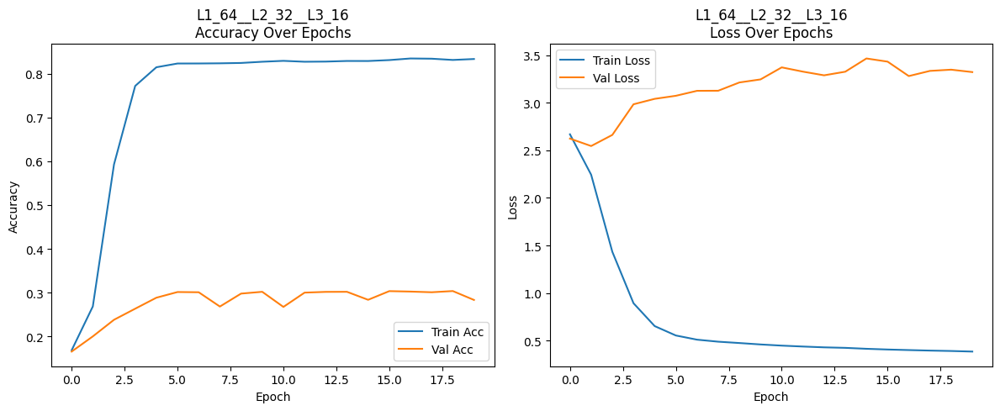

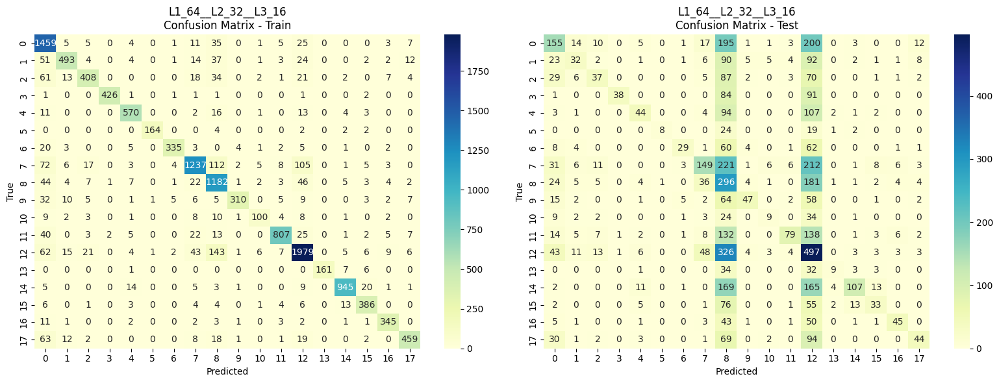

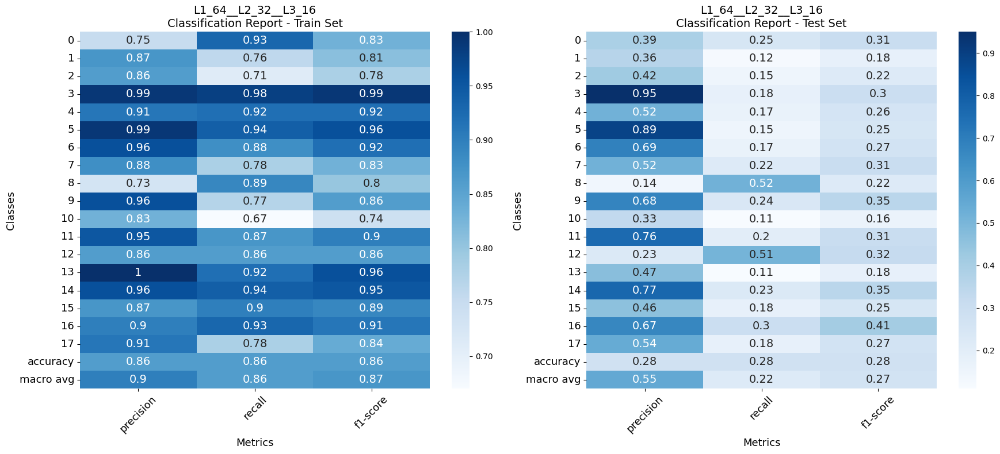

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: True	batchnorm:False	l2:False reg:None
part: L1_64_DO
Adding Dropout:0.3
i: 2 neurons: 32	dropout: False	batchnorm:False	l2:False reg:None
part: L2_32
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64_DO__L2_32__L3_16


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_191 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_51 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_52 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_53 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,505,512 (9.56 MB)

 Trainable params: 835,170 (3.19 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,670,342 (6.37 MB)


Model: L1_64_DO__L2_32__L3_16
Training time: 0:00:55


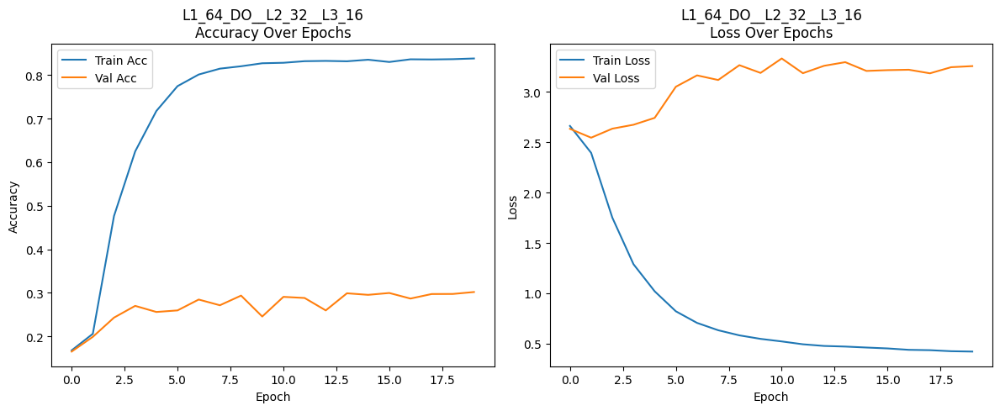

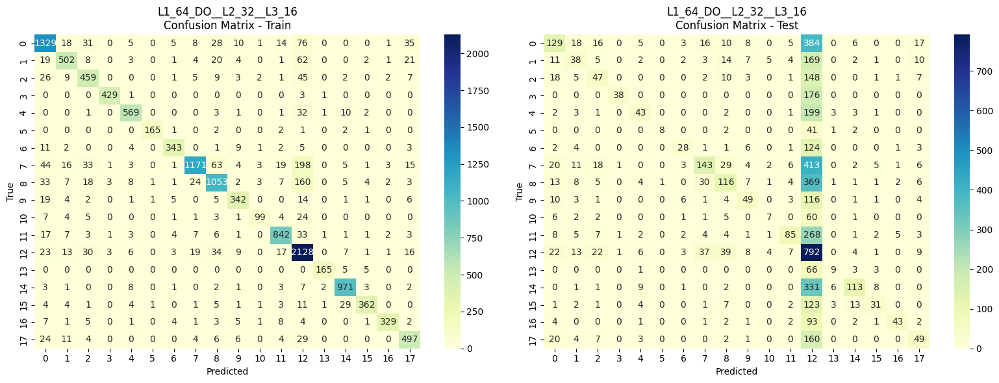

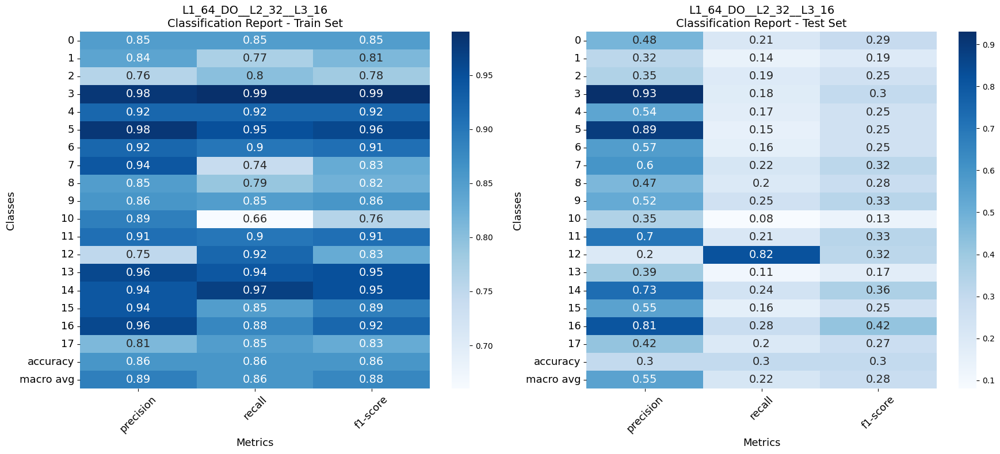

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: True	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235B7F0AD80>
part: L1_64_L2_DO
Adding Dropout:0.3
Adding regularization
i: 2 neurons: 32	dropout: False	batchnorm:False	l2:False reg:None
part: L2_32
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64_L2_DO__L2_32__L3_16


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_195 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_54 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_196 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_55 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_56 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,505,512 (9.56 MB)

 Trainable params: 835,170 (3.19 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,670,342 (6.37 MB)

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Model: L1_64_L2_DO__L2_32__L3_16
Training time: 0:01:01


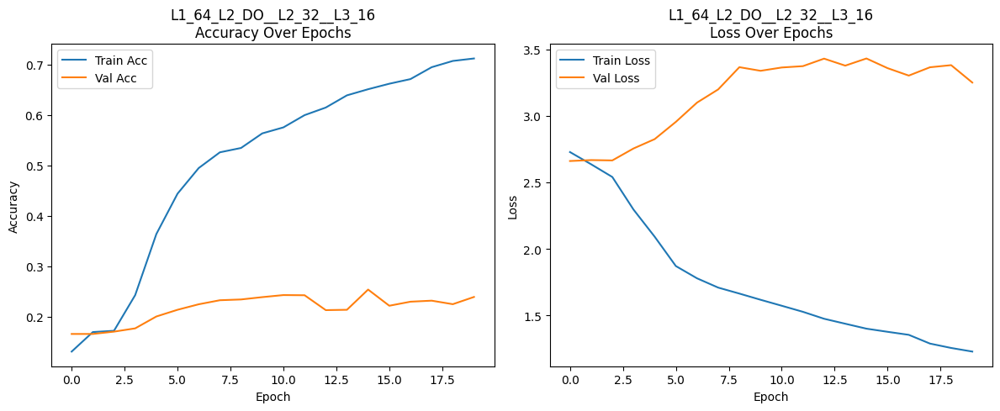

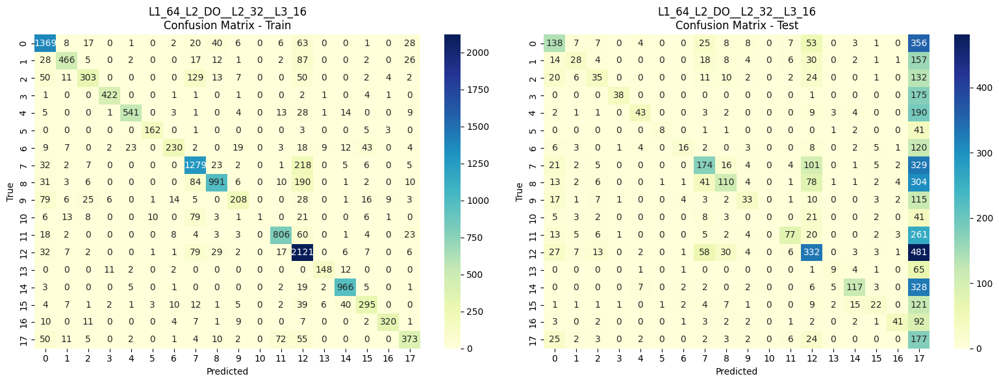

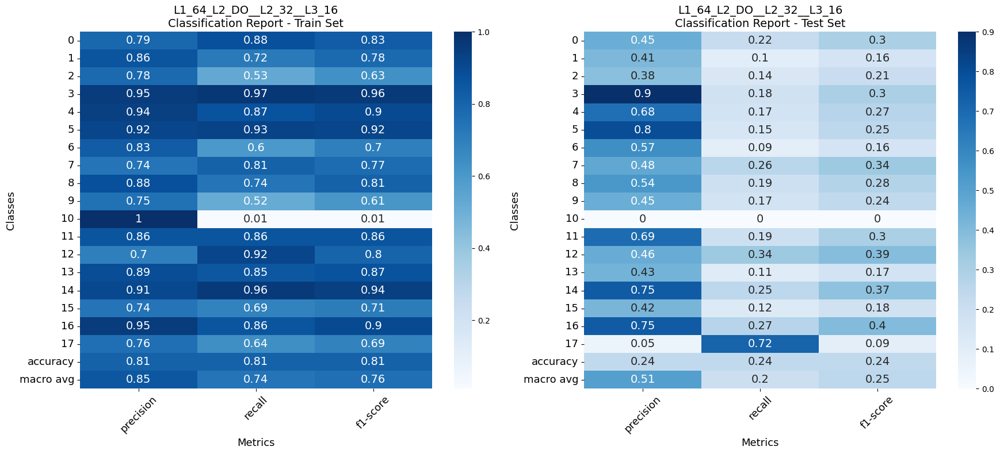

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: True	batchnorm:True	l2:False reg:None
part: L1_64_BN_DO
Adding batch normalization
Adding Dropout:0.3
i: 2 neurons: 32	dropout: False	batchnorm:False	l2:False reg:None
part: L2_32
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64_BN_DO__L2_32__L3_16


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_199 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_57 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_58 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_59 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,506,024 (9.56 MB)

 Trainable params: 835,298 (3.19 MB)

 Non-trainable params: 128 (512.00 B)

 Optimizer params: 1,670,598 (6.37 MB)


Model: L1_64_BN_DO__L2_32__L3_16
Training time: 0:00:53


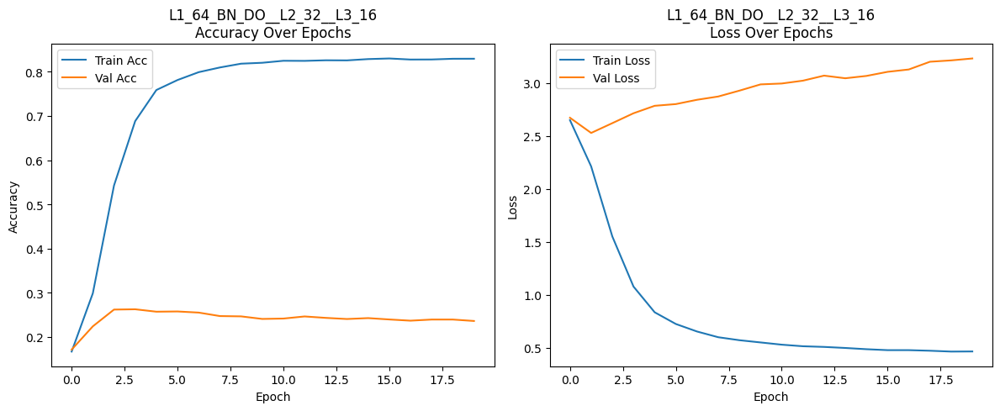

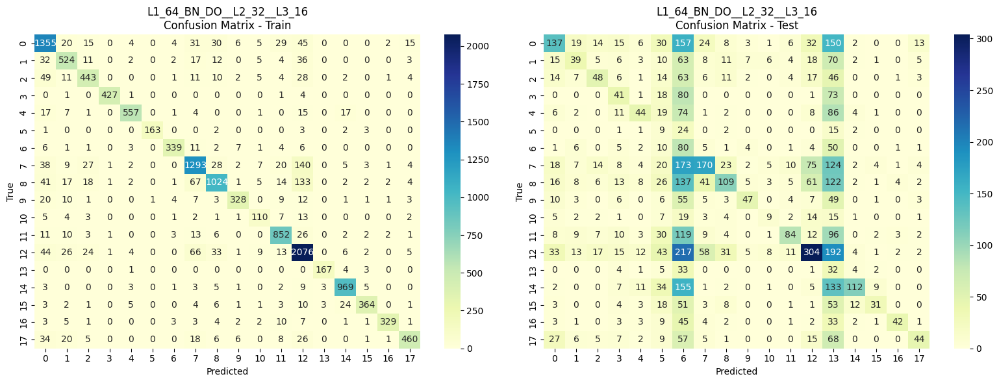

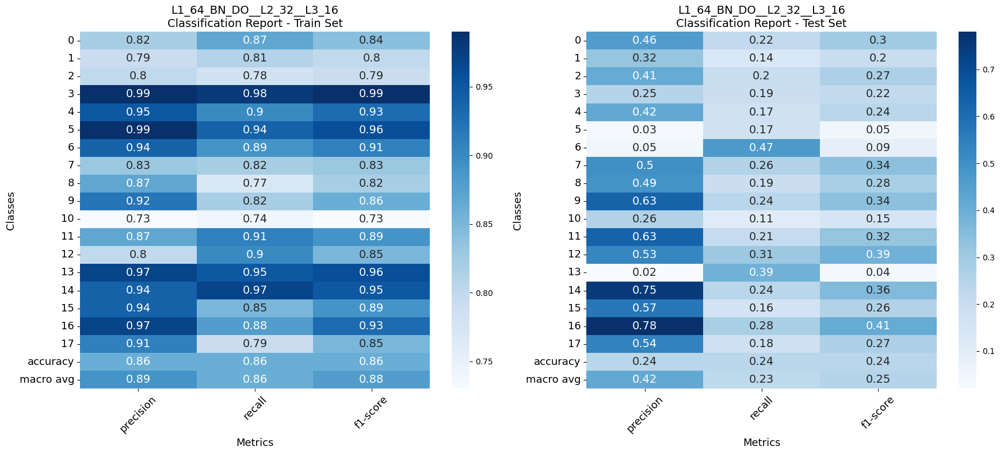

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: True	batchnorm:True	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235B273DA00>
part: L1_64_L2_BN_DO
Adding batch normalization
Adding Dropout:0.3
Adding regularization
i: 2 neurons: 32	dropout: False	batchnorm:False	l2:False reg:None
part: L2_32
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64_L2_BN_DO__L2_32__L3_16


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_60 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_61 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_62 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,506,024 (9.56 MB)

 Trainable params: 835,298 (3.19 MB)

 Non-trainable params: 128 (512.00 B)

 Optimizer params: 1,670,598 (6.37 MB)


Model: L1_64_L2_BN_DO__L2_32__L3_16
Training time: 0:01:03


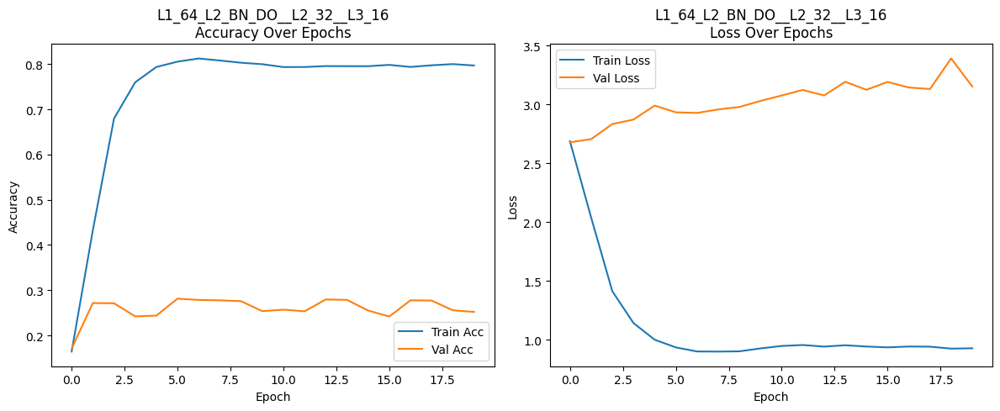

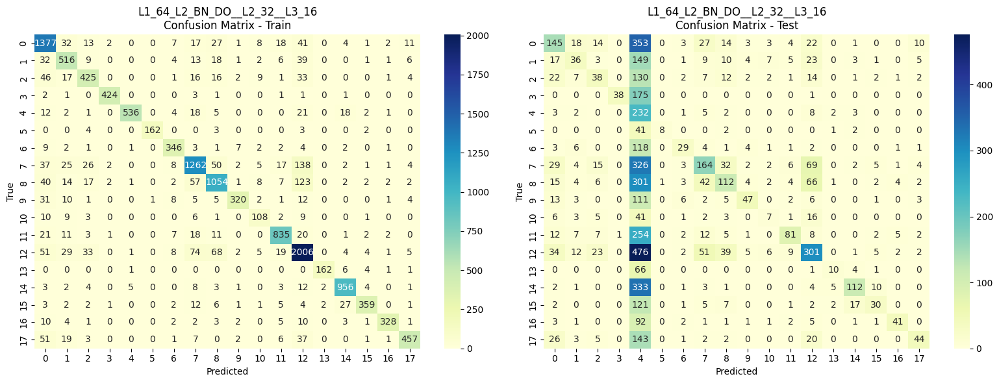

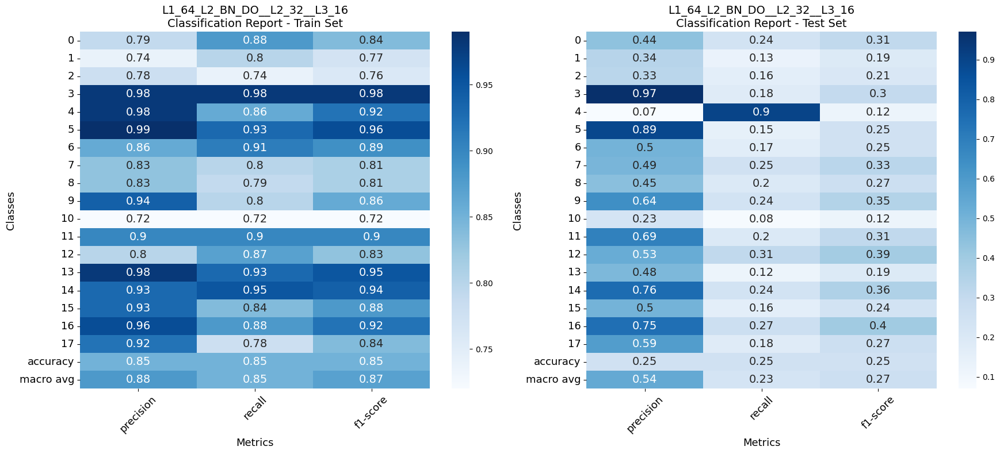

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: True	batchnorm:False	l2:False reg:None
part: L1_64_DO
Adding Dropout:0.3
i: 2 neurons: 32	dropout: True	batchnorm:False	l2:False reg:None
part: L2_32_DO
Adding Dropout:0.3
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64_DO__L2_32_DO__L3_16


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_207 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_63 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_64 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_65 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_210 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,505,512 (9.56 MB)

 Trainable params: 835,170 (3.19 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,670,342 (6.37 MB)


Model: L1_64_DO__L2_32_DO__L3_16
Training time: 0:00:58


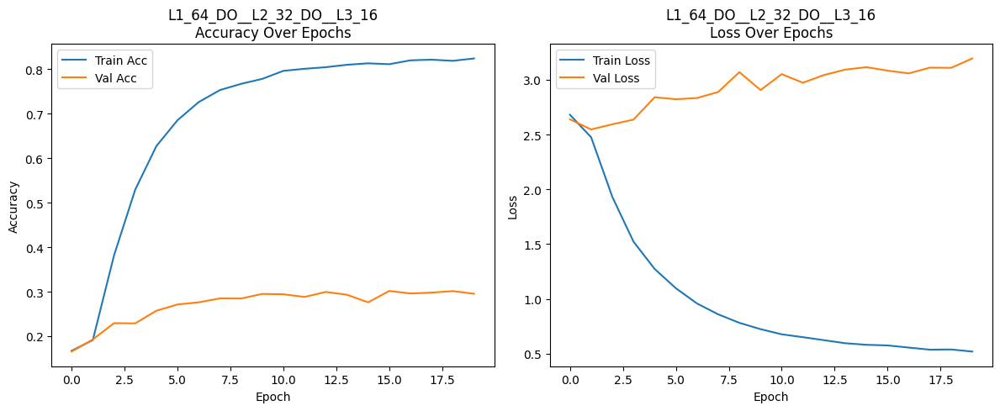

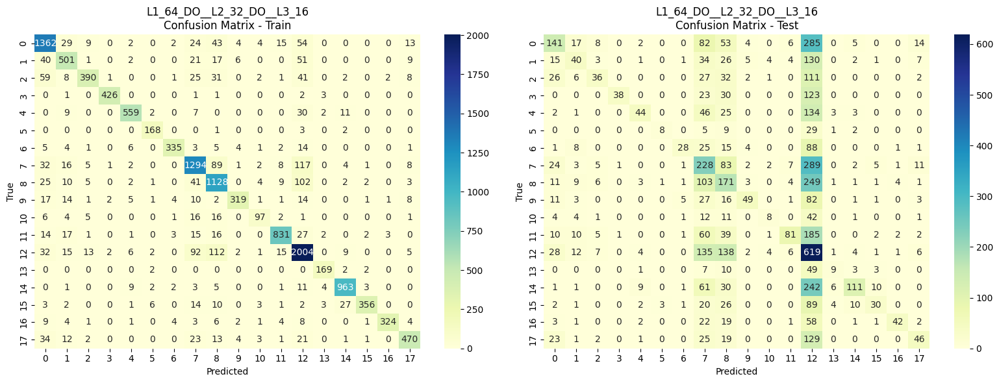

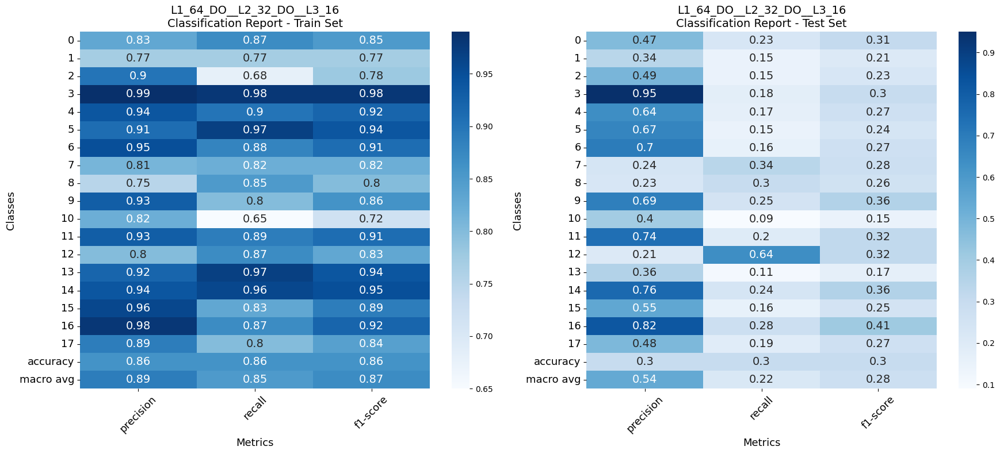

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: True	batchnorm:False	l2:False reg:None
part: L1_64_DO
Adding Dropout:0.3
i: 2 neurons: 32	dropout: True	batchnorm:False	l2:False reg:None
part: L2_32_DO
Adding Dropout:0.3
i: 3 neurons: 16	dropout: True	batchnorm:False	l2:False reg:None
part: L3_16_DO
Adding Dropout:0.3
L1_64_DO__L2_32_DO__L3_16_DO


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_211 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_66 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_67 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_68 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_30 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,505,512 (9.56 MB)

 Trainable params: 835,170 (3.19 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,670,342 (6.37 MB)

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Model: L1_64_DO__L2_32_DO__L3_16_DO
Training time: 0:00:54


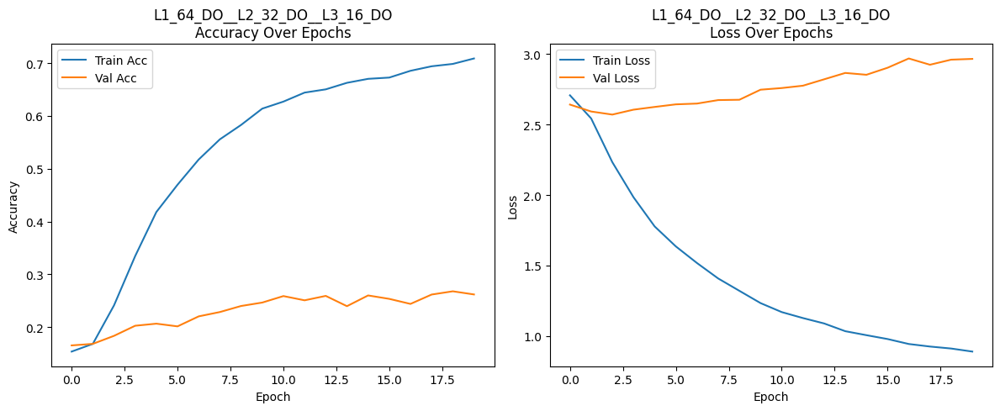

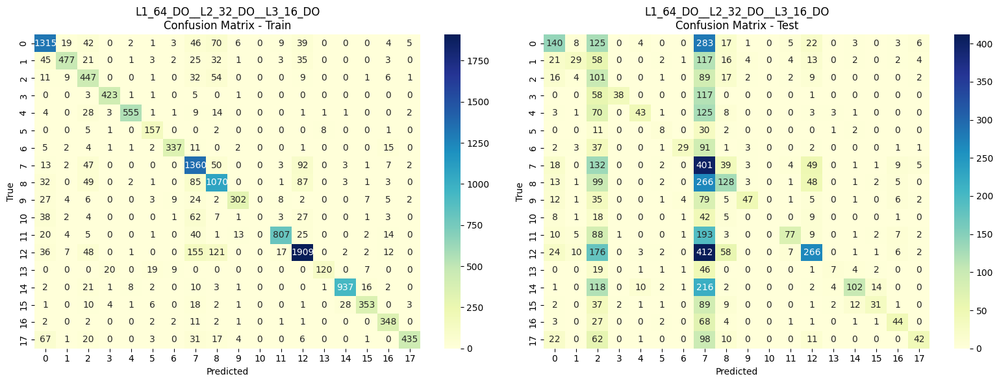

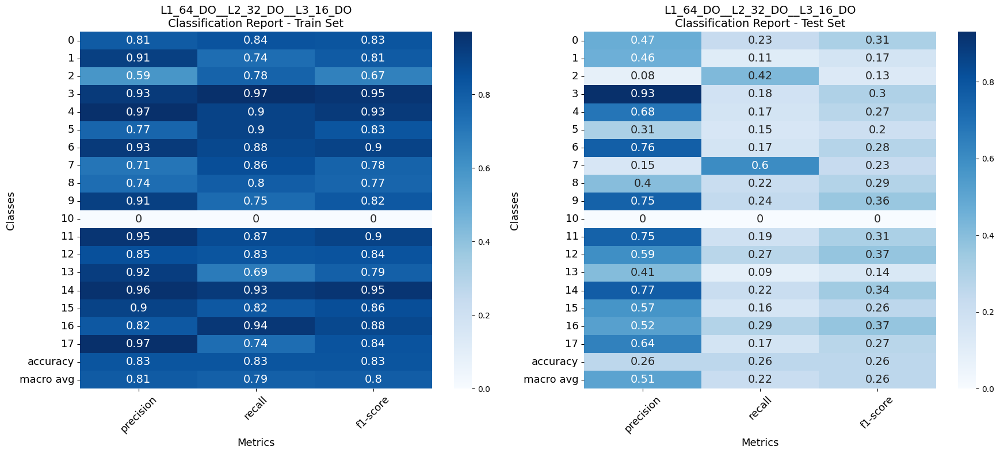

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: False	batchnorm:True	l2:False reg:None
part: L1_64_BN
Adding batch normalization
i: 2 neurons: 32	dropout: False	batchnorm:False	l2:False reg:None
part: L2_32
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64_BN__L2_32__L3_16


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_215 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_69 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_70 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_217 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_71 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,506,024 (9.56 MB)

 Trainable params: 835,298 (3.19 MB)

 Non-trainable params: 128 (512.00 B)

 Optimizer params: 1,670,598 (6.37 MB)


Model: L1_64_BN__L2_32__L3_16
Training time: 0:00:54


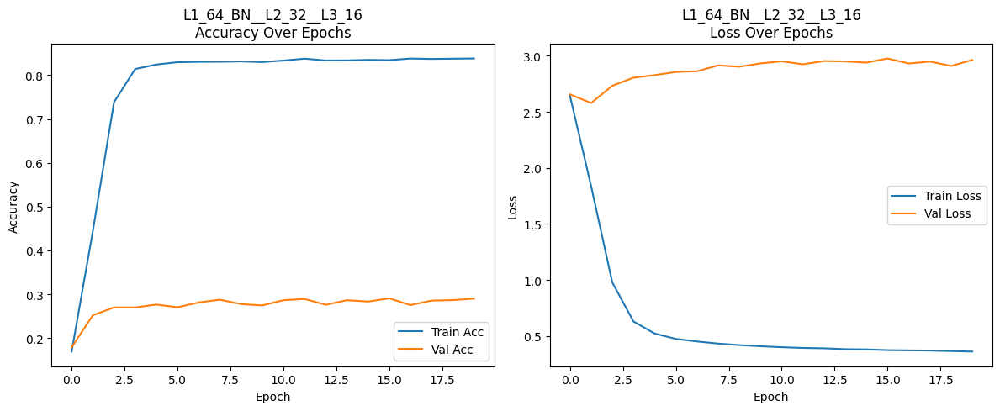

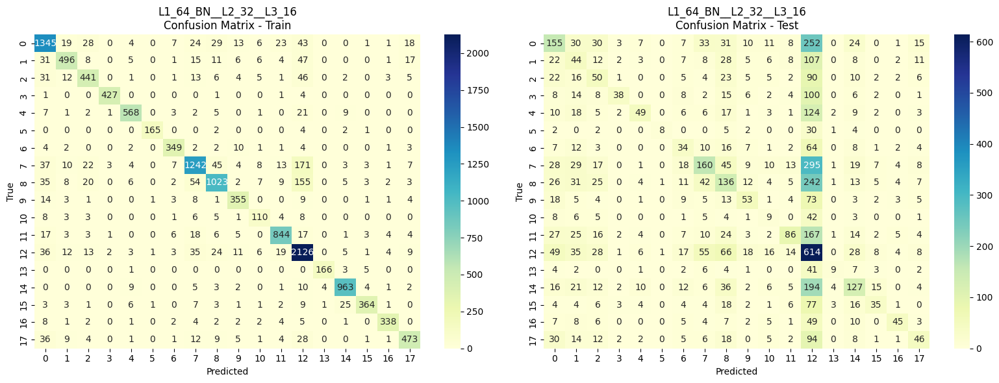

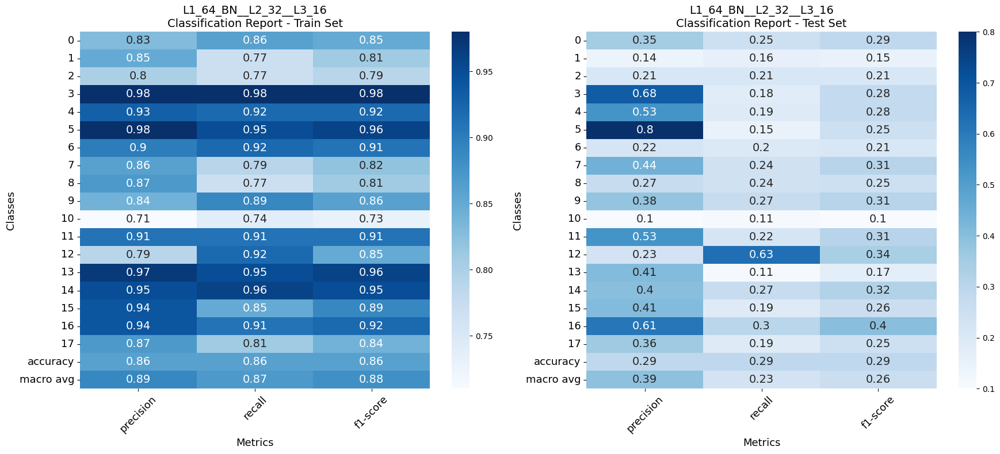

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: False	batchnorm:True	l2:False reg:None
part: L1_64_BN
Adding batch normalization
i: 2 neurons: 32	dropout: False	batchnorm:True	l2:False reg:None
part: L2_32_BN
Adding batch normalization
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64_BN__L2_32_BN__L3_16


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_219 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_72 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_73 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_74 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,506,280 (9.56 MB)

 Trainable params: 835,362 (3.19 MB)

 Non-trainable params: 192 (768.00 B)

 Optimizer params: 1,670,726 (6.37 MB)


Model: L1_64_BN__L2_32_BN__L3_16
Training time: 0:00:58


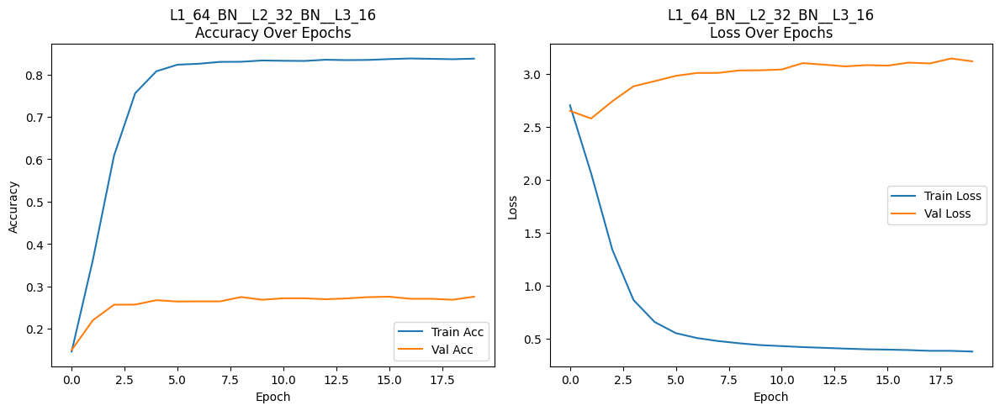

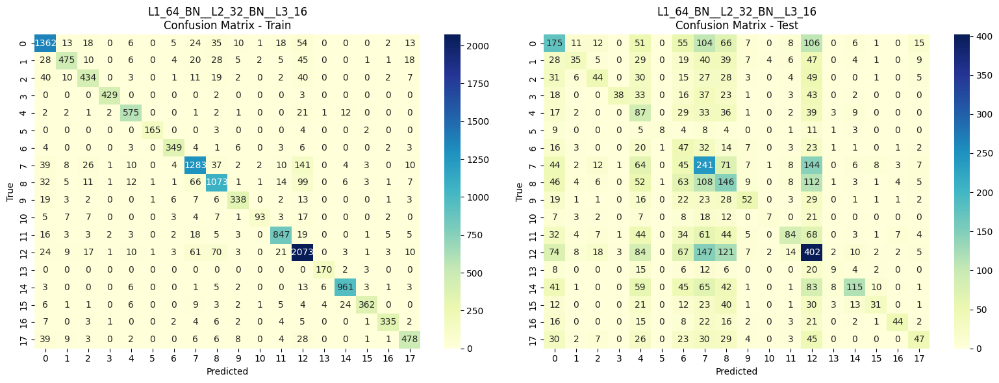

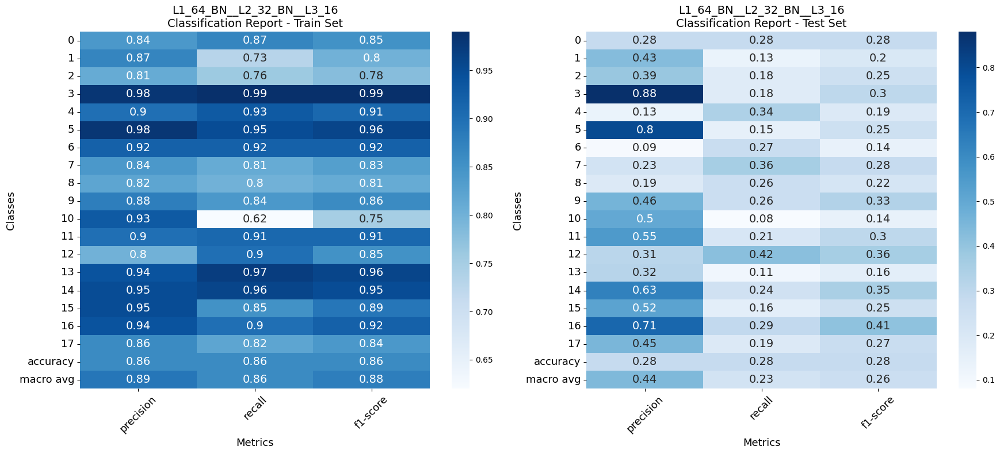

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: False	batchnorm:True	l2:False reg:None
part: L1_64_BN
Adding batch normalization
i: 2 neurons: 32	dropout: False	batchnorm:True	l2:False reg:None
part: L2_32_BN
Adding batch normalization
i: 3 neurons: 16	dropout: False	batchnorm:True	l2:False reg:None
part: L3_16_BN
Adding batch normalization
L1_64_BN__L2_32_BN__L3_16_BN


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_223 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_75 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_224 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_76 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_77 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,506,408 (9.56 MB)

 Trainable params: 835,394 (3.19 MB)

 Non-trainable params: 224 (896.00 B)

 Optimizer params: 1,670,790 (6.37 MB)


Model: L1_64_BN__L2_32_BN__L3_16_BN
Training time: 0:00:59


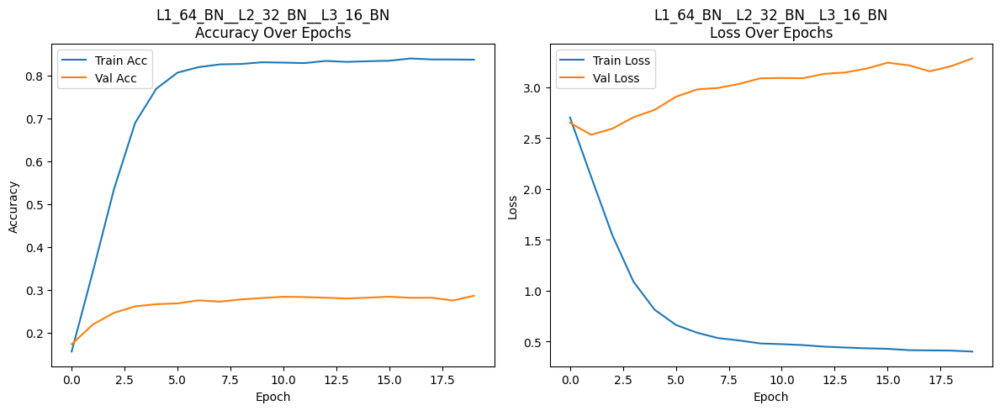

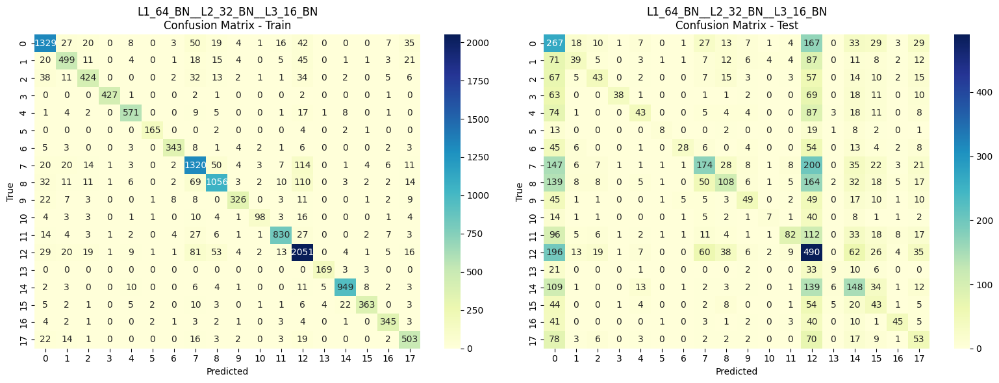

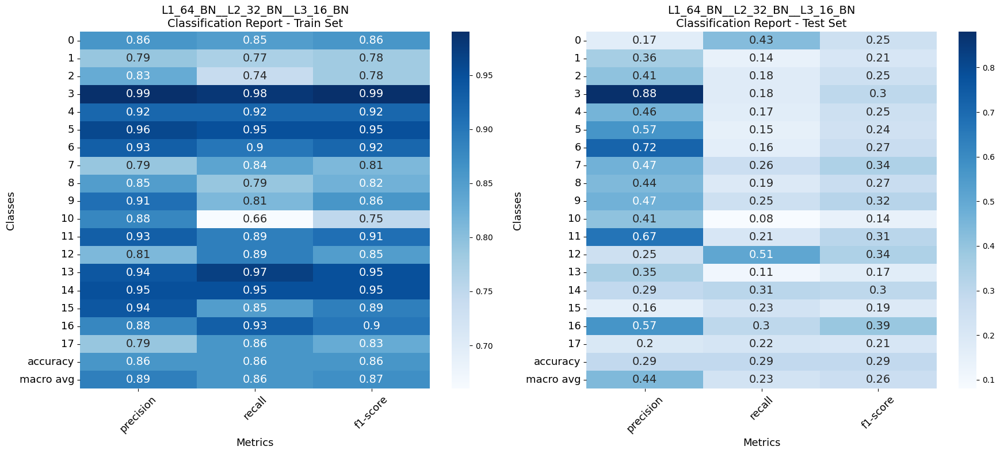

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: False	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235A0A69820>
part: L1_64_L2
Adding regularization
i: 2 neurons: 32	dropout: False	batchnorm:False	l2:False reg:None
part: L2_32
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64_L2__L2_32__L3_16


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_227 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_78 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_79 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_80 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,505,512 (9.56 MB)

 Trainable params: 835,170 (3.19 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,670,342 (6.37 MB)

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Model: L1_64_L2__L2_32__L3_16
Training time: 0:01:04


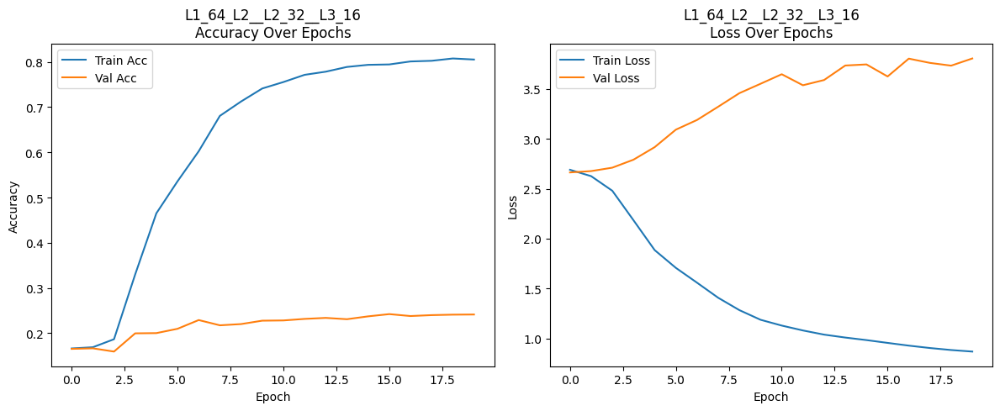

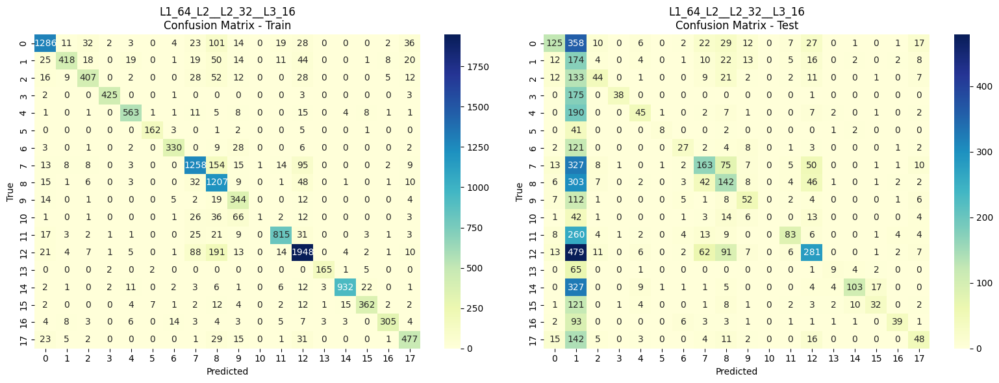

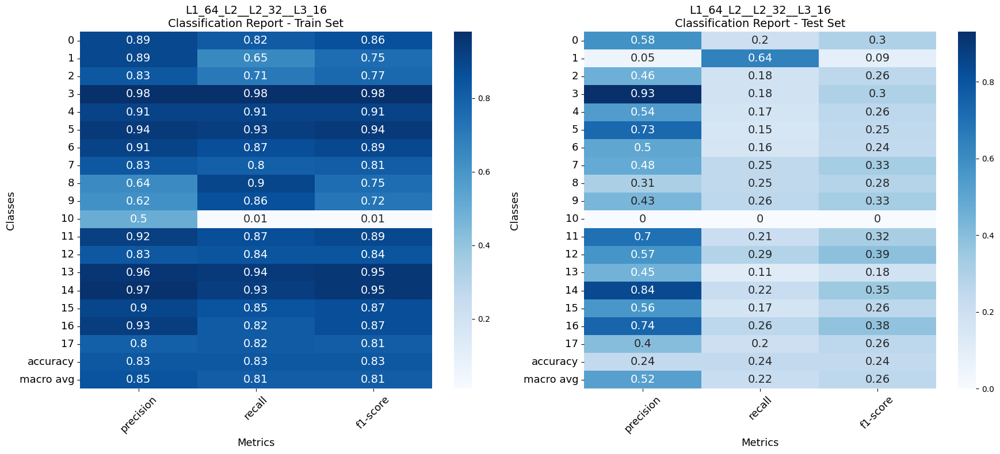

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: False	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235E94FF860>
part: L1_64_L2
Adding regularization
i: 2 neurons: 32	dropout: False	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235DFD83F50>
part: L2_32_L2
Adding regularization
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64_L2__L2_32_L2__L3_16


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_81 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_82 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_83 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,505,512 (9.56 MB)

 Trainable params: 835,170 (3.19 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,670,342 (6.37 MB)

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Model: L1_64_L2__L2_32_L2__L3_16
Training time: 0:00:59


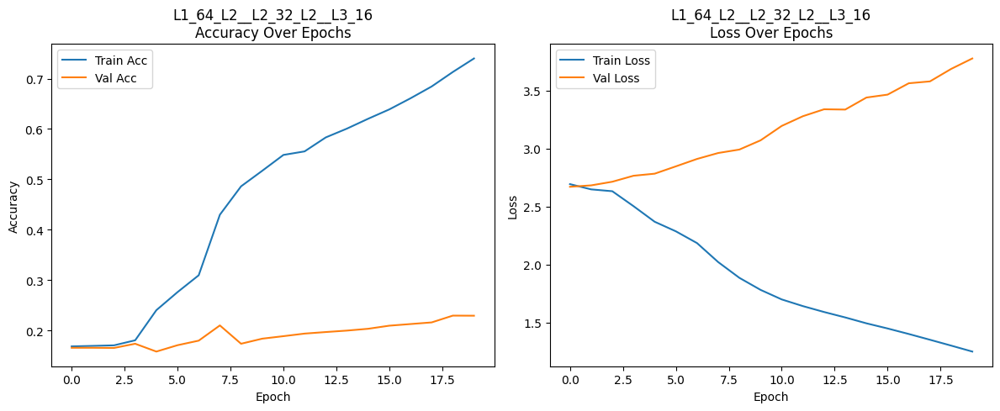

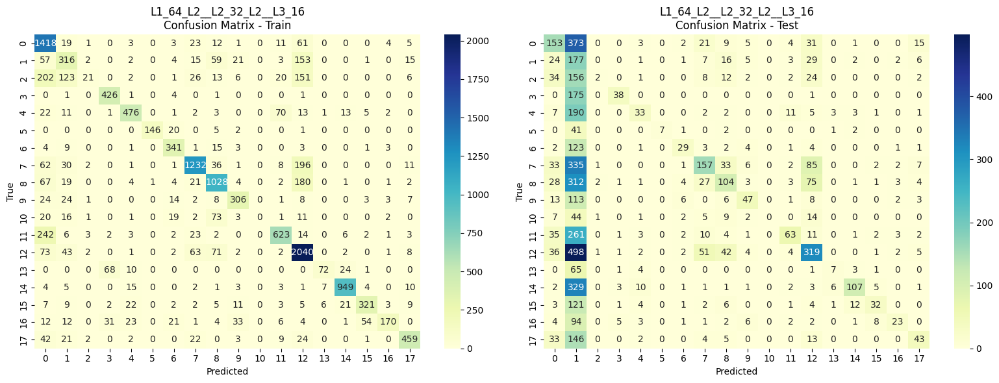

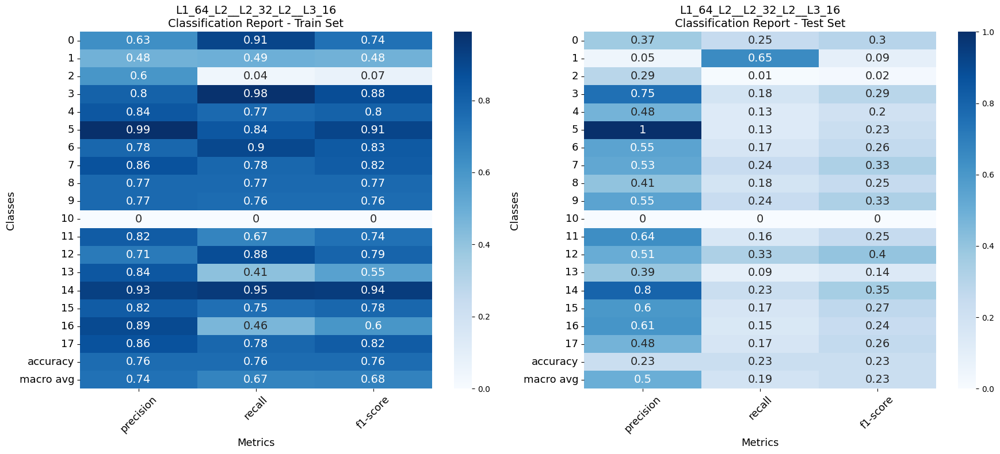

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: False	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235E8038620>
part: L1_64_L2
Adding regularization
i: 2 neurons: 32	dropout: False	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235DFAF0590>
part: L2_32_L2
Adding regularization
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235E27DE480>
part: L3_16_L2
Adding regularization
L1_64_L2__L2_32_L2__L3_16_L2


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_235 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_84 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_85 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_86 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_238 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,505,512 (9.56 MB)

 Trainable params: 835,170 (3.19 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,670,342 (6.37 MB)

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Model: L1_64_L2__L2_32_L2__L3_16_L2
Training time: 0:00:58


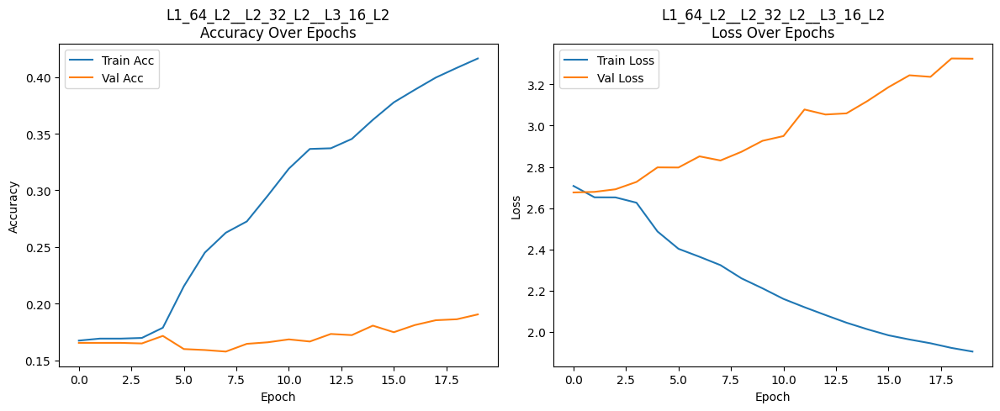

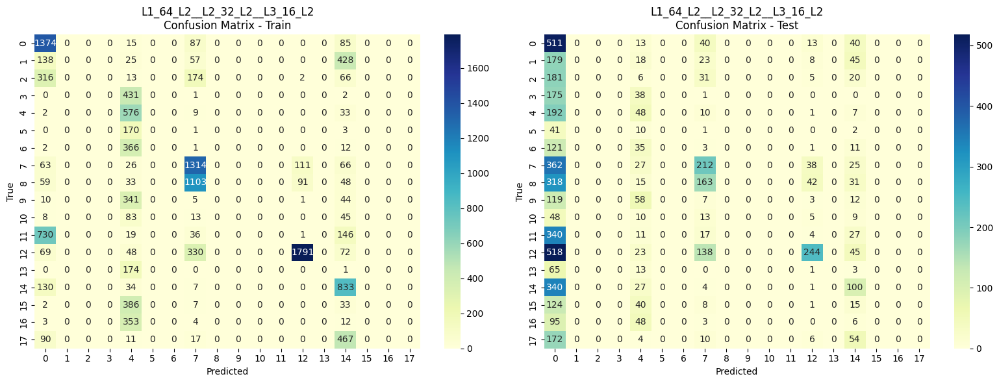

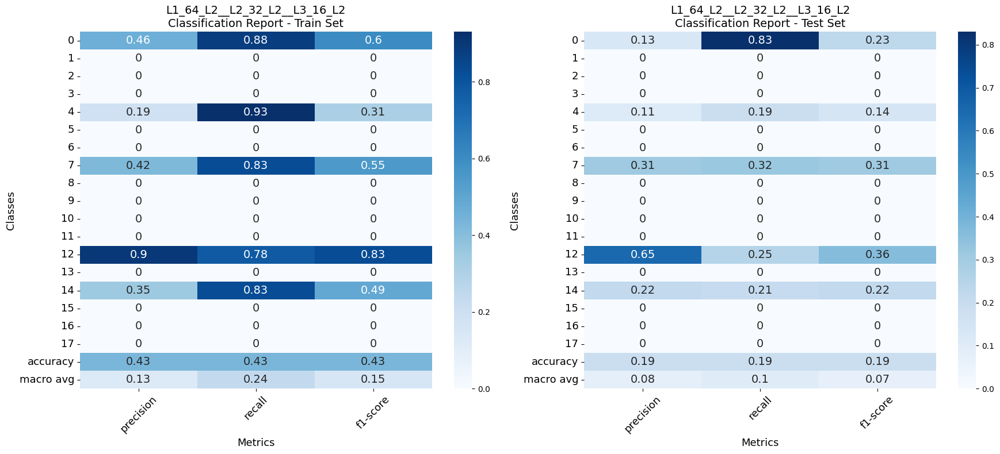

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: True	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235E7705A30>
part: L1_64_L2_DO
Adding Dropout:0.3
Adding regularization
i: 2 neurons: 32	dropout: True	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235B9024FB0>
part: L2_32_L2_DO
Adding Dropout:0.3
Adding regularization
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64_L2_DO__L2_32_L2_DO__L3_16


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_239 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_87 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_88 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_89 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,505,512 (9.56 MB)

 Trainable params: 835,170 (3.19 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,670,342 (6.37 MB)

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Model: L1_64_L2_DO__L2_32_L2_DO__L3_16
Training time: 0:00:58


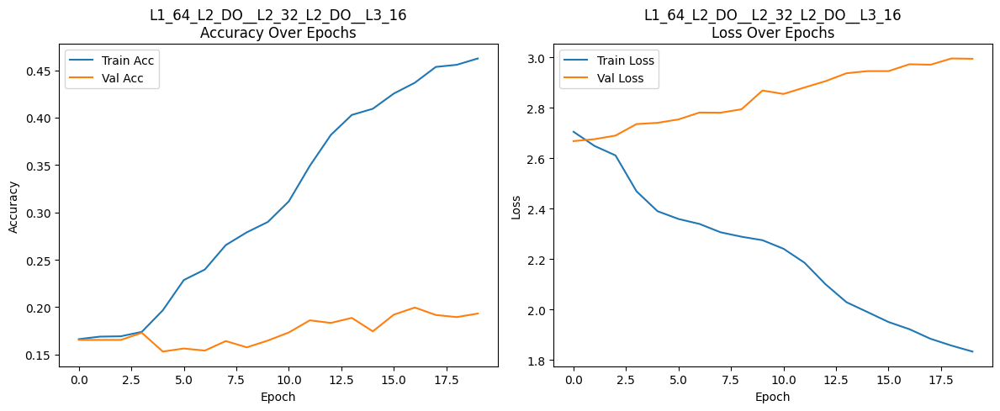

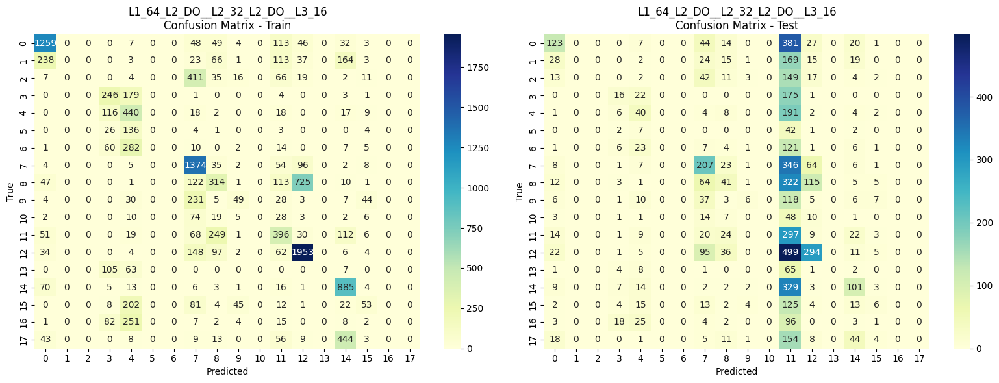

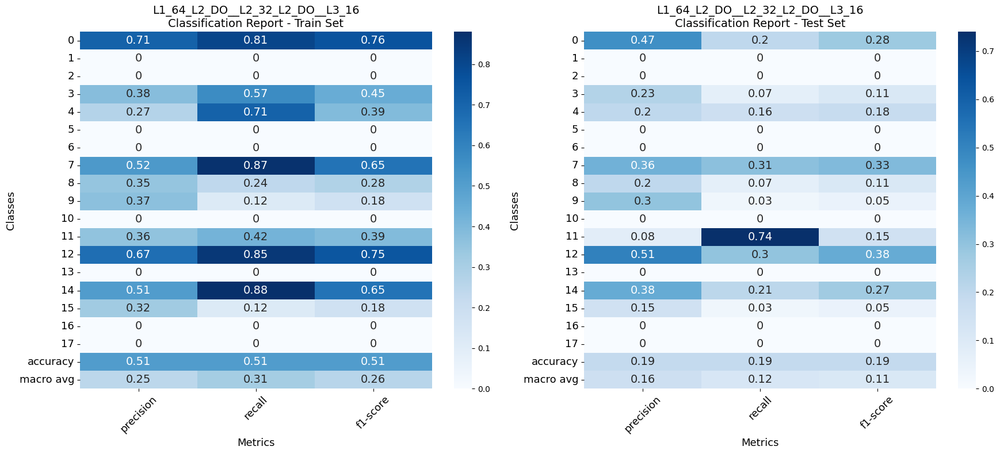

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: True	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235D27FA660>
part: L1_64_L2_DO
Adding Dropout:0.3
Adding regularization
i: 2 neurons: 32	dropout: True	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235DD20EA20>
part: L2_32_L2_DO
Adding Dropout:0.3
Adding regularization
i: 3 neurons: 16	dropout: True	batchnorm:False	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235D2313D40>
part: L3_16_L2_DO
Adding Dropout:0.3
Adding regularization
L1_64_L2_DO__L2_32_L2_DO__L3_16_L2_DO


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_243 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_90 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_91 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_34 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_245 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_92 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_35 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,505,512 (9.56 MB)

 Trainable params: 835,170 (3.19 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,670,342 (6.37 MB)

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Model: L1_64_L2_DO__L2_32_L2_DO__L3_16_L2_DO
Training time: 0:00:56


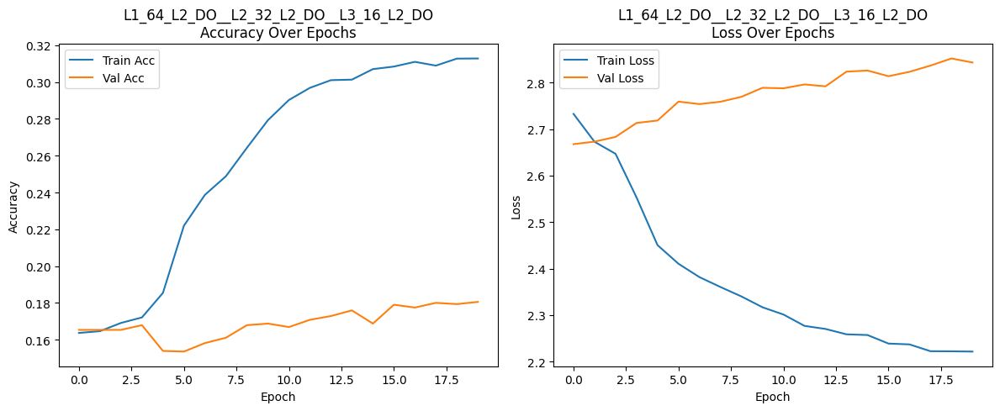

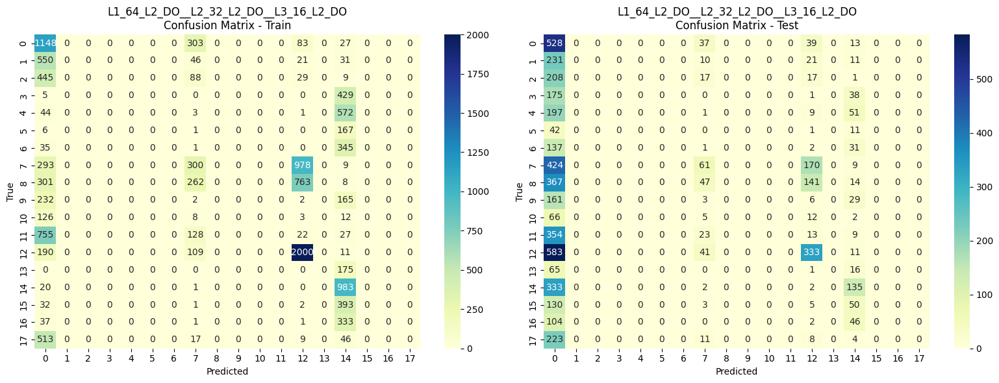

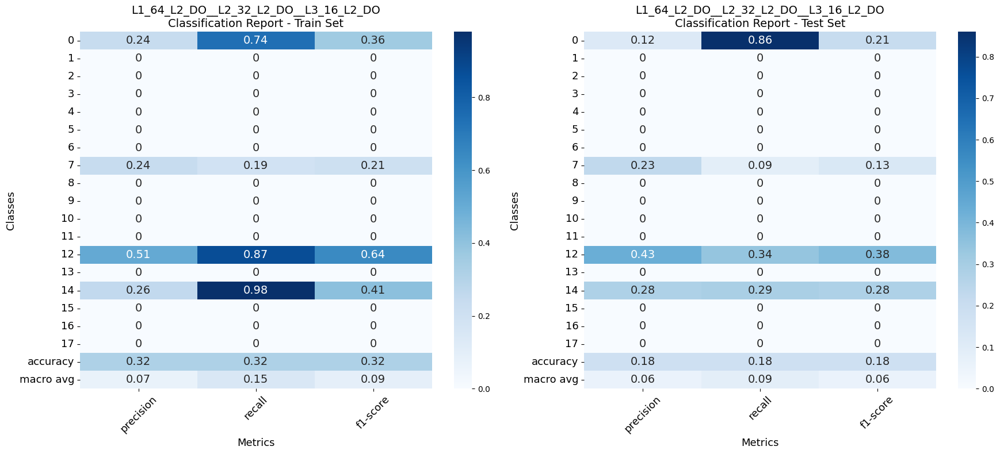

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: True	batchnorm:True	l2:False reg:None
part: L1_64_BN_DO
Adding batch normalization
Adding Dropout:0.3
i: 2 neurons: 32	dropout: True	batchnorm:True	l2:False reg:None
part: L2_32_BN_DO
Adding batch normalization
Adding Dropout:0.3
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64_BN_DO__L2_32_BN_DO__L3_16


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_247 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_93 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_36 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_94 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_37 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_95 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,506,280 (9.56 MB)

 Trainable params: 835,362 (3.19 MB)

 Non-trainable params: 192 (768.00 B)

 Optimizer params: 1,670,726 (6.37 MB)


Model: L1_64_BN_DO__L2_32_BN_DO__L3_16
Training time: 0:00:56


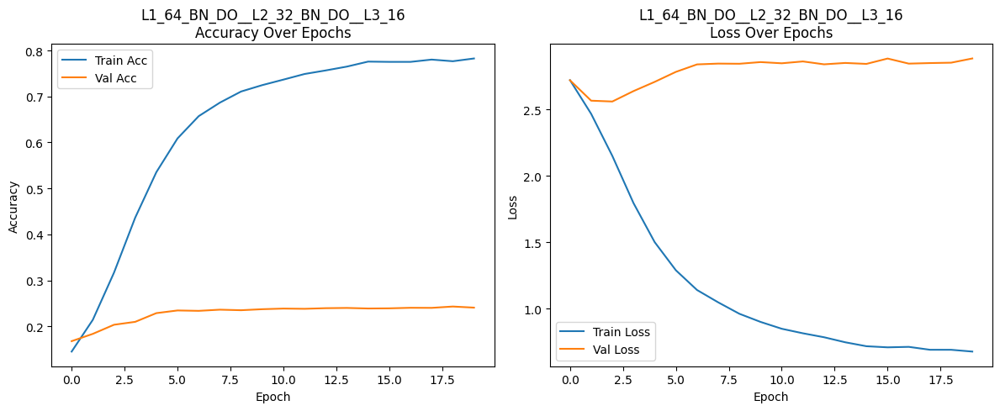

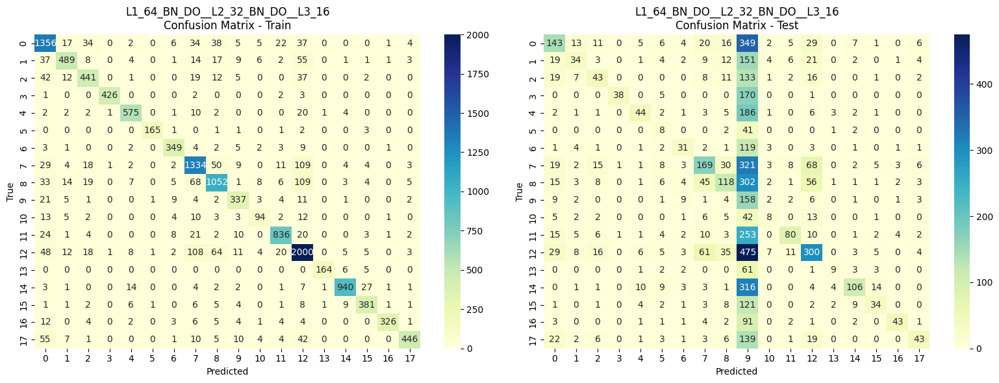

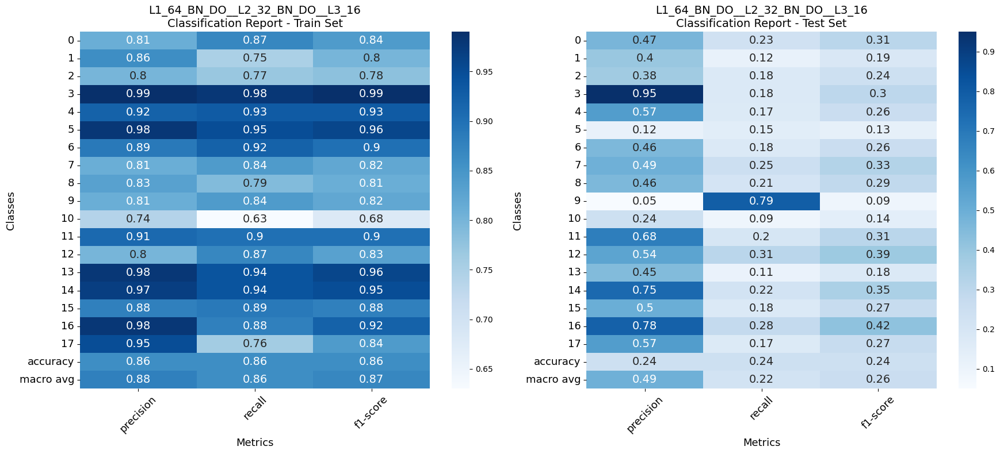

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: True	batchnorm:True	l2:False reg:None
part: L1_64_BN_DO
Adding batch normalization
Adding Dropout:0.3
i: 2 neurons: 32	dropout: True	batchnorm:True	l2:False reg:None
part: L2_32_BN_DO
Adding batch normalization
Adding Dropout:0.3
i: 3 neurons: 16	dropout: True	batchnorm:True	l2:False reg:None
part: L3_16_BN_DO
Adding batch normalization
Adding Dropout:0.3
L1_64_BN_DO__L2_32_BN_DO__L3_16_BN_DO


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_251 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_96 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_38 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_252 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_20          │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_97 (Activation)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_39 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_21          │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_98 (Activation)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_40 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,506,408 (9.56 MB)

 Trainable params: 835,394 (3.19 MB)

 Non-trainable params: 224 (896.00 B)

 Optimizer params: 1,670,790 (6.37 MB)


Model: L1_64_BN_DO__L2_32_BN_DO__L3_16_BN_DO
Training time: 0:01:06


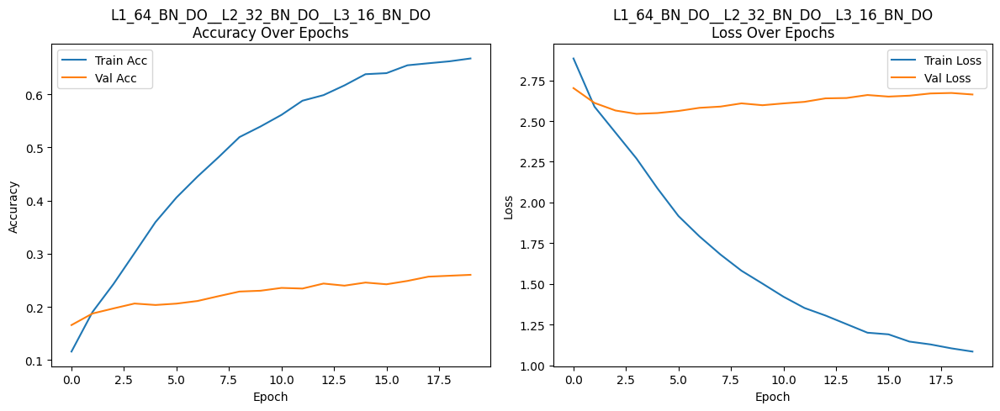

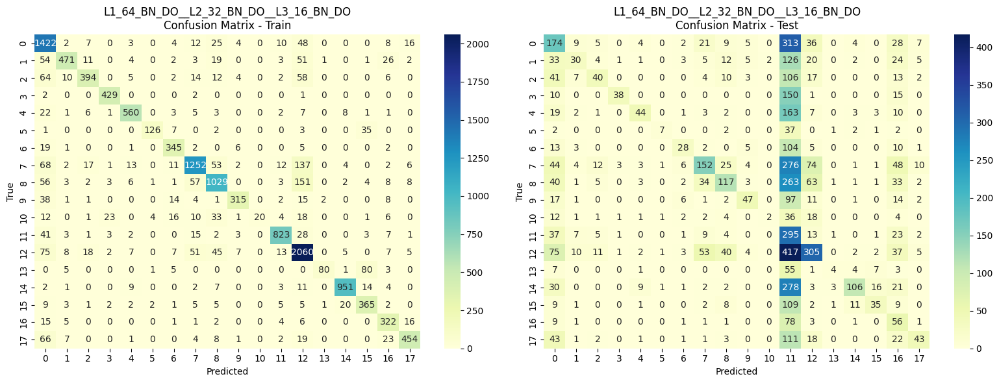

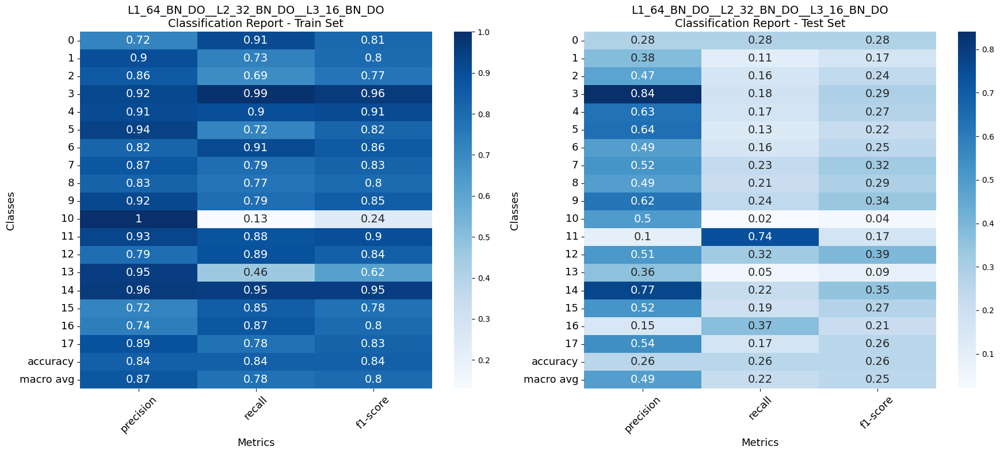

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: True	batchnorm:True	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235B35AA660>
part: L1_64_L2_BN_DO
Adding batch normalization
Adding Dropout:0.3
Adding regularization
i: 2 neurons: 32	dropout: True	batchnorm:True	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235D27FAA20>
part: L2_32_L2_BN_DO
Adding batch normalization
Adding Dropout:0.3
Adding regularization
i: 3 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L3_16
L1_64_L2_BN_DO__L2_32_L2_BN_DO__L3_16


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_255 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_22          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_99 (Activation)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_41 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_23          │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_100 (Activation)     │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_42 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_101 (Activation)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,506,280 (9.56 MB)

 Trainable params: 835,362 (3.19 MB)

 Non-trainable params: 192 (768.00 B)

 Optimizer params: 1,670,726 (6.37 MB)


Model: L1_64_L2_BN_DO__L2_32_L2_BN_DO__L3_16
Training time: 0:01:03


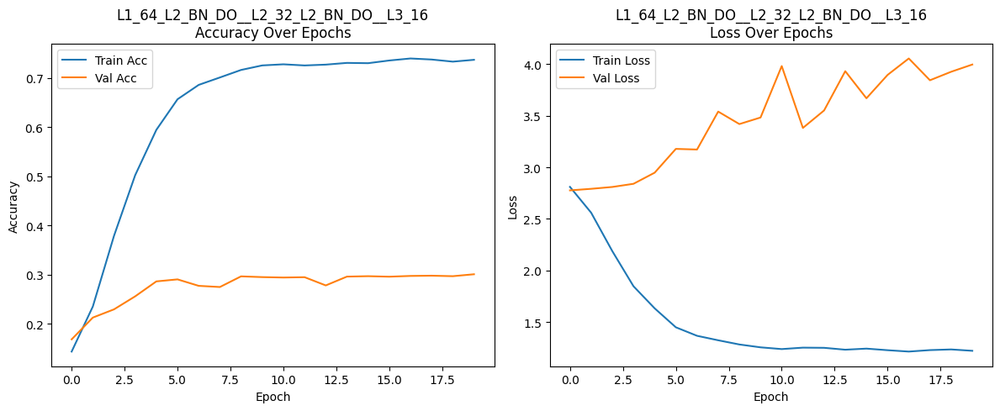

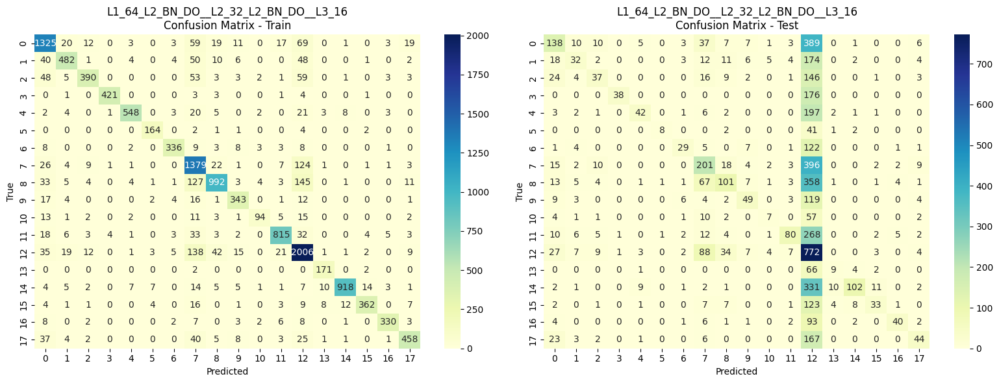

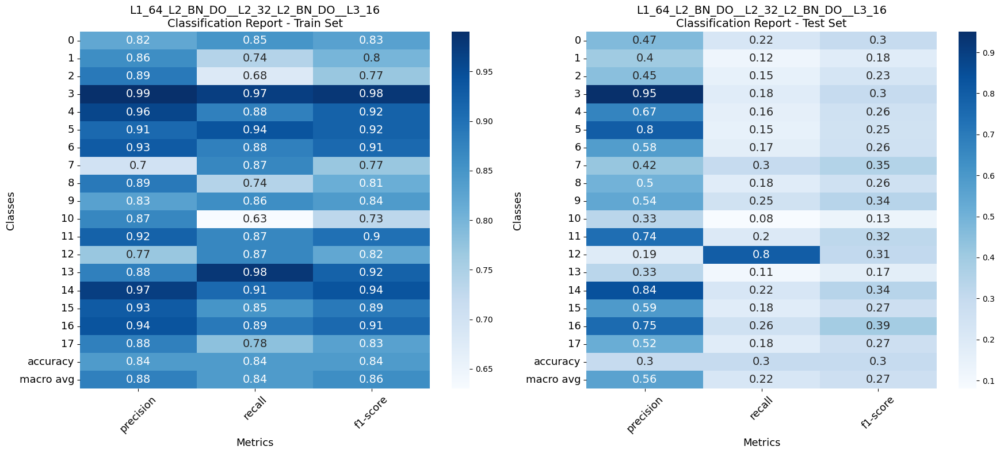

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 64	dropout: True	batchnorm:True	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235B95D0620>
part: L1_64_L2_BN_DO
Adding batch normalization
Adding Dropout:0.3
Adding regularization
i: 2 neurons: 32	dropout: True	batchnorm:True	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x00000235DF7E1580>
part: L2_32_L2_BN_DO
Adding batch normalization
Adding Dropout:0.3
Adding regularization
i: 3 neurons: 16	dropout: True	batchnorm:True	l2:True reg:<keras.src.regularizers.regularizers.L2 object at 0x0000023584923B90>
part: L3_16_L2_BN_DO
Adding batch normalization
Adding Dropout:0.3
Adding regularization
L1_64_L2_BN_DO__L2_32_L2_BN_DO__L3_16_L2_BN_DO


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │       832,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_102 (Activation)     │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_43 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_103 (Activation)     │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_44 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_104 (Activation)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_45 (Dropout)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,506,408 (9.56 MB)

 Trainable params: 835,394 (3.19 MB)

 Non-trainable params: 224 (896.00 B)

 Optimizer params: 1,670,790 (6.37 MB)

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Model: L1_64_L2_BN_DO__L2_32_L2_BN_DO__L3_16_L2_BN_DO
Training time: 0:01:02


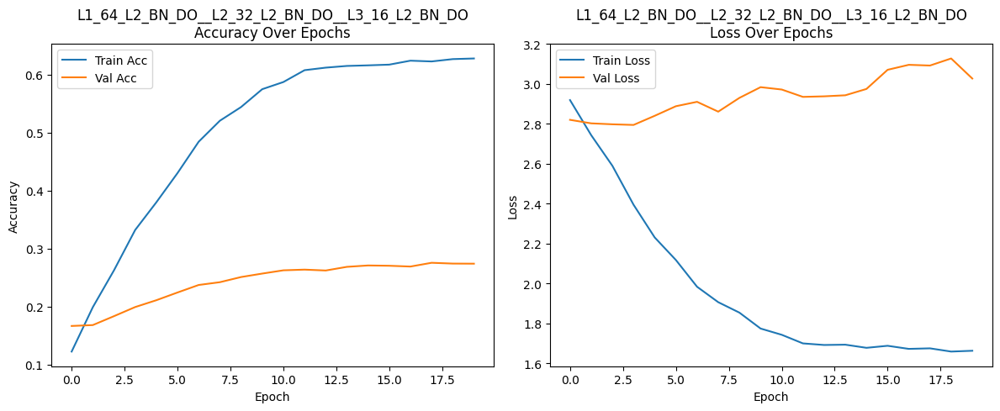

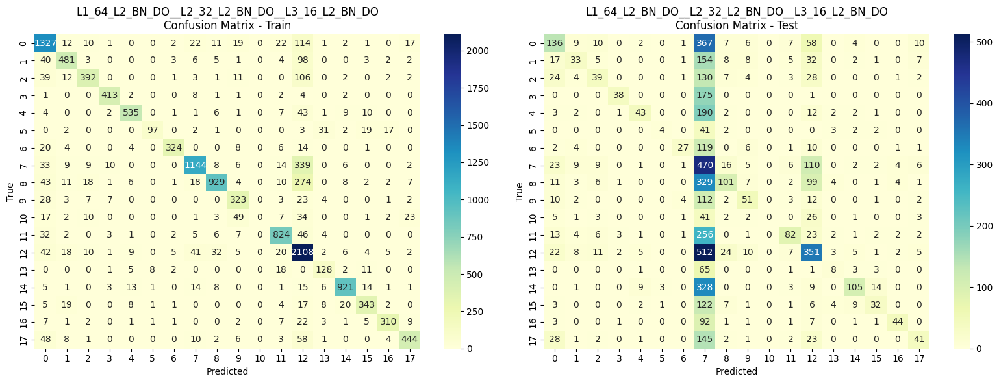

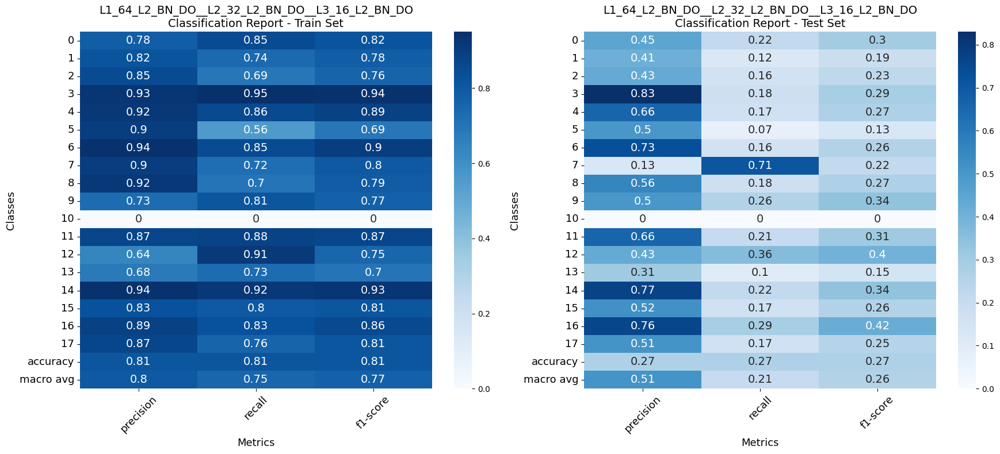

In [138]:
info_4=trainmultiplemodels(model_functions_4)

                                             Model  Train Accuracy  \
4                     L1_64_L2_BN_DO__L2_32__L3_16          0.8517   
15                 L1_64_BN_DO__L2_32_BN_DO__L3_16          0.8574   
3                        L1_64_BN_DO__L2_32__L3_16          0.8624   
10                          L1_64_L2__L2_32__L3_16          0.8350   
1                           L1_64_DO__L2_32__L3_16          0.8606   
17           L1_64_L2_BN_DO__L2_32_L2_BN_DO__L3_16          0.8444   
5                        L1_64_DO__L2_32_DO__L3_16          0.8563   
2                        L1_64_L2_DO__L2_32__L3_16          0.8054   
18  L1_64_L2_BN_DO__L2_32_L2_BN_DO__L3_16_L2_BN_DO          0.8085   
0                              L1_64__L2_32__L3_16          0.8614   
16           L1_64_BN_DO__L2_32_BN_DO__L3_16_BN_DO          0.8359   
6                     L1_64_DO__L2_32_DO__L3_16_DO          0.8311   
7                           L1_64_BN__L2_32__L3_16          0.8635   
9                   

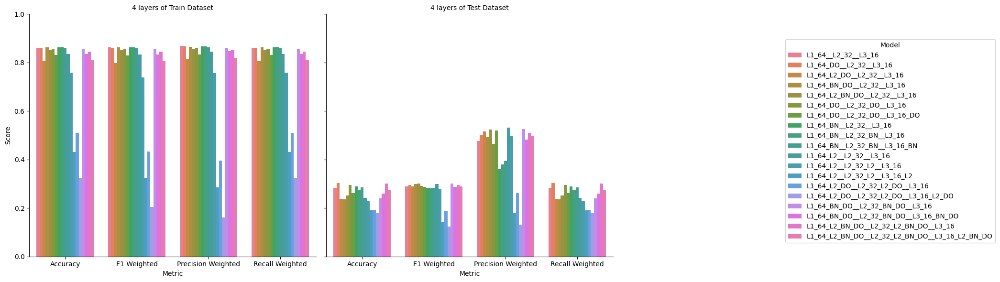

In [175]:
summary_4 = []

# for name, res in info.items():
#     summary.append({
#         'Model': name,
#         'Train Accuracy': res['train_accuracy'],
#         'Test Accuracy': res['test_accuracy'],
#         'Train Precision': res['train_precision'],
#         'Test Precision': res['test_precision'],
#         'Train Recall': res['train_recall'],
#         'Test Recall': res['test_recall'],
#         'Train F1-score': res['train_f1_score'],
#         'Test F1-score': res['test_f1_score'],
#         'Training Time': res['training_time']
#     })
for name, res in info_4.items():
    summary_4.append({
        'Model': name,
        'Train Accuracy': res['train_accuracy'],
        'Test Accuracy': res['test_accuracy'],
        'Train Precision Macro': res['train_precision_macro'],
        'Test Precision Macro': res['test_precision_macro'],
        'Train Recall Macro': res['train_recall_macro'],
        'Test Recall Macro': res['test_recall_macro'],
        'Train F1 Macro': res['train_f1_score_macro'],
        'Test F1 Macro': res['test_f1_score_macro'],
        'Train Precision Weighted': res['train_precision_weighted'],
        'Test Precision Weighted': res['test_precision_weighted'],
        'Train Recall Weighted': res['train_recall_weighted'],
        'Test Recall Weighted': res['test_recall_weighted'],
        'Train F1 Weighted': res['train_f1_score_weighted'],
        'Test F1 Weighted': res['test_f1_score_weighted'],
        'Training Time': res['training_time']
    })
summary_df_4 = pd.DataFrame(summary_4)
print(summary_df_4.sort_values(by='Test F1 Weighted', ascending=False))
# Choose metrics you want to visualize
metrics = ['Accuracy', 'F1 Weighted', 'Precision Weighted', 'Recall Weighted']

# Prepare data in long format for seaborn
plot_data = []

for metric in metrics:
    for split in ['Train', 'Test']:
        col = f"{split} {metric}"
        df_tmp = summary_df_4[['Model', col]].copy()
        df_tmp.columns = ['Model', 'Score']
        df_tmp['Metric'] = metric
        df_tmp['Dataset'] = split
        plot_data.append(df_tmp)

plot_df = pd.concat(plot_data)
# Create the catplot
g = sns.catplot(
    data=plot_df,
    x='Metric',
    y='Score',
    hue='Model',
    col='Dataset',
    kind='bar',
    height=6,
    aspect=1
)

# Titles and axis labels
g.set_titles("4 layers of {col_name} Dataset")
g.set_axis_labels("Metric", "Score")
g.set(ylim=(0, 1))

# Remove default legend
g._legend.remove()

# Add new legend outside the plot (right side)
g.fig.legend(
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    borderaxespad=0,
    title='Model'
)

# Adjust layout to make room for legend
g.fig.subplots_adjust(right=0.8)  # shrink plot area to make room on the right

plt.show()

In [ ]:
print("bad model")
print(summary_df_4.loc[summary_df_4['Train Accuracy']<0.6,'Model'].values)
baselinetestf1 = summary_df_4.loc[0,'Test F1 Weighted']
print(f"baseline's testf1: {baselinetestf1}")
print(summary_df_4.loc[summary_df_4['Test F1 Weighted']>=baselinetestf1,'Model'].values)
summary_df_4.loc[summary_df_4['Test F1 Weighted']>=baselinetestf1]

bad model
['L1_64_L2__L2_32_L2__L3_16_L2' 'L1_64_L2_DO__L2_32_L2_DO__L3_16'
 'L1_64_L2_DO__L2_32_L2_DO__L3_16_L2_DO']
baseline's testf1: 0.2888
['L1_64__L2_32__L3_16' 'L1_64_DO__L2_32__L3_16'
 'L1_64_L2_DO__L2_32__L3_16' 'L1_64_BN_DO__L2_32__L3_16'
 'L1_64_L2_BN_DO__L2_32__L3_16' 'L1_64_DO__L2_32_DO__L3_16'
 'L1_64_L2__L2_32__L3_16' 'L1_64_BN_DO__L2_32_BN_DO__L3_16'
 'L1_64_L2_BN_DO__L2_32_L2_BN_DO__L3_16'
 'L1_64_L2_BN_DO__L2_32_L2_BN_DO__L3_16_L2_BN_DO']


,Model,Train Accuracy,Test Accuracy,Train Precision Macro,Test Precision Macro,Train Recall Macro,Test Recall Macro,Train F1 Macro,Test F1 Macro,Train Precision Weighted,Test Precision Weighted,Train Recall Weighted,Test Recall Weighted,Train F1 Weighted,Test F1 Weighted,Training Time
0,L1_64__L2_32__L3_16,0.8614,0.2832,0.8987,0.5451,0.8580,0.2206,0.8749,0.2740,0.8694,0.4765,0.8614,0.2832,0.8619,0.2888,0:00:53
1,L1_64_DO__L2_32__L3_16,0.8606,0.3020,0.8934,0.5459,0.8637,0.2207,0.8761,0.2770,0.8674,0.5005,0.8606,0.3020,0.8606,0.2955,0:00:55
2,L1_64_L2_DO__L2_32__L3_16,0.8054,0.2388,0.8471,0.5125,0.7423,0.2043,0.7618,0.2461,0.8142,0.5167,0.8054,0.2388,0.7983,0.2899,0:01:01
3,L1_64_BN_DO__L2_32__L3_16,0.8624,0.2361,0.8906,0.4245,0.8643,0.2289,0.8762,0.2508,0.8654,0.4913,0.8624,0.2361,0.8625,0.2989,0:00:53
4,L1_64_L2_BN_DO__L2_32__L3_16,0.8517,0.2520,0.8815,0.5352,0.8533,0.2312,0.8659,0.2712,0.8553,0.5241,0.8517,0.2520,0.8521,0.3011,0:01:03
5,L1_64_DO__L2_32_DO__L3_16,0.8563,0.2954,0.8911,0.5406,0.8532,0.2210,0.8695,0.2759,0.8605,0.4643,0.8563,0.2954,0.8565,0.2915,0:00:58
10,L1_64_L2__L2_32__L3_16,0.8350,0.2414,0.8463,0.5154,0.8057,0.2158,0.8085,0.2647,0.8445,0.5319,0.8350,0.2414,0.8327,0.2989,0:01:04
15,L1_64_BN_DO__L2_32_BN_DO__L3_16,0.8574,0.2407,0.8835,0.4917,0.8577,0.2247,0.8692,0.2617,0.8599,0.5257,0.8574,0.2407,0.8575,0.3006,0:00:56
17,L1_64_L2_BN_DO__L2_32_L2_BN_DO__L3_16,0.8444,0.3010,0.8847,0.5606,0.8448,0.2167,0.8610,0.2741,0.8535,0.5103,0.8444,0.3010,0.8453,0.2941,0:01:03
18,L1_64_L2_BN_DO__L2_32_L2_BN_DO__L3_16_L2_BN_DO,0.8085,0.2742,0.7998,0.5086,0.7537,0.2075,0.7705,0.2566,0.8196,0.4966,0.8085,0.2742,0.8058,0.2895,0:01:02


In [176]:
selected4layer=summary_df_4.loc[summary_df_4['Test F1 Weighted']>=baselinetestf1]

In [143]:
summary_df_4.loc[:,["Model",'Test F1 Weighted']]

,Model,Test F1 Weighted
0,L1_64__L2_32__L3_16,0.2888
1,L1_64_DO__L2_32__L3_16,0.2955
2,L1_64_L2_DO__L2_32__L3_16,0.2899
3,L1_64_BN_DO__L2_32__L3_16,0.2989
4,L1_64_L2_BN_DO__L2_32__L3_16,0.3011
5,L1_64_DO__L2_32_DO__L3_16,0.2915
6,L1_64_DO__L2_32_DO__L3_16_DO,0.2865
7,L1_64_BN__L2_32__L3_16,0.2837
8,L1_64_BN__L2_32_BN__L3_16,0.2817
9,L1_64_BN__L2_32_BN__L3_16_BN,0.2837


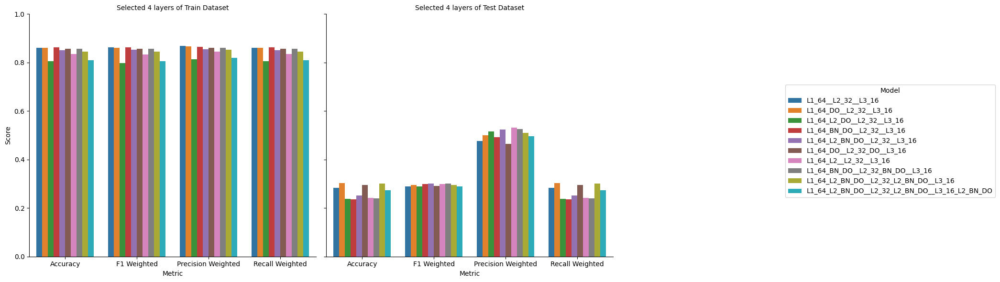

In [180]:
### selected 4 layers

# Prepare data in long format for seaborn
plot_data = []

for metric in metrics:
    for split in ['Train', 'Test']:
        col = f"{split} {metric}"
        df_tmp = selected4layer[['Model', col]].copy()
        df_tmp.columns = ['Model', 'Score']
        df_tmp['Metric'] = metric
        df_tmp['Dataset'] = split
        plot_data.append(df_tmp)

plot_df = pd.concat(plot_data)
# Create the catplot
g = sns.catplot(
    data=plot_df,
    x='Metric',
    y='Score',
    hue='Model',
    col='Dataset',
    kind='bar',
    height=6,
    aspect=1
)

# Titles and axis labels
g.set_titles("Selected 4 layers of {col_name} Dataset")
g.set_axis_labels("Metric", "Score")
g.set(ylim=(0, 1))

# Remove default legend
g._legend.remove()

# Add new legend outside the plot (right side)
g.fig.legend(
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    borderaxespad=0,
    title='Model'
)

# Adjust layout to make room for legend
g.fig.subplots_adjust(right=0.8)  # shrink plot area to make room on the right


c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 128	dropout: False	batchnorm:False	l2:False reg:None
part: L1_128
i: 2 neurons: 64	dropout: False	batchnorm:False	l2:False reg:None
part: L2_64
i: 3 neurons: 32	dropout: False	batchnorm:False	l2:False reg:None
part: L3_32
i: 4 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L4_16
L1_128__L2_64__L3_32__L4_16


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_272 (Dense)               │ (None, 128)            │     1,664,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_105 (Activation)     │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_273 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_106 (Activation)     │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_107 (Activation)     │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_108 (Activation)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,027,048 (19.18 MB)

 Trainable params: 1,675,682 (6.39 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,351,366 (12.78 MB)


Model: L1_128__L2_64__L3_32__L4_16
Training time: 0:02:05


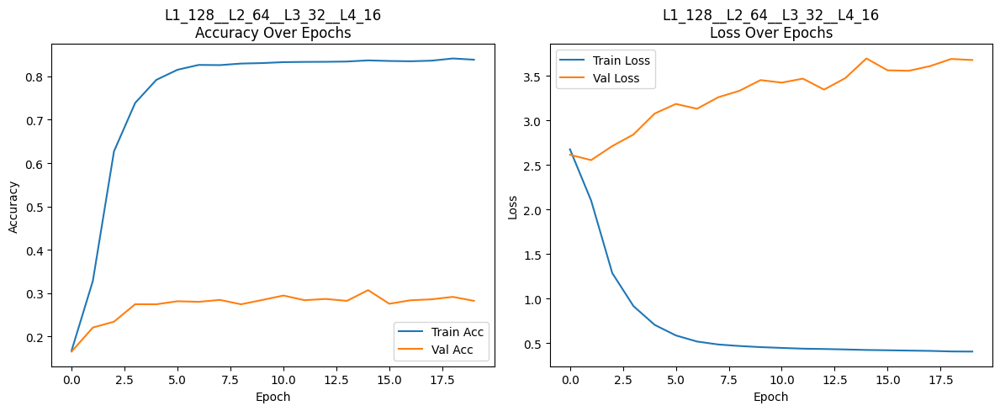

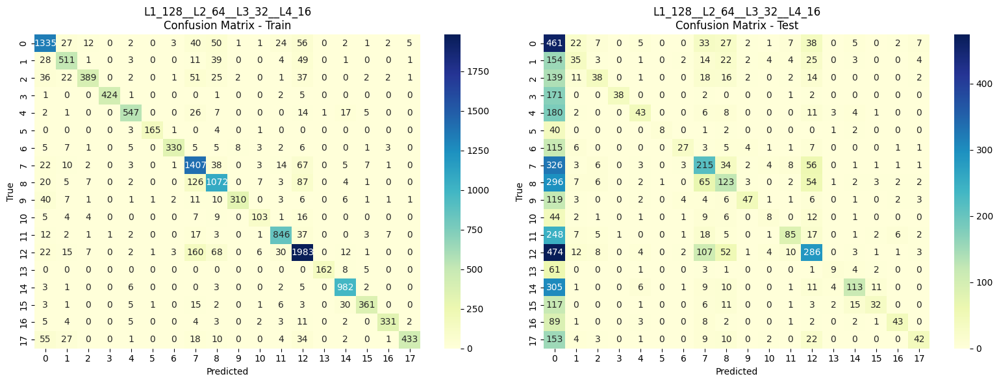

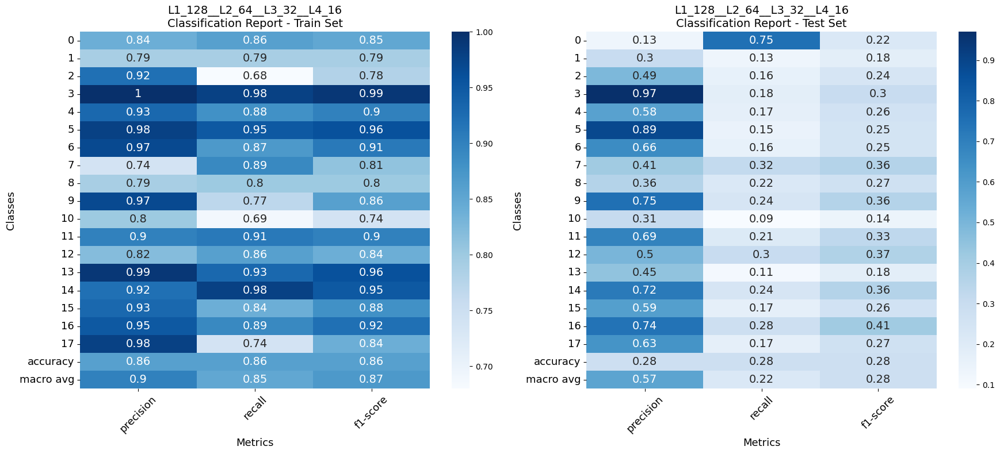

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 128	dropout: True	batchnorm:True	l2:False reg:None
part: L1_128_BN_DO
Adding batch normalization
Adding Dropout:0.3
i: 2 neurons: 64	dropout: False	batchnorm:False	l2:False reg:None
part: L2_64
i: 3 neurons: 32	dropout: False	batchnorm:False	l2:False reg:None
part: L3_32
i: 4 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L4_16
L1_128_BN_DO__L2_64__L3_32__L4_16


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_277 (Dense)               │ (None, 128)            │     1,664,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_109 (Activation)     │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_46 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_110 (Activation)     │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_111 (Activation)     │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_280 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_112 (Activation)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,028,072 (19.18 MB)

 Trainable params: 1,675,938 (6.39 MB)

 Non-trainable params: 256 (1.00 KB)

 Optimizer params: 3,351,878 (12.79 MB)


Model: L1_128_BN_DO__L2_64__L3_32__L4_16
Training time: 0:02:19


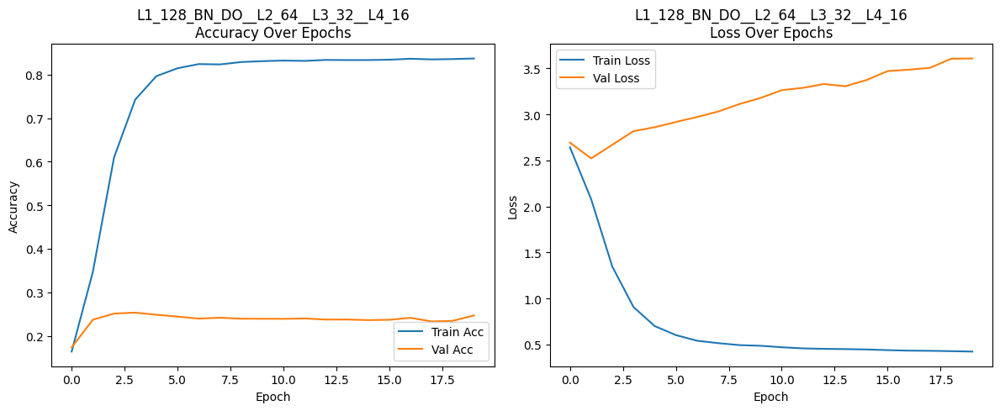

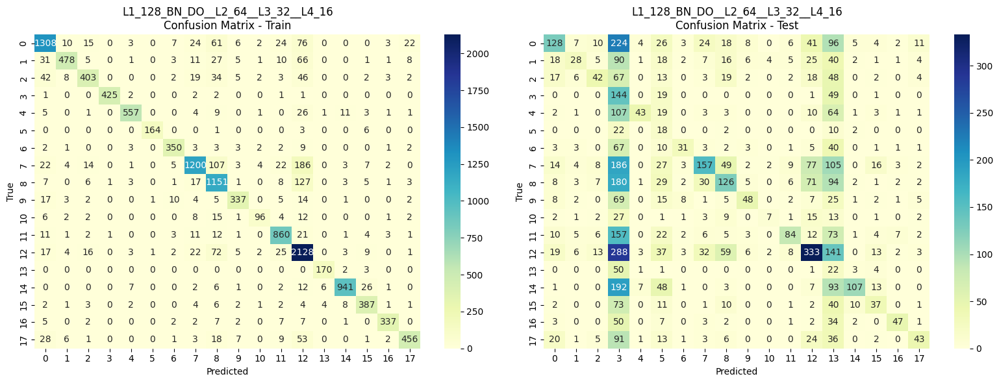

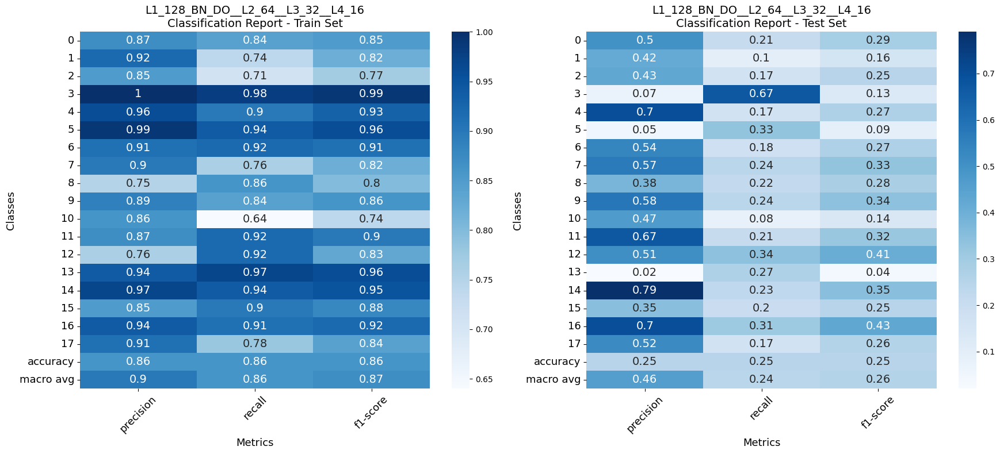

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 256	dropout: False	batchnorm:False	l2:False reg:None
part: L1_256
i: 2 neurons: 128	dropout: False	batchnorm:False	l2:False reg:None
part: L2_128
i: 3 neurons: 64	dropout: False	batchnorm:False	l2:False reg:None
part: L3_64
i: 4 neurons: 32	dropout: False	batchnorm:False	l2:False reg:None
part: L4_32
i: 5 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L5_16
L1_256__L2_128__L3_64__L4_32__L5_16


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_282 (Dense)               │ (None, 256)            │     3,329,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_113 (Activation)     │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_114 (Activation)     │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_115 (Activation)     │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_116 (Activation)     │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_117 (Activation)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_287 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,119,272 (38.60 MB)

 Trainable params: 3,373,090 (12.87 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,746,182 (25.73 MB)


Model: L1_256__L2_128__L3_64__L4_32__L5_16
Training time: 0:04:12


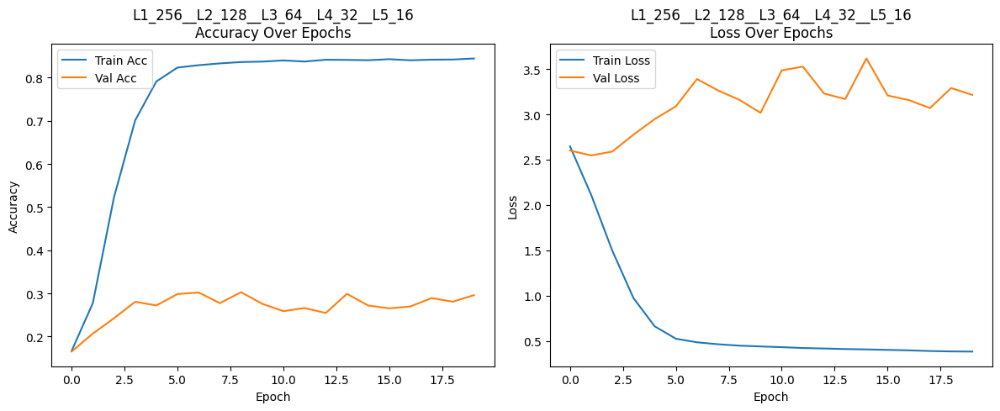

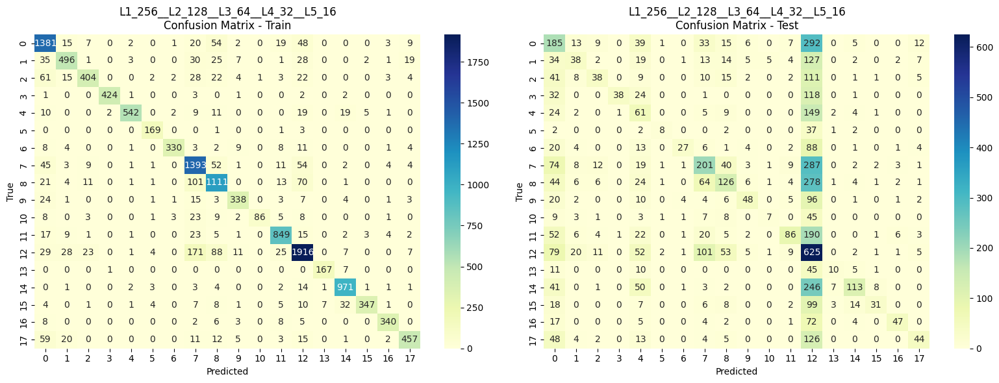

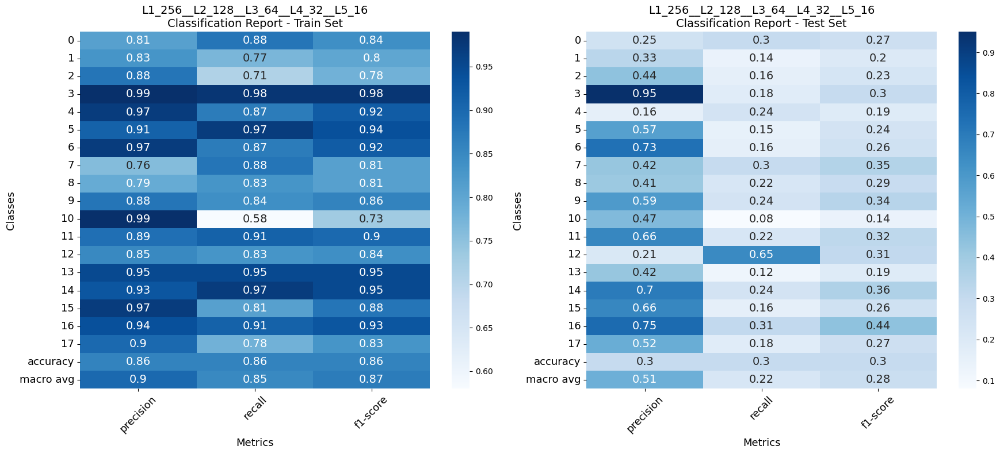

c:\Users\Peter_PPT\anaconda3\envs\dlenv\Lib\site-packages\keras\src\layers\core\input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


i: 1 neurons: 256	dropout: True	batchnorm:True	l2:False reg:None
part: L1_256_BN_DO
Adding batch normalization
Adding Dropout:0.3
i: 2 neurons: 128	dropout: False	batchnorm:False	l2:False reg:None
part: L2_128
i: 3 neurons: 64	dropout: False	batchnorm:False	l2:False reg:None
part: L3_64
i: 4 neurons: 32	dropout: False	batchnorm:False	l2:False reg:None
part: L4_32
i: 5 neurons: 16	dropout: False	batchnorm:False	l2:False reg:None
part: L5_16
L1_256_BN_DO__L2_128__L3_64__L4_32__L5_16


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_288 (Dense)               │ (None, 256)            │     3,329,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_28          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_118 (Activation)     │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_47 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_119 (Activation)     │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_120 (Activation)     │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_121 (Activation)     │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_122 (Activation)     │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 18)             │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,121,320 (38.61 MB)

 Trainable params: 3,373,602 (12.87 MB)

 Non-trainable params: 512 (2.00 KB)

 Optimizer params: 6,747,206 (25.74 MB)


Model: L1_256_BN_DO__L2_128__L3_64__L4_32__L5_16
Training time: 0:05:33


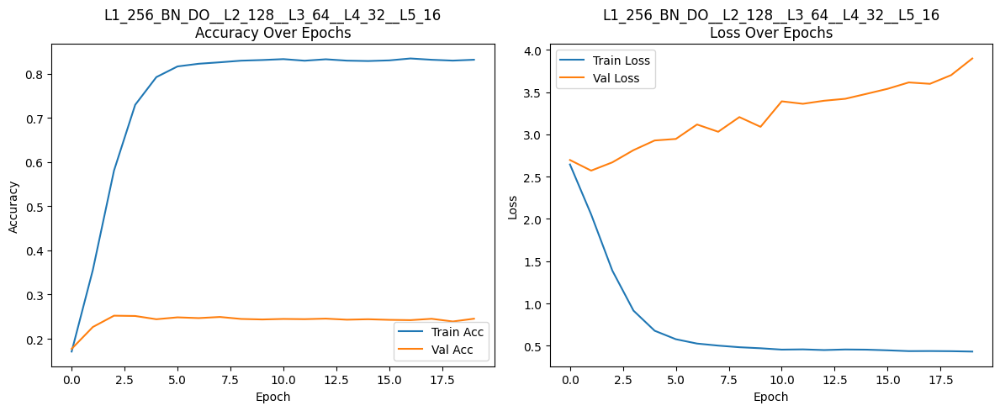

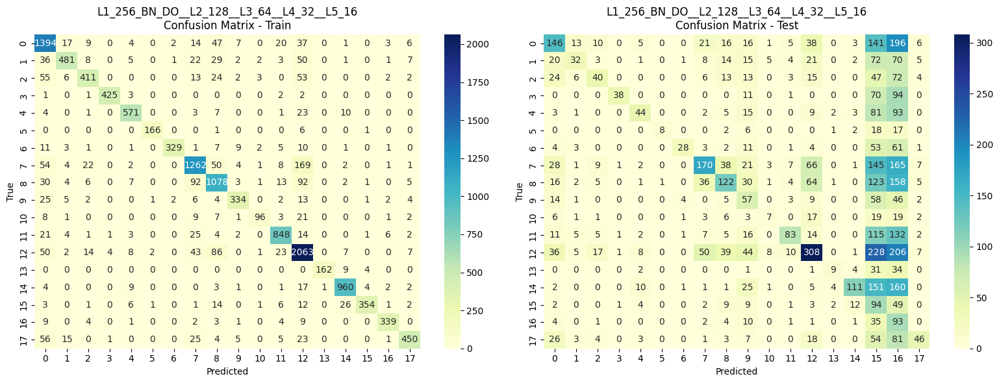

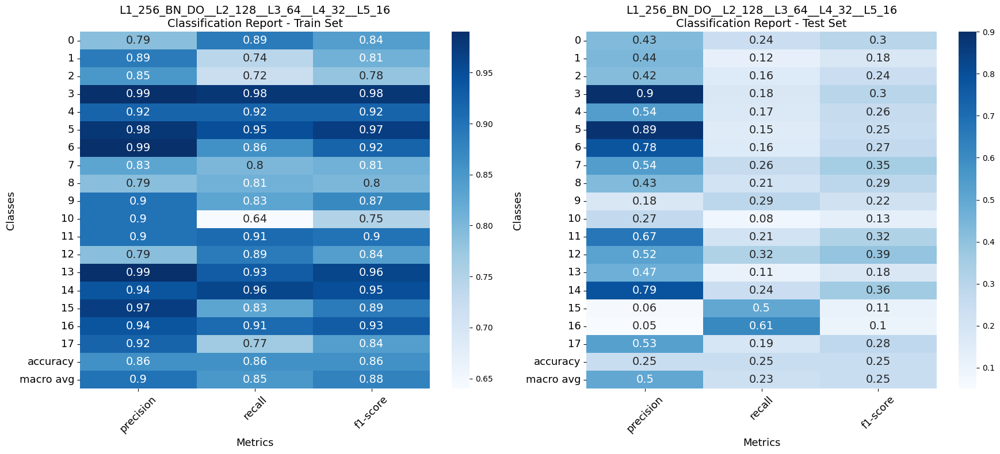

                                       Model  Train Accuracy  Test Accuracy  \
1          L1_128_BN_DO__L2_64__L3_32__L4_16          0.8601         0.2468   
0                L1_128__L2_64__L3_32__L4_16          0.8559         0.2824   
3  L1_256_BN_DO__L2_128__L3_64__L4_32__L5_16          0.8583         0.2453   
2        L1_256__L2_128__L3_64__L4_32__L5_16          0.8581         0.2960   

   Train Precision Macro  Test Precision Macro  Train Recall Macro  \
1                 0.8968                0.4598              0.8594   
0                 0.9005                0.5651              0.8500   
3                 0.9039                0.4959              0.8527   
2                 0.9000                0.5125              0.8527   

   Test Recall Macro  Train F1 Macro  Test F1 Macro  Train Precision Weighted  \
1             0.2416          0.8748         0.2569                    0.8675   
0             0.2241          0.8716         0.2789                    0.8622   
3         

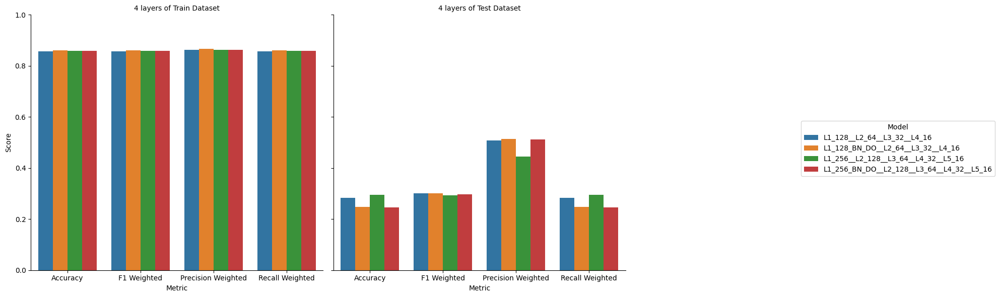

In [ ]:
hidden_units_list_5 = [
    ##1 4layer
    [128,64,32, 16],
    [128,64,32, 16],
    ##2 4layer add dropout1
    [256,128,64,32, 16],
    [256,128,64,32, 16]
]

configs_list_5 = [
    [   ##1 4layer
        {'dropout': False,  'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##2 4layer add dropoout1
        {'dropout': True,  'l2': False, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##3 4layer add dropoout1 L21
        {'dropout': False,  'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ],
    [   ##4 4layer add dropout1 Batchnorm1
        {'dropout': True,  'l2': False, 'batchnorm': True},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
        {'dropout': False, 'l2': False, 'batchnorm': False},
    ]
]

model_functions_5 = list(zip(hidden_units_list_5, configs_list_5))
info_more=trainmultiplemodels(model_functions_5)

                                       Model  Train Accuracy  Test Accuracy  \
1          L1_128_BN_DO__L2_64__L3_32__L4_16          0.8601         0.2468   
0                L1_128__L2_64__L3_32__L4_16          0.8559         0.2824   
3  L1_256_BN_DO__L2_128__L3_64__L4_32__L5_16          0.8583         0.2453   
2        L1_256__L2_128__L3_64__L4_32__L5_16          0.8581         0.2960   

   Train Precision Macro  Test Precision Macro  Train Recall Macro  \
1                 0.8968                0.4598              0.8594   
0                 0.9005                0.5651              0.8500   
3                 0.9039                0.4959              0.8527   
2                 0.9000                0.5125              0.8527   

   Test Recall Macro  Train F1 Macro  Test F1 Macro  Train Precision Weighted  \
1             0.2416          0.8748         0.2569                    0.8675   
0             0.2241          0.8716         0.2789                    0.8622   
3         

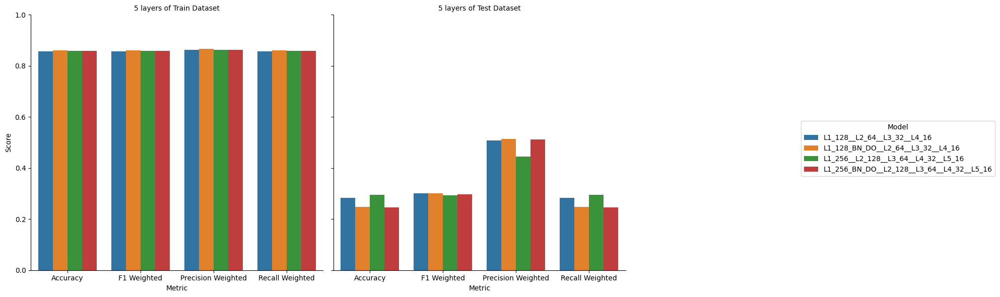

In [204]:

summary_5 = []

# for name, res in info.items():
#     summary.append({
#         'Model': name,
#         'Train Accuracy': res['train_accuracy'],
#         'Test Accuracy': res['test_accuracy'],
#         'Train Precision': res['train_precision'],
#         'Test Precision': res['test_precision'],
#         'Train Recall': res['train_recall'],
#         'Test Recall': res['test_recall'],
#         'Train F1-score': res['train_f1_score'],
#         'Test F1-score': res['test_f1_score'],
#         'Training Time': res['training_time']
#     })
for name, res in info_more.items():
    summary_5.append({
        'Model': name,
        'Train Accuracy': res['train_accuracy'],
        'Test Accuracy': res['test_accuracy'],
        'Train Precision Macro': res['train_precision_macro'],
        'Test Precision Macro': res['test_precision_macro'],
        'Train Recall Macro': res['train_recall_macro'],
        'Test Recall Macro': res['test_recall_macro'],
        'Train F1 Macro': res['train_f1_score_macro'],
        'Test F1 Macro': res['test_f1_score_macro'],
        'Train Precision Weighted': res['train_precision_weighted'],
        'Test Precision Weighted': res['test_precision_weighted'],
        'Train Recall Weighted': res['train_recall_weighted'],
        'Test Recall Weighted': res['test_recall_weighted'],
        'Train F1 Weighted': res['train_f1_score_weighted'],
        'Test F1 Weighted': res['test_f1_score_weighted'],
        'Training Time': res['training_time']
    })
summary_df_5 = pd.DataFrame(summary_5)
print(summary_df_5.sort_values(by='Test F1 Weighted', ascending=False))
# Choose metrics you want to visualize
metrics = ['Accuracy', 'F1 Weighted', 'Precision Weighted', 'Recall Weighted']

# Prepare data in long format for seaborn
plot_data = []

for metric in metrics:
    for split in ['Train', 'Test']:
        col = f"{split} {metric}"
        df_tmp = summary_df_5[['Model', col]].copy()
        df_tmp.columns = ['Model', 'Score']
        df_tmp['Metric'] = metric
        df_tmp['Dataset'] = split
        plot_data.append(df_tmp)

plot_df = pd.concat(plot_data)
# Create the catplot
g = sns.catplot(
    data=plot_df,
    x='Metric',
    y='Score',
    hue='Model',
    col='Dataset',
    kind='bar',
    height=6,
    aspect=1
)

# Titles and axis labels
g.set_titles("5 layers of {col_name} Dataset")
g.set_axis_labels("Metric", "Score")
g.set(ylim=(0, 1))

# Remove default legend
g._legend.remove()

# Add new legend outside the plot (right side)
g.fig.legend(
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    borderaxespad=0,
    title='Model'
)

# Adjust layout to make room for legend
g.fig.subplots_adjust(right=0.8)  # shrink plot area to make room on the right

plt.show()

bad model
[]
baseline's testf1: 0.3011
['L1_128__L2_64__L3_32__L4_16' 'L1_128_BN_DO__L2_64__L3_32__L4_16']


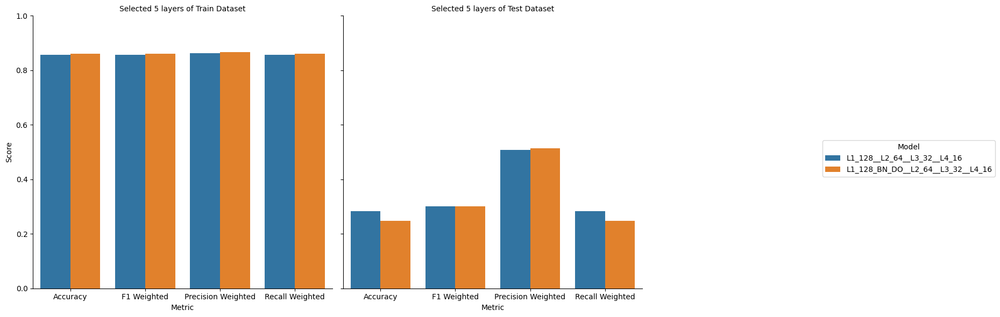

In [205]:
print("bad model")
print(summary_df_5.loc[summary_df_5['Train Accuracy']<0.6,'Model'].values)
baselinetestf1 = summary_df_5.loc[0,'Test F1 Weighted']
print(f"baseline's testf1: {baselinetestf1}")
print(summary_df_5.loc[summary_df_5['Test F1 Weighted']>=baselinetestf1,'Model'].values)
summary_df_5.loc[summary_df_5['Test F1 Weighted']>=baselinetestf1]
selected5layer=summary_df_5.loc[summary_df_5['Test F1 Weighted']>=baselinetestf1]
### selected 4 layers

# Prepare data in long format for seaborn
plot_data = []

for metric in metrics:
    for split in ['Train', 'Test']:
        col = f"{split} {metric}"
        df_tmp = selected5layer[['Model', col]].copy()
        df_tmp.columns = ['Model', 'Score']
        df_tmp['Metric'] = metric
        df_tmp['Dataset'] = split
        plot_data.append(df_tmp)

plot_df = pd.concat(plot_data)
# Create the catplot
g = sns.catplot(
    data=plot_df,
    x='Metric',
    y='Score',
    hue='Model',
    col='Dataset',
    kind='bar',
    height=6,
    aspect=1
)

# Titles and axis labels
g.set_titles("Selected 5 layers of {col_name} Dataset")
g.set_axis_labels("Metric", "Score")
g.set(ylim=(0, 1))

# Remove default legend
g._legend.remove()

# Add new legend outside the plot (right side)
g.fig.legend(
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    borderaxespad=0,
    title='Model'
)

# Adjust layout to make room for legend
g.fig.subplots_adjust(right=0.8)  # shrink plot area to make room on the right


In [ ]:
summary_df_3['Training Time']
trainingtimes = pd.DataFrame()
trainingtimes['Model Type']=['3 layers', '4 layers', '5 layers', '6 layers']
trainingtimes['Training Time']=[summary_df_3.loc[0,'Training Time'],summary_df_4.loc[0,'Training Time']]

0     0:00:31
1     0:00:34
2     0:00:31
3     0:00:32
4     0:00:34
5     0:00:33
6     0:00:32
7     0:00:32
8     0:00:35
9     0:00:35
10    0:00:37
11    0:00:38
12    0:00:38
Name: Training Time, dtype: object

In [207]:
## combined all 
selected = pd.concat([selected_3,selected4layer],axis=1)
selected = pd.concat([selected, selected5layer],axis=1)
print(selected.columns)
print(selected)


Index(['Model', 'Train Accuracy', 'Test Accuracy', 'Train Precision Macro',
       'Test Precision Macro', 'Train Recall Macro', 'Test Recall Macro',
       'Train F1 Macro', 'Test F1 Macro', 'Train Precision Weighted',
       'Test Precision Weighted', 'Train Recall Weighted',
       'Test Recall Weighted', 'Train F1 Weighted', 'Test F1 Weighted',
       'Training Time', 'Model', 'Train Accuracy', 'Test Accuracy',
       'Train Precision Macro', 'Test Precision Macro', 'Train Recall Macro',
       'Test Recall Macro', 'Train F1 Macro', 'Test F1 Macro',
       'Train Precision Weighted', 'Test Precision Weighted',
       'Train Recall Weighted', 'Test Recall Weighted', 'Train F1 Weighted',
       'Test F1 Weighted', 'Training Time', 'Model', 'Train Accuracy',
       'Test Accuracy', 'Train Precision Macro', 'Test Precision Macro',
       'Train Recall Macro', 'Test Recall Macro', 'Train F1 Macro',
       'Test F1 Macro', 'Train Precision Weighted', 'Test Precision Weighted',
       'Tr

In [ ]:
selected

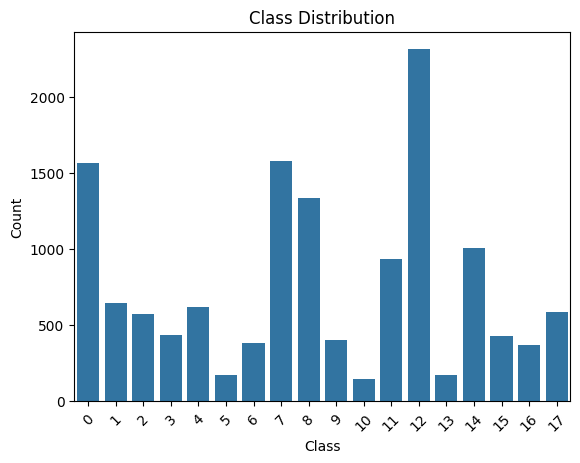

In [149]:

# Assuming y_train or your full labels are in a Series
sns.countplot(x=y_train)
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)